<a href="https://colab.research.google.com/github/Joovvhan/korean-stt/blob/master/notebooks/CTC_train_eval_Colab_Result_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
import torch
import torch.nn as nn
from torch import optim
from torch.autograd import Variable

import os
import numpy as np
import scipy as sp
import matplotlib.pyplot as plt
import librosa
import random
import copy

from tqdm import tqdm_notebook as tqdm
from datetime import datetime

In [2]:
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/gdrive


In [3]:
n_mels = 80
fs = 44100
frame_length_ms=50
frame_shift_ms=25
nsc = int(fs * frame_length_ms / 1000)
nov = nsc - int(fs * frame_shift_ms / 1000)
nhop = int(fs * frame_shift_ms / 1000)
eps = 1e-8
db_ref = 160

meta_path = 'gdrive/My Drive/korean-single-speaker-speech-dataset/transcript.v.1.2.txt'
data_folder = 'gdrive/My Drive/korean-single-speaker-speech-dataset/kss'


with open(meta_path, encoding='utf-8') as f:
    metadata = np.array([line.strip().split('|') for line in f])

max_sequence_len = max(list(map(len, metadata[:, 1])))

error_jamos = [5868, 5998, 6046, 6155, 6202, 
               6654, 6890, 7486, 7502, 7744, 
               7765, 8267, 9069, 9927, 10437, 
               10515, 10533, 10606, 10610, 12777]

print(metadata.shape)
metadata = np.delete(metadata, error_jamos, axis = 0)
print(metadata.shape)

dataset_size = len(metadata)

(12853, 5)
(12833, 5)


In [0]:
character_length = list()
file_length = list()
division_length = list()
unicode_jamo_list = list()

for i in range(len(metadata)):
    character_length.append(len(metadata[i, 3]))
    file_length.append(float(metadata[i, 4]))
    division_length.append(float(metadata[i, 4]) * 1000 / len(metadata[i, 3]))

In [0]:
wave_name_list = []

for data in metadata:
    wave_name_list.append(data[0])

In [6]:
unicode_jamo_list = list()
for unicode in range(0x1100, 0x1113):
    unicode_jamo_list.append(chr(unicode))
    
for unicode in range(0x1161, 0x1176):
    unicode_jamo_list.append(chr(unicode))
    
for unicode in range(0x11A8, 0x11C3):
    unicode_jamo_list.append(chr(unicode))
    
unicode_jamo_list += [' ', '!', ',', '.', '?', '<sos>', '<eos>']
    
unicode_jamo_list.sort()

unicode_jamo_list = ['-'] + unicode_jamo_list

print(unicode_jamo_list)
print(len(unicode_jamo_list))

['-', ' ', '!', ',', '.', '<eos>', '<sos>', '?', 'ᄀ', 'ᄁ', 'ᄂ', 'ᄃ', 'ᄄ', 'ᄅ', 'ᄆ', 'ᄇ', 'ᄈ', 'ᄉ', 'ᄊ', 'ᄋ', 'ᄌ', 'ᄍ', 'ᄎ', 'ᄏ', 'ᄐ', 'ᄑ', 'ᄒ', 'ᅡ', 'ᅢ', 'ᅣ', 'ᅤ', 'ᅥ', 'ᅦ', 'ᅧ', 'ᅨ', 'ᅩ', 'ᅪ', 'ᅫ', 'ᅬ', 'ᅭ', 'ᅮ', 'ᅯ', 'ᅰ', 'ᅱ', 'ᅲ', 'ᅳ', 'ᅴ', 'ᅵ', 'ᆨ', 'ᆩ', 'ᆪ', 'ᆫ', 'ᆬ', 'ᆭ', 'ᆮ', 'ᆯ', 'ᆰ', 'ᆱ', 'ᆲ', 'ᆳ', 'ᆴ', 'ᆵ', 'ᆶ', 'ᆷ', 'ᆸ', 'ᆹ', 'ᆺ', 'ᆻ', 'ᆼ', 'ᆽ', 'ᆾ', 'ᆿ', 'ᇀ', 'ᇁ', 'ᇂ']
75


In [0]:
class Tokenizer():
    def __init__(self, vocabs):
        self.vocabs = vocabs
        
    def word2num(self, sentence):
        tokens = list()
        for char in sentence:
            tokens.append(self.vocabs.index(char))    
        return tokens
        
    def word2vec(self, sentence):
        vectors = np.zeros((len(sentence), len(self.vocabs)))
        for i, char in enumerate(sentence):
            vectors[i, self.vocabs.index(char)] = 1   
        return vectors
    
    def num2word(self, num):
        output = list()
        for i in num:
            output.append(self.vocabs[i])
        return output
    
    def num2vec(self, numbers):
        vectors = np.zeros((len(numbers), len(self.vocabs)))
        for i, num in enumerate(numbers):
            vectors[i, num] = 1   
        return vectors

In [0]:
tokenizer = Tokenizer(unicode_jamo_list)
jamo_tokens = tokenizer.word2num(unicode_jamo_list)

In [9]:
mel_path_list = list()

for i, wav_name in enumerate(tqdm(wave_name_list)):
    
    npy_name = wav_name.replace('.wav', '.npy')
    wav_path = os.path.join(data_folder, wav_name)  
    mel_path = os.path.join(data_folder + '/mel', npy_name)
    mel_path_list.append(mel_path)
    
    if not os.path.isfile(mel_path):
#         print("{}".format(mel_path))
        y, sr = librosa.core.load(wav_path)
        f, t, Zxx = sp.signal.stft(y, fs=sr, nperseg=nsc, noverlap=nov)
        Sxx = np.abs(Zxx)
        Sxx = np.maximum(Sxx, eps)

        # plt.figure(figsize=(20,20))
        # plt.imshow(20*np.log10(Sxx), origin='lower')
        # plt.colorbar()
        # plt.show()

        mel_filters = librosa.filters.mel(sr=fs, n_fft=nsc, n_mels=n_mels)
        mel_specgram = np.matmul(mel_filters, Sxx)

    #   log_specgram = 20*np.log10(Sxx)
    #   norm_log_specgram = (log_specgram + db_ref) / db_ref

        log_mel_specgram = 20 * np.log10(np.maximum(mel_specgram, eps))
        norm_log_mel_specgram = (log_mel_specgram + db_ref) / db_ref

    #   np.save(specgram_path, norm_log_specgram)
        np.save(mel_path, norm_log_mel_specgram)
    #   np.save(specgram_path, Sxx)

    #     print(norm_log_mel_specgram.shape[1])

    #     if i % 1000 == 0:
    #         plt.figure(figsize=(8, 4))
    #         plt.imshow(20 * np.log10(Sxx), origin='lower', aspect='auto')
    #         plt.colorbar()
    #         plt.show()

    #         plt.figure(figsize=(8, 4))
    #         plt.imshow(norm_log_mel_specgram, origin='lower', aspect='auto')
    #         plt.colorbar()
    #         plt.show()    

In [0]:
class ResidualGRU(nn.Module):
    def __init__(self, D_in, bidirectional=True):
        super(ResidualGRU, self).__init__()
        self.gru = nn.GRU(D_in, int(D_in/2), bidirectional=bidirectional, batch_first=True)
        self.relu = nn.ReLU()
        
    def forward(self, input_tensor):
        
#         print("Residual Input: {}".format(input_tensor.shape))
        gru_output, _ = self.gru(input_tensor)
        activated = self.relu(gru_output)  
#         print("Residual Output: {}".format(activated.shape))
        output_tensor = torch.add(activated, input_tensor)
        
        return output_tensor

In [0]:
class Encoder(nn.Module):
    def __init__(self, D_in, H):
        super(Encoder, self).__init__()
        self.H = H
        
        self.fc = torch.nn.Linear(D_in, H)
        self.relu = torch.nn.ReLU()
        self.dropout = nn.Dropout(p=0.5)
        
        self.gru = nn.GRU(H, int(H/2), bidirectional=True, batch_first=True)

    def forward(self, input_tensor):
            
        output_tensor = self.fc(input_tensor)
        output_tensor = self.relu(output_tensor)
        output_tensor = self.dropout(output_tensor)
        
        output_tensor, _ = self.gru(output_tensor)
        
        return output_tensor
    
class CTC_Decoder(nn.Module):
    def __init__(self, H, D_out):
        super(CTC_Decoder, self).__init__()
        self.H = H
        
        self.fc_embed = nn.Linear(H, H)
        self.relu_embed = torch.nn.ReLU()
        self.dropout_embed = nn.Dropout(p=0.5)
        
        self.gru = nn.GRU(H, D_out, batch_first=True)
        
        self.fc = nn.Linear(D_out, 75)
        self.log_softmax = nn.LogSoftmax(dim=2)

    def forward(self, input_tensor):

        output_tensor = self.fc_embed(input_tensor)
        output_tensor = self.relu_embed(output_tensor)
        output_tensor = self.dropout_embed(output_tensor)
        
        output_tensor,_ = self.gru(input_tensor)

        output_tensor = self.fc(output_tensor)
        
        prediction_tensor = self.log_softmax(output_tensor)

        return prediction_tensor

class Mel2SeqNet():
    def __init__(self, D_in, H, D_out):
        super(Mel2SeqNet, self).__init__()
        
        device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        
        self.H = H
        
        self.encoder = Encoder(D_in, H).to(device)
        self.embedding_layer = nn.Embedding(len(jamo_tokens), 256).to(device)
        self.decoder = CTC_Decoder(H, D_out).to(device)

        self.encoder_optimizer = optim.Adam(self.encoder.parameters(), lr=0.001)
        self.decoder_optimizer = optim.Adam(self.decoder.parameters(), lr=0.001)
        self.embedding_optimizer = optim.Adam(self.embedding_layer.parameters(), lr=0.001)

#         self.criterion = nn.CrossEntropyLoss(reduction='none').to(device)
        self.ctc_loss = nn.CTCLoss().to(device)
        
        for param in self.encoder.parameters():
            param.data.uniform_(-0.1, 0.1)
        for param in self.embedding_layer.parameters():
            param.data.uniform_(-0.1, 0.1)
        for param in self.decoder.parameters():
            param.data.uniform_(-0.1, 0.1)

    def train(self, input_tensor, ground_truth, loss_mask, target_lengths):
        
        batch_size = input_tensor.shape[0]

        self.encoder_optimizer.zero_grad()
        self.decoder_optimizer.zero_grad()
        self.embedding_optimizer.zero_grad()

        encoded_tensor = self.encoder(input_tensor)

        pred_tensor = self.decoder(encoded_tensor)
            
        truth = ground_truth
        truth = truth.type(torch.cuda.LongTensor)
        
        pred_tensor = pred_tensor.permute(1, 0, 2)
        
        input_lengths = torch.full(size=(batch_size,), fill_value=pred_tensor.shape[0], dtype=torch.long)
        
#         print(pred_tensor)

        loss = self.ctc_loss(pred_tensor, truth, input_lengths, target_lengths)

        loss.backward()

        self.encoder_optimizer.step()
        self.decoder_optimizer.step()
        self.embedding_optimizer.step()
        
        return pred_tensor, loss.item() / ground_truth.shape[1]
    
    def test(self, input_tensor, ground_truth, loss_mask, target_lengths):
        
        batch_size = input_tensor.shape[0]

        encoded_tensor = self.encoder(input_tensor)

        pred_tensor = self.decoder(encoded_tensor)
            
        truth = ground_truth
        truth = truth.type(torch.cuda.LongTensor)
        
        pred_tensor = pred_tensor.permute(1, 0, 2)
        
        input_lengths = torch.full(size=(batch_size,), fill_value=pred_tensor.shape[0], dtype=torch.long)

        loss = self.ctc_loss(pred_tensor, truth, input_lengths, target_lengths)

        return pred_tensor, loss.item() / ground_truth.shape[1]
    
    def save(self, check_point_name):
        torch.save({
            'embedding_layer_state_dict': self.embedding_layer.state_dict(),
            'encoder_state_dict': self.encoder.state_dict(),
            'decoder_state_dict': self.decoder.state_dict(),
            'embedding_optimizer_state_dict': self.embedding_optimizer.state_dict(),
            'encoder_optimizer_state_dict': self.encoder_optimizer.state_dict(),
            'decoder_optimizer_state_dict': self.decoder_optimizer.state_dict(),
            }, check_point_name)
    
    def load(self, check_point_name):
        checkpoint = torch.load(check_point_name)
        self.embedding_layer.load_state_dict(checkpoint['embedding_layer_state_dict'])
        self.encoder.load_state_dict(checkpoint['encoder_state_dict'])
        self.decoder.load_state_dict(checkpoint['decoder_state_dict'])
        self.embedding_optimizer.load_state_dict(checkpoint['embedding_optimizer_state_dict'])
        self.encoder_optimizer.load_state_dict(checkpoint['encoder_optimizer_state_dict'])
        self.decoder_optimizer.load_state_dict(checkpoint['decoder_optimizer_state_dict'])
    
        self.embedding_layer.eval()
        self.encoder.eval()
        self.decoder.eval()
        
        self.embedding_layer.train()
        self.encoder.train()
        self.decoder.train()
        
    def set_mode(self, mode):
        
        if mode == 'train':
            self.embedding_layer.train()
            self.encoder.train()
            self.decoder.train()
            
        elif mode == 'eval':
            self.embedding_layer.eval()
            self.encoder.eval()
            self.decoder.eval()
            
        else:
            print("Invalid mode string: {}".format(mode))
    
# net = Mel2SeqNet(80, 512, 256)

net = Mel2SeqNet(80, 1024, 512)

In [12]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")      
print(device)

cuda:0


In [0]:
class Batched_Preloader():
    def __init__(self, mel_path_list, ground_truth_list, batch_size):
        super(Batched_Preloader).__init__()
        self.mel_path_list = mel_path_list
        self.total_num_input = len(mel_path_list)
        self.tensor_input_list = [None] * self.total_num_input
        self.ground_truth_list = ground_truth_list
        self.sentence_length_list = np.asarray(list(map(len, ground_truth_list)))
#         self.shuffle_step = 4
        self.shuffle_step = 12
        self.loading_sequence = None
        self.end_flag = True
        self.batch_size = batch_size
    
    def load(self, i):
        norm_log_mel_specgram = np.load(self.mel_path_list[i])
        input_spectrogram = norm_log_mel_specgram.T
        tensor_input = torch.tensor(input_spectrogram).view(1, input_spectrogram.shape[0], input_spectrogram.shape[1])
        self.tensor_input_list[i] = tensor_input
        
    def get(self, i):
        if type(self.tensor_input_list[i]) == type(None):
            self.load(i)
        return self.tensor_input_list[i]  
    
    
    def initialize_preloader(self):
        for i in tqdm(range(self.total_num_input)):
            self.load(i)
        
        return
    
    def initialize_batch(self):
        loading_sequence = np.argsort(self.sentence_length_list)
        bundle = np.stack([self.sentence_length_list[loading_sequence], loading_sequence])
        
        for seq_len in range(self.shuffle_step, np.max(self.sentence_length_list), self.shuffle_step):
            idxs = np.where((bundle[0, :] > seq_len) & (bundle[0, :] <= seq_len + self.shuffle_step))[0]
            idxs_origin = copy.deepcopy(idxs)
            random.shuffle(idxs)
            bundle[:, idxs_origin] = bundle[:, idxs]
            
        loading_sequence = bundle[1, :]
        
        self.loading_sequence = loading_sequence
        self.current_loading_index = 0
        self.end_flag = False
        
        return
    
    def get_batch(self):
        
        tensor_list = list()
        ground_truth_list = list()
        tensor_size_list = list()
        ground_truth_size_list = list()
        
        count = 0
        max_seq_len = 0
        max_sen_len = 0
        
        for i in range(self.batch_size):
            
            if self.current_loading_index >= self.total_num_input:
                self.end_flag = True
                break
            
            tensor = self.get(self.loading_sequence[self.current_loading_index])
            tensor_list.append(tensor)
            tensor_size_list.append(tensor.shape[1])
            
            ground_truth = self.ground_truth_list[self.loading_sequence[self.current_loading_index]]
            ground_truth_list.append(ground_truth)
            ground_truth_size_list.append(len(ground_truth))
            
            
            if (tensor.shape[1] > max_seq_len):
                max_seq_len = tensor.shape[1]
            if (len(ground_truth) > max_sen_len):
                max_sen_len = len(ground_truth)  
            
            self.current_loading_index += 1
            count += 1
            
        batched_tensor = torch.zeros(count, max_seq_len + 5, n_mels)
        batched_ground_truth = torch.zeros(count, max_sen_len)
        batched_loss_mask = torch.zeros(count, max_sen_len)
        ground_truth_size_list = torch.tensor(np.asarray(ground_truth_size_list), dtype=torch.long)
        
        for order in range(count):
            
            target = tensor_list[order]
        
            pad_random = np.random.randint(0, 5)
            
            if pad_random > 0:
                offset = torch.zeros(target.shape[0], pad_random, target.shape[2])
                target = torch.cat((offset, target), 1)
                
            target = target + (torch.rand(target.shape) - 0.5) / 20
        
            target = torch.clamp(target, min=0.0, max=1.0)
            
            batched_tensor[order, :tensor_size_list[order] + pad_random, :] = target
            batched_ground_truth[order, :ground_truth_size_list[order]] = torch.tensor(ground_truth_list[order])
            batched_loss_mask[order, :ground_truth_size_list[order]] = torch.ones(ground_truth_size_list[order])
        
        return batched_tensor, batched_ground_truth, batched_loss_mask, ground_truth_size_list


In [0]:
ground_truth_list = [(tokenizer.word2num(list(metadata[i, 3]) + ['<eos>'])) for i in range(len(metadata))]

In [19]:
print(len(mel_path_list))

print(len(ground_truth_list))

split_index = int(0.8 * len(mel_path_list))

print(split_index)

mel_path_list_train = mel_path_list[:split_index]
ground_truth_list_train = ground_truth_list[:split_index]

print(len(mel_path_list_train))

mel_path_list_test = mel_path_list[split_index:]
ground_truth_list_test = ground_truth_list[split_index:]

print(len(mel_path_list_test))

12833
12833
10266
10266
2567


In [21]:
# preloader = Batched_Preloader(mel_path_list, ground_truth_list, 64)

preloader_test = Batched_Preloader(mel_path_list_test, ground_truth_list_test, 128)
preloader_test.initialize_preloader()

preloader_train = Batched_Preloader(mel_path_list_train, ground_truth_list_train, 128)
preloader_train.initialize_preloader()

In [0]:
def Decode_CTC_Prediction(prediction):
    CTC_pred = prediction.detach().cpu().numpy()
    result = list()
    last_elem = 0
    for i, elem in enumerate(CTC_pred):
        if elem != last_elem and elem != 0:
            result.append(elem)
        
        last_elem = elem
        
    
    result = np.asarray(result)
    
    return result

In [27]:
loss_history_train = list()
loss_history_eval = list()

try:
    loss_history_train = np.load('gdrive/My Drive/korean-single-speaker-speech-dataset/kss/model_saved/loss_history_train_2.npy').tolist()
    loss_history_eval = np.load('gdrive/My Drive/korean-single-speaker-speech-dataset/kss/model_saved/loss_history_eval_2.npy').tolist()
except:
    print("Loading Failed")

Loading Failed


09-01 13:51:28
Mean Train Loss: 0.027507595686156443
Mean Evaluation Loss: 0.02856399103511837
-------------------------------------------------------------------------------------------------------
09-01 13:51:47
Mean Train Loss: 0.027022661872421812
Mean Evaluation Loss: 0.030153159049104334
-------------------------------------------------------------------------------------------------------
09-01 13:52:07
Mean Train Loss: 0.027297325727902864
Mean Evaluation Loss: 0.029513880041883406
-------------------------------------------------------------------------------------------------------
09-01 13:52:28
Mean Train Loss: 0.027399870483510485
Mean Evaluation Loss: 0.029101866163375522
-------------------------------------------------------------------------------------------------------
09-01 13:52:48
Mean Train Loss: 0.026897664234137232
Mean Evaluation Loss: 0.028505817327850017
-------------------------------------------------------------------------------------------------------
0

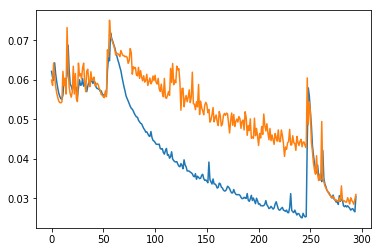

이---------------- 시-기 에 십게ᅦ 살에 수-장는ᆫ  이-레 잘이 중장에 새-애이ᄋ이ᄃ라--------ᅳ-- --닥 숙자-에 아-고ᅩᆫ 타-이-다---------   ᅩ---ᄉ수---------------흔.<eos><eos>
이 시기 에 십게 살에 수장는 이레 잘이 중장에 새애이이ᄃ라ᅳ 닥 숙자에 아곤 타이다 ᅩ수흔.<eos>
이 수의 십의 자리 숫자는 일의 자리 숫자의 세 배이다. 각 숫자의 합은 팔이다. 이 수는?<eos>---------


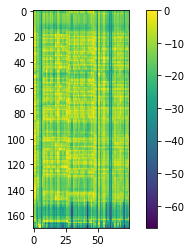

어-----------디 나ᅡᆫ제-ᄂ는---  우-긴ᆫ하-아에ᄉ서ᅥ  가-장ᆼᅵ 이--기-이ᄂ는-  이-구- 수-손 징한-아---------------해요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
어디 난제는 우긴하아에서 가장ᅵ 이기이는 이구 수손 징한아해요.<eos>
어린 왕자는 우리나라에서 가장 인기 있는 외국 소설 중 하나예요.<eos>-----------------


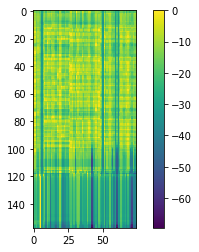

-------------------------------------------------------------------------------------------------------
09-01 13:53:47
Mean Train Loss: 0.028895471635228574
Mean Evaluation Loss: 0.031376618195623276
-------------------------------------------------------------------------------------------------------
09-01 13:54:08
Mean Train Loss: 0.028002332757098153
Mean Evaluation Loss: 0.029713547006539144
-------------------------------------------------------------------------------------------------------
09-01 13:54:28
Mean Train Loss: 0.026719879330800386
Mean Evaluation Loss: 0.028487641398276583
-------------------------------------------------------------------------------------------------------
09-01 13:54:48
Mean Train Loss: 0.026639412013689853
Mean Evaluation Loss: 0.029898937994413906
-------------------------------------------------------------------------------------------------------
09-01 13:55:08
Mean Train Loss: 0.026319596159350474
Mean Evaluation Loss: 0.029728839240599155


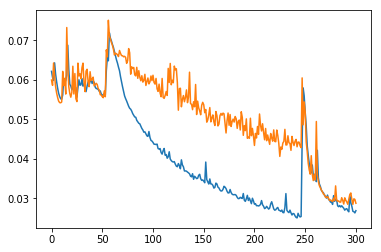

허------------ᆫ말가ᅡ가  거ᅥ츠-하ᄅᄅᆯᆯ랬는 데---------  나ᅡ자ᄌ에 거ᅥ직 ᅡᅡᆯ라ᅡ-것 대-무-에--  ᄋ언ᄆᄆ하-이  다-우-어--ᆻᆻ-------------어요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
헌말가가 거츠하ᄅᆯ랬는 데 나자ᄌ에 거직 ᅡᆯ라것 대무에 언ᄆ하이 다우었어요.<eos>
혼날까 봐 거짓말을 했는데, 나중에 거짓말을 한 것 때문에 엄마한테 더 혼났어요.<eos>---------


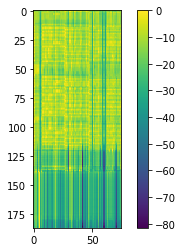

요-------------------즘-마ᄂ는ᆫᆫ---  장기  ᅮᅮ몬이ᅵ 민낭 상앵 임을ᆯ---  종굥가ᅡᄌ지 아ᄂ는ᄋᄋᆨ드ᅳᅳ   많----------------------아요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
요즘마는 장기 ᅮ몬이 민낭 상앵 임을 종굥가지 아는ᄋᆨ드 많아요.<eos>
요즘에는 자기 부모님이나 선생님을 존경하지 않는 아이들이 많아요.<eos>------------


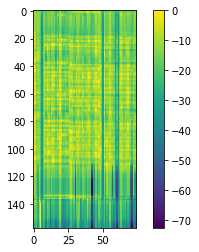

-------------------------------------------------------------------------------------------------------
09-01 13:55:48
Mean Train Loss: 0.02665154678428712
Mean Evaluation Loss: 0.029280081576945997
-------------------------------------------------------------------------------------------------------
09-01 13:56:07
Mean Train Loss: 0.02603914323600438
Mean Evaluation Loss: 0.0290547078164074
-------------------------------------------------------------------------------------------------------
09-01 13:56:27
Mean Train Loss: 0.028053579821415795
Mean Evaluation Loss: 0.029860280596174425
-------------------------------------------------------------------------------------------------------
09-01 13:56:47
Mean Train Loss: 0.026848170333868937
Mean Evaluation Loss: 0.029229549424038985
-------------------------------------------------------------------------------------------------------
09-01 13:57:06
Mean Train Loss: 0.026025057860626314
Mean Evaluation Loss: 0.03059626118527457
-----

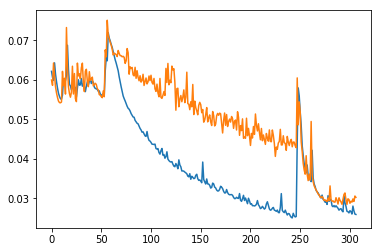

이--------------  시-의 시ᅵᅵ-에 자리ᅵ 주-자ᅡᄂᄂᆫ   이-기-잘리 숫자-의  샐애-이-다------------  가ᅡ 숙 자-이-아-군ᆫ 파-이-다--------   이-시 수----------------흔..<eos><eos><eos>
이 시의 시에 자리 주자ᄂᆫ 이기잘리 숫자의 샐애이다 가 숙 자이아군 파이다 이시 수흔.<eos>
이 수의 십의 자리 숫자는 일의 자리 숫자의 세 배이다. 각 숫자의 합은 팔이다. 이 수는?<eos>---------


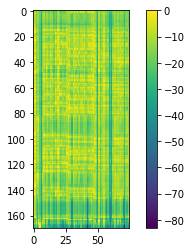

이------------ᆫᆫ낭에-는ᆫᆫ---  ᅡᅡ-샌ᅳᅳ의 송-반-하ᅡᆨ을-  자-롱-게이-는 선싱인-드  ᄋ있어-ᆻᆻᆻ--------------어요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
인낭에는 ᅡ샌ᅳ의 송반학을 자롱게이는 선싱인드 있었어요.<eos>
옛날에는 학생들의 손바닥을 자로 때리는 선생님들이 있었어요.<eos>--------------


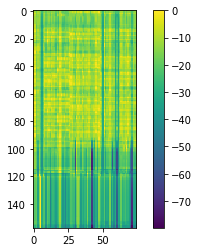

-------------------------------------------------------------------------------------------------------
09-01 13:57:47
Mean Train Loss: 0.026461328261730203
Mean Evaluation Loss: 0.029319757845412096
-------------------------------------------------------------------------------------------------------
09-01 13:58:07
Mean Train Loss: 0.026308084485076457
Mean Evaluation Loss: 0.03022351814217235
-------------------------------------------------------------------------------------------------------
09-01 13:58:27
Mean Train Loss: 0.027045421997778492
Mean Evaluation Loss: 0.029795287544303654
-------------------------------------------------------------------------------------------------------
09-01 13:58:46
Mean Train Loss: 0.02595603461456815
Mean Evaluation Loss: 0.02975827910382684
-------------------------------------------------------------------------------------------------------
09-01 13:59:06
Mean Train Loss: 0.02614083103057029
Mean Evaluation Loss: 0.03204401440562851
-----

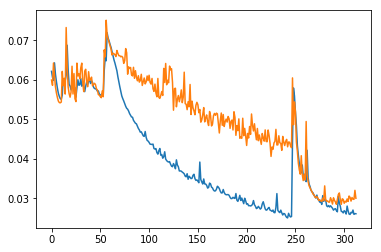

그-----------------ᄅ로-시-가-일 하-지--대-면ᆫ--- 그-려- 한 ᄀ경가ᅡᅡ- 굴루-자ᄃ드ᅳᅳᆯ 살ᅵᅵ릴-지-이--   개-시-들-것이ᅵ--ᆸᆸ----------------ᄂ니다..<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
그로시가일 하지대면 그려 한 경가 굴루자들 살ᅵ릴지이 개시들것입니다.<eos>
근로 시간이 단축되면 근로 환경과 근로자들의 삶의 질이 개선될 것입니다.<eos>------------------


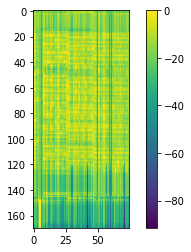

저------------------난 일국ᄉ시 이-잔ᄋ  우 시ᄋᆫ 수-닌-개-는ᆫ---  수-주-산-용은 성이ᅵ스ᅳ를  지-공ᄒ하--ᆸᆸ------------니다..<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
저난 일국시 이잔ᄋ 우 시ᄋᆫ 수닌개는 수주산용은 성이스를 지공합니다.<eos>
저녁 일곱 시 이전에 오시는 손님께는 소주 한 병을 서비스로 제공합니다.<eos>-------


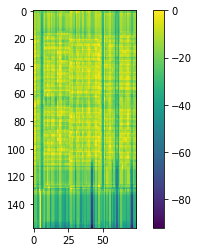

-------------------------------------------------------------------------------------------------------
09-01 13:59:47
Mean Train Loss: 0.025161948347933907
Mean Evaluation Loss: 0.029242597699233028
-------------------------------------------------------------------------------------------------------
09-01 14:00:07
Mean Train Loss: 0.025615199056455453
Mean Evaluation Loss: 0.030022511733032713
-------------------------------------------------------------------------------------------------------
09-01 14:00:26
Mean Train Loss: 0.025622020627602965
Mean Evaluation Loss: 0.02867614463842751
-------------------------------------------------------------------------------------------------------
09-01 14:00:46
Mean Train Loss: 0.025101455613116577
Mean Evaluation Loss: 0.029726358481492923
-------------------------------------------------------------------------------------------------------
09-01 14:01:07
Mean Train Loss: 0.025045561739086994
Mean Evaluation Loss: 0.029062211659751553
-

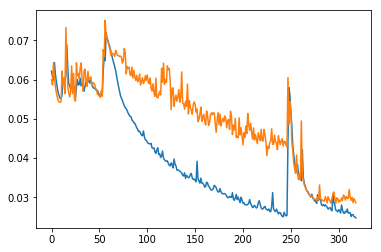

저----------은 기-가 어-도-는-대----  다-든 사-람이 에-길ᆯᆯᆯ-  아-지ᅵ  달ᆯᅳᆯ로-준 다ᄂ는 말을-   많이 들러-애---ᆻ-------------어요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
저은 기가 어도는대 다든 사람이 에길 아지 달ᅳᆯ로준 다는 말을 많이 들러앴어요.<eos>
저는 귀가 어두운데 다른 사람의 얘기를 아주 잘 들어 준다는 말을 많이 들어왔어요.<eos>-----------


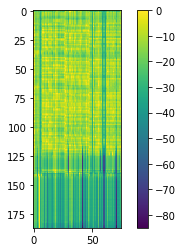

우---------리ᅵ  ᅢᅢ-하-에ᄂ는ᆫ--  애-국기 이-영 생을ᆯ이-ᄒᆫ ᄒ항국고  강장하ᅡ 많안 ᅵᅵ에 있스ᅳ-ᆸᆸᆸ----------니다..<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
우리 ᅢ하에는 애국기 이영 생을이ᄒᆫ 항국고 강장하 많안 ᅵ에 있습니다.<eos>
우리 대학에는 외국인 유학생을 위한 한국어 강좌가 마련되어 있습니다.<eos>--------


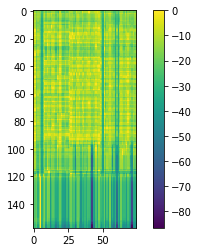

-------------------------------------------------------------------------------------------------------
09-01 14:01:47
Mean Train Loss: 0.02474250989721663
Mean Evaluation Loss: 0.028267546771296826
-------------------------------------------------------------------------------------------------------
09-01 14:02:07
Mean Train Loss: 0.025095986066910856
Mean Evaluation Loss: 0.028748385890413064
-------------------------------------------------------------------------------------------------------
09-01 14:02:27
Mean Train Loss: 0.024528187068469782
Mean Evaluation Loss: 0.028526999890165956
-------------------------------------------------------------------------------------------------------
09-01 14:02:46
Mean Train Loss: 0.024456121294539314
Mean Evaluation Loss: 0.028137096408397313
-------------------------------------------------------------------------------------------------------
09-01 14:03:06
Mean Train Loss: 0.024443399355860238
Mean Evaluation Loss: 0.028666695504557842
-

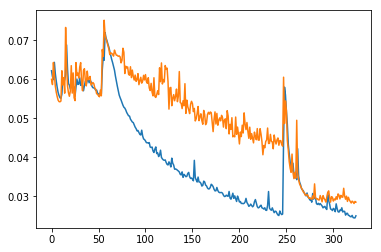

호-----------날가ᅡ아  거ᅥ주 마ᄅ를 ᄂᆻ는 데-ᅦᅦ-----   나ᅡ자ᄌ세 거ᅥ짐 ᅡᅡᆯ라ᅡ-거ᅥ 가  부-해-  엉머하ᅡ데  더-언-나--ᆻᆻ--------------어요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
호날가아 거주 마를 ᄂᆻ는 데ᅦ 나자ᄌ세 거짐 ᅡᆯ라거 가 부해 엉머하데 더언났어요.<eos>
혼날까 봐 거짓말을 했는데, 나중에 거짓말을 한 것 때문에 엄마한테 더 혼났어요.<eos>---------


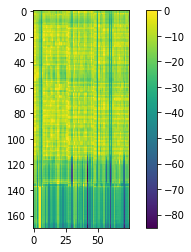

여------------------ᆼᆼ간 우-든ᄒᄒᆫᆼ명에 에-국이ᅳ  관간-이-들이-  처-온으ᅳᆯ 감문하-고 이--------------ᆻᆻ다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
영간 우든ᄒᆫᆼ명에 에국이ᅳ 관간이들이 처온을 감문하고 있다.<eos>
연간 오백만 명의 외국인 관광객들이 서울을 방문하고 있다.<eos>-----------------


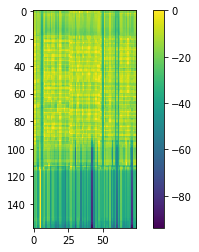

-------------------------------------------------------------------------------------------------------
09-01 14:03:46
Mean Train Loss: 0.025589152551749605
Mean Evaluation Loss: 0.03008769053888008
-------------------------------------------------------------------------------------------------------
09-01 14:04:06
Mean Train Loss: 0.02627966352475585
Mean Evaluation Loss: 0.029382605841376225
-------------------------------------------------------------------------------------------------------
09-01 14:04:26
Mean Train Loss: 0.02478159599799792
Mean Evaluation Loss: 0.028688558278844995
-------------------------------------------------------------------------------------------------------
09-01 14:04:47
Mean Train Loss: 0.02451702325000252
Mean Evaluation Loss: 0.02989332259536662
-------------------------------------------------------------------------------------------------------
09-01 14:05:06
Mean Train Loss: 0.025016173368043727
Mean Evaluation Loss: 0.029225692300022296
-----

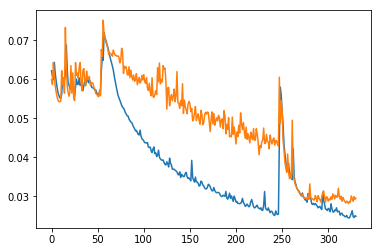

그----------------건으 클린한ᄒ핬자ᅡ ᄀᄀ건  부-명하-지-마-ᆫ-----  ᄌᄌ-는 제 인ᄌ적그로ᅩ  구-ᅩᅩᄅ를 저-하ᅡᄌ지 않----------------아요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
그건으 클린한핬자 건 부명하지만 ᄌ는 제 인적그로 구ᅩ를 저하지 않아요.<eos>
그분은 훌륭한 학자인 건 분명하지만, 저는 개인적으로 그분을 좋아하지 않아요.<eos>-----------


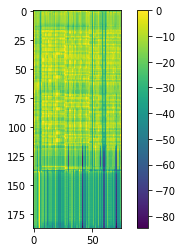

느--------------ᆷ수ᄉ스ᅳᆫ은 키-대-문에-ᄋ  해ᅢᄒᆼᆼ구롱울도ᄂᄋᆼ을 고-우ᄒᄒᆫᄅᄅᆯ-고-   송믈 할스ᅳ-스-ᆻᆻ------------어요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
늠수슨은 키대문에ᄋ 해ᄒᆼ구롱울도ᄂᄋᆼ을 고우ᄒᆫᄅᆯ고 송믈 할스슸어요.<eos>
눈 수술을 했기 때문에 태양으로부터 눈을 보호하려고 선글라스를 써요.<eos>-----------


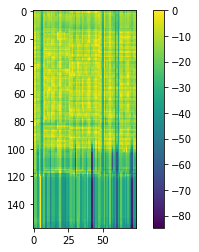

-------------------------------------------------------------------------------------------------------
09-01 14:05:47
Mean Train Loss: 0.025225034180503637
Mean Evaluation Loss: 0.029624088805829483
-------------------------------------------------------------------------------------------------------
09-01 14:06:06
Mean Train Loss: 0.024353499777251514
Mean Evaluation Loss: 0.028796908225160327
-------------------------------------------------------------------------------------------------------
09-01 14:06:27
Mean Train Loss: 0.024733910855623452
Mean Evaluation Loss: 0.028610174834036644
-------------------------------------------------------------------------------------------------------
09-01 14:06:47
Mean Train Loss: 0.026159065876285487
Mean Evaluation Loss: 0.028091855305550684
-------------------------------------------------------------------------------------------------------
09-01 14:07:06
Mean Train Loss: 0.024177981564338126
Mean Evaluation Loss: 0.02963167837135057
-

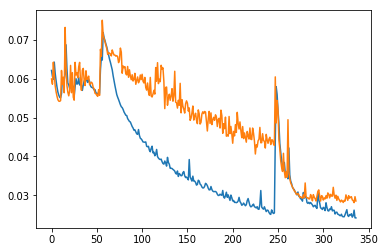

저------------느ᅳᆫ 이-가 어-도-운 때----- 다-은 사ᅡᅡᅡᆷ에ᄋ에 기ᄅᄋᆯᆯ-   아ᄌ지 자ᅡᅡᆯᄀᄃᆯ려 주- 다는 말을ᆯ   많이 들러 애--ᆻᆻ------------어요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
저는 이가 어도운 때 다은 삼에에 기ᄅᄋᆯ 아지 잘ᄀᄃᆯ려 주 다는 말을 많이 들러 앴어요.<eos>
저는 귀가 어두운데 다른 사람의 얘기를 아주 잘 들어 준다는 말을 많이 들어왔어요.<eos>-----------


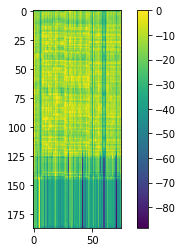

오----------------------르  장-마ᄂ는 이ᄋᄋ은 중중의  시자ᅡ-회-서---   치-을 치ᄋ이 흔난 곳ᄋ으오  예-항-되--ᆸᆸᆸ------------니다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
오르 장마는 이은 중중의 시자회서 치을 치이 흔난 곳으오 예항됩니다.<eos>
올해 장마는 유월 중순에 시작해서 칠 월 초에 끝날 것으로 예상됩니다.<eos>--------


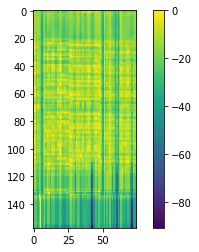

-------------------------------------------------------------------------------------------------------
09-01 14:07:47
Mean Train Loss: 0.02375263465738126
Mean Evaluation Loss: 0.02870169821564875
-------------------------------------------------------------------------------------------------------
09-01 14:08:06
Mean Train Loss: 0.023972875692347153
Mean Evaluation Loss: 0.028580645894756538
-------------------------------------------------------------------------------------------------------
09-01 14:08:26
Mean Train Loss: 0.0241938762714902
Mean Evaluation Loss: 0.028017353411374023
-------------------------------------------------------------------------------------------------------
09-01 14:08:46
Mean Train Loss: 0.023625170562349383
Mean Evaluation Loss: 0.02789150650254672
-------------------------------------------------------------------------------------------------------
09-01 14:09:06
Mean Train Loss: 0.025135911417338026
Mean Evaluation Loss: 0.02971270887263129
------

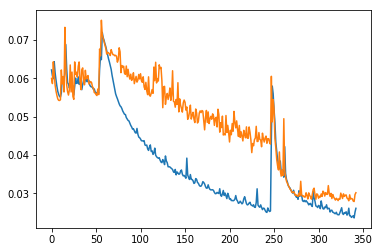

주--------------뭄ᄀ기읜 실ᄋᆯ 헙이는 선래- 하-고- 전-다-면ᆫ-----  고-ᄅ라ᅡ ᅢᆼ항ᅡᅡ 사-앙이ᅵ   녀ᅧ-간 ᅵ 이ᅵᆻ스-ᆸᆸ----------니다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
주뭄기읜 실ᄋᆯ 헙이는 선래 하고 전다면 고라 ᅢᆼ항ᅡ 사앙이 녀간 ᅵ 있습니다.<eos>
중국에 해외 법인을 설립하고자 한다면 고려해야 할 사항이 몇 가지 있습니다.<eos>-----------------


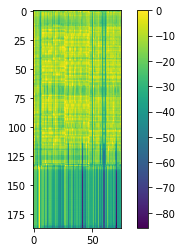

우----------리  대-항에ᄂ는ᆫ--  애-국기  잉역ᄉ새-글니-ᆫᆫ -한고-고  강장하ᅡ 많안 기이 있스ᅳᅳᆸᆸ-----------니다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
우리 대항에는 애국기 잉역새글닌 한고고 강장하 많안 기이 있습니다.<eos>
우리 대학에는 외국인 유학생을 위한 한국어 강좌가 마련되어 있습니다.<eos>--------


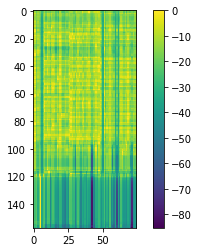

-------------------------------------------------------------------------------------------------------
09-01 14:09:46
Mean Train Loss: 0.025571648444714646
Mean Evaluation Loss: 0.028004489574338442
-------------------------------------------------------------------------------------------------------
09-01 14:10:07
Mean Train Loss: 0.02365109824286889
Mean Evaluation Loss: 0.028729227237304127
-------------------------------------------------------------------------------------------------------
09-01 14:10:26
Mean Train Loss: 0.023767459081547752
Mean Evaluation Loss: 0.029364940981385566
-------------------------------------------------------------------------------------------------------
09-01 14:10:46
Mean Train Loss: 0.023501803273886755
Mean Evaluation Loss: 0.028323306962857325
-------------------------------------------------------------------------------------------------------
09-01 14:11:06
Mean Train Loss: 0.025102918695202252
Mean Evaluation Loss: 0.0305424363299698
---

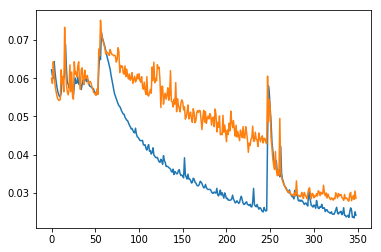

자--------------의  에-잔의  모-든 븐-법이ᅵ---   이-먼 주-에  차-ᄀ고----  삼칠 퍼-슨 트-만-지ᅵ  하ᅡᆯ이 한메-를 하--ᆸᆸᆸ-----------니다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
자의 에잔의 모든 븐법이 이먼 주에 차고 삼칠 퍼슨 트만지 할이 한메를 합니다.<eos>
저희 매장의 모든 품목이 이번 주에 최고 삼십 퍼센트까지 할인 판매를 합니다.<eos>-----------------


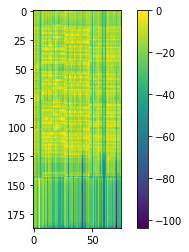

요-------------------즘-메ᄂ는ᆫᆫ---  장기  부ᄆ문이 민낭 선냉 임을ᆯ---  동굥안  잔는나ᄋᄋ 들이  밚-----------------------아요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
요즘메는 장기 부문이 민낭 선냉 임을 동굥안 잔는나ᄋ 들이 밚아요.<eos>
요즘에는 자기 부모님이나 선생님을 존경하지 않는 아이들이 많아요.<eos>------------


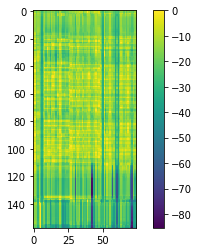

-------------------------------------------------------------------------------------------------------
09-01 14:11:47
Mean Train Loss: 0.02605345485365353
Mean Evaluation Loss: 0.029824307351466642
-------------------------------------------------------------------------------------------------------
09-01 14:12:07
Mean Train Loss: 0.02395107464355855
Mean Evaluation Loss: 0.02913481355902721
-------------------------------------------------------------------------------------------------------
09-01 14:12:27
Mean Train Loss: 0.023454136870963517
Mean Evaluation Loss: 0.02832881465952294
-------------------------------------------------------------------------------------------------------
09-01 14:12:46
Mean Train Loss: 0.02418522259375988
Mean Evaluation Loss: 0.02973254183268036
-------------------------------------------------------------------------------------------------------
09-01 14:13:06
Mean Train Loss: 0.02354091482036318
Mean Evaluation Loss: 0.027919522013406105
-------

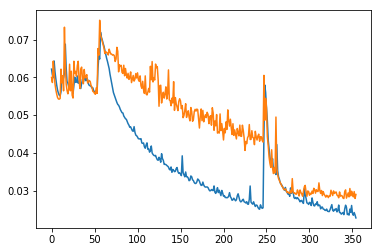

나------------------------는ᆫ 이-사-가------ ᄌ작기  가-족 ᄌ조-----  누-동가ᄅᄋᆯ 숫슬랐는 것ᄋ이---   기 두-톡 적기라ᅡ고 생각 하------------------ᆫ다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
나는 이사가 작기 가족 조 누동가ᄅᄋᆯ 숫슬랐는 것이 기 두톡 적기라고 생각 한다.<eos>
나는 의사가 자기 가족 중 누군가를 수술하는 것이 비도덕적이라고 생각한다.<eos>-------------------


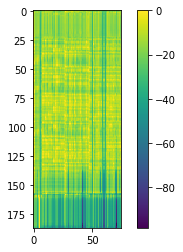

우--------------리  대-항에ᄂ는ᆫ--  이-국이  이-억ᄉ생을이면ᆫ 항궁간 강ᄌ장하 마ᅡᄋᄋᆫ 기ᄋᄋ ᄋ있스-ᆸᆸ-----------니다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
우리 대항에는 이국이 이억생을이면 항궁간 강장하 마ᄋᆫ 기ᄋ 있습니다.<eos>
우리 대학에는 외국인 유학생을 위한 한국어 강좌가 마련되어 있습니다.<eos>--------


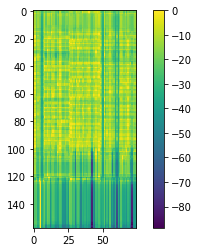

-------------------------------------------------------------------------------------------------------
09-01 14:13:46
Mean Train Loss: 0.023530152875261248
Mean Evaluation Loss: 0.0285147742390663
-------------------------------------------------------------------------------------------------------
09-01 14:14:06
Mean Train Loss: 0.022185368471123797
Mean Evaluation Loss: 0.02814982869399257
-------------------------------------------------------------------------------------------------------
09-01 14:14:26
Mean Train Loss: 0.022112624415805394
Mean Evaluation Loss: 0.027258006523779965
-------------------------------------------------------------------------------------------------------
09-01 14:14:46
Mean Train Loss: 0.023161958097570576
Mean Evaluation Loss: 0.027744362691984898
-------------------------------------------------------------------------------------------------------
09-01 14:15:06
Mean Train Loss: 0.02359746720065737
Mean Evaluation Loss: 0.02670369083423372
-----

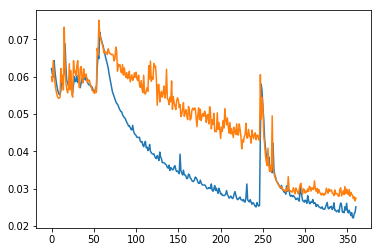

저--------------------는  아-질 ᄆ많이  가-려-서-----  새-롱ᆫ 사람ᆷ들이ᅵ-이-  마-움일아-는 데----  나ᅡᆷ은 시ᄀ한인 갈-----------려요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
저는 아질 많이 가려서 새롱ᆫ 사람들이이 마움일아는 데 남은 시ᄀ한인 갈려요.<eos>
저는 낯을 많이 가려서 새로운 사람들에게 마음을 여는 데 많은 시간이 걸려요.<eos>----------------


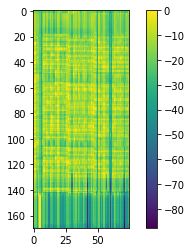

우--------------------리  각기 이인는 대-분은에 산-공-드-ᄋ----  우-명으 숫스ᄋᄋ  ᅢᄋᆼᆼ곤-드-리--ᆸᆸ------------ᄂ니다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
우리 각기 이인는 대분은에 산공드ᄋ 우명으 숫스ᄋ ᅢᄋᆼ곤드립니다.<eos>
우리 가게에 있는 대부분의 상품들이 유럽에서 수입해 온 것들입니다.<eos>------------


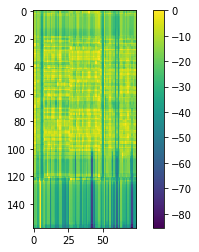

-------------------------------------------------------------------------------------------------------
09-01 14:15:47
Mean Train Loss: 0.022977264291439595
Mean Evaluation Loss: 0.028101588662978575
-------------------------------------------------------------------------------------------------------
09-01 14:16:06
Mean Train Loss: 0.02304125804227439
Mean Evaluation Loss: 0.02798848184922871
-------------------------------------------------------------------------------------------------------
09-01 14:16:26
Mean Train Loss: 0.02302455763650848
Mean Evaluation Loss: 0.027670582367237313
-------------------------------------------------------------------------------------------------------
09-01 14:16:46
Mean Train Loss: 0.022665173169090398
Mean Evaluation Loss: 0.027577600615931307
-------------------------------------------------------------------------------------------------------
09-01 14:17:06
Mean Train Loss: 0.021865640090782814
Mean Evaluation Loss: 0.027799177672573967
---

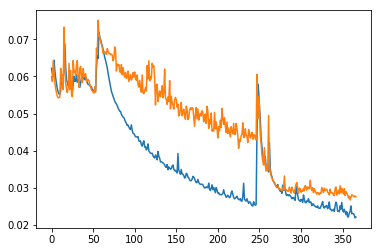

우----------------리ᄂ는ᆫ 찬부--이 구-신-년에ᅦ-  해-사-를 살릴-한-대ᅢ-----  아-은 애곡-이-대ᄋᄋᆯ 지-언아-하-스--ᆸᆸᆸ------니다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
우리는 찬부이 구신년에 해사를 살릴한대 아은 애곡이대ᄋᆯ 지언아하습니다.<eos>
우리는 십구백구십 년에 회사를 설립한 이래 많은 외국인들을 지원해 왔습니다.<eos>------------


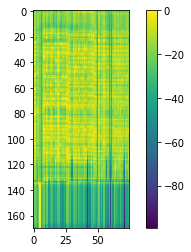

요----------------즘-에-는ᆫ----  장기  ᅮᆫ문니ᅵ 인낭 성응-임을ᆯ---  종굥만지 않늖아ᄋᄋᄃ-드  많ᆭ---------------------아요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
요즘에는 장기 ᅮᆫ문니 인낭 성응임을 종굥만지 않늖아ᄋᄃ드 많아요.<eos>
요즘에는 자기 부모님이나 선생님을 존경하지 않는 아이들이 많아요.<eos>------------


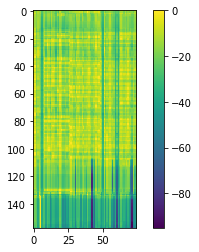

-------------------------------------------------------------------------------------------------------
09-01 14:17:47
Mean Train Loss: 0.02193552872905547
Mean Evaluation Loss: 0.02780555244576283
-------------------------------------------------------------------------------------------------------
09-01 14:18:06
Mean Train Loss: 0.021445548110689903
Mean Evaluation Loss: 0.0273809856900394
-------------------------------------------------------------------------------------------------------
09-01 14:18:26
Mean Train Loss: 0.02210309149379713
Mean Evaluation Loss: 0.028588125388504443
-------------------------------------------------------------------------------------------------------
09-01 14:18:46
Mean Train Loss: 0.02180733485580098
Mean Evaluation Loss: 0.029156570840426756
-------------------------------------------------------------------------------------------------------
09-01 14:19:05
Mean Train Loss: 0.025729061470803068
Mean Evaluation Loss: 0.030522428917452667
------

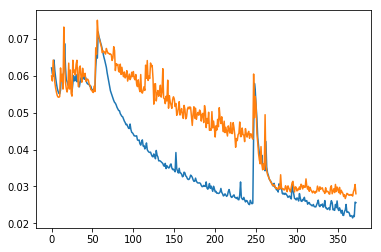

하-------------------ᆫ국에 구-둔나ᅡ 생뇰 징에ᄂ는ᆫ----   이-시 준 비-를 뮈-핸학번을 달 는 경구-간 많------아요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
한국에 구둔나 생뇰 징에는 이시 준 비를 뮈핸학번을 달 는 경구간 많아요.<eos>
한국의 고등학생들 중에는 입시 준비를 위해 학원을 다니는 경우가 많아요.<eos>-----------------


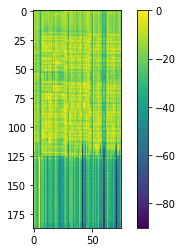

요-----------춤에ᄂ는ᆫ---  횽중 하하ᅪ ᄉ사ᄎ충이이  경-게-가-  든명하ᅡᆫ 자ᄂ닌 겅고-을 않-------아요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
요춤에는 횽중 하하ᅪ 사충이이 경게가 든명한 자닌 겅고을 않아요.<eos>
요즘에는 표준어와 사투리의 경계가 분명하지 않은 경우가 많아요.<eos>-----------------


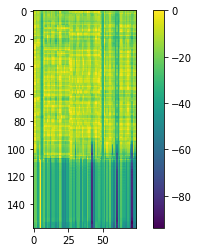

-------------------------------------------------------------------------------------------------------
09-01 14:19:46
Mean Train Loss: 0.024214614274108787
Mean Evaluation Loss: 0.029495686096302938
-------------------------------------------------------------------------------------------------------
09-01 14:20:05
Mean Train Loss: 0.02487757123399396
Mean Evaluation Loss: 0.028678832487410513
-------------------------------------------------------------------------------------------------------
09-01 14:20:25
Mean Train Loss: 0.023517060135908534
Mean Evaluation Loss: 0.027499592311354026
-------------------------------------------------------------------------------------------------------
09-01 14:20:45
Mean Train Loss: 0.024289184161559754
Mean Evaluation Loss: 0.029309416588678673
-------------------------------------------------------------------------------------------------------
09-01 14:21:05
Mean Train Loss: 0.024220258859590532
Mean Evaluation Loss: 0.027563869792241597
-

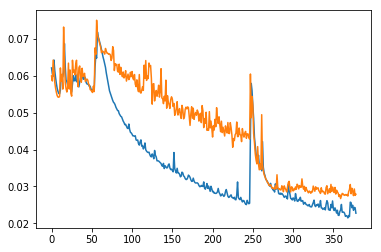

자---------------------ᆼ니-을 지-애ᄋ의 한다ᅡ는ᆫ  버-디 있지ᄂ는 아--다-----   장-헤-는 단-ᄌ지-----   곡펴ᅧᆫ-적이ᅵ  작-별 이-ᄉ시--ᅵ--이다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
장니을 지애의 한다는 버디 있지는 아다 장헤는 단지 곡편적이 작별 이시ᅵ이다.<eos>
장례를 지내야 한다는 법이 있지는 않다. 장례는 단지 보편적인 작별 의식이다.<eos>-------------


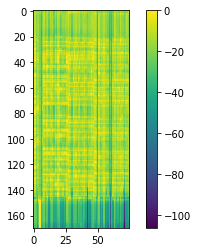

저------------는는 칙은- ᄌ정가ᅡᄋᄋᄋᄋ오 지-먼믄는 것보-다ᅡ---  코-ᄀᄏ흔ᄎ친닌 이  판----해ᄋ요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
저는는 칙은 정가오 지먼믄는 것보다 코ᄀᄏ흔친닌 이 판해요.<eos>
저는 음식을 젓가락으로 집어 먹는 것보다 포크로 찍는 게 편해요.<eos>--------------


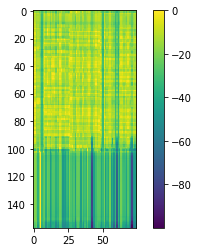

-------------------------------------------------------------------------------------------------------
09-01 14:21:45
Mean Train Loss: 0.02305154296205064
Mean Evaluation Loss: 0.028770251186804024
-------------------------------------------------------------------------------------------------------
09-01 14:22:05
Mean Train Loss: 0.022461456499827257
Mean Evaluation Loss: 0.02769420973321574
-------------------------------------------------------------------------------------------------------
09-01 14:22:25
Mean Train Loss: 0.021379978781406118
Mean Evaluation Loss: 0.028027420673409423
-------------------------------------------------------------------------------------------------------
09-01 14:22:45
Mean Train Loss: 0.023692785991499387
Mean Evaluation Loss: 0.029479912156800184
-------------------------------------------------------------------------------------------------------
09-01 14:23:05
Mean Train Loss: 0.025962953970655865
Mean Evaluation Loss: 0.03527938394709097
---

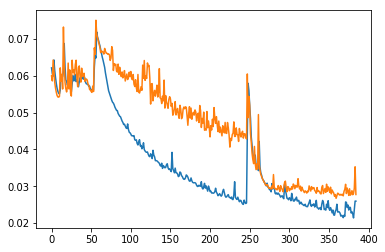

저---------------------느ᅳ  나-이ᅵ  낞이  가ᄅ려-서ᅥ----  새-ᄅ롱 사ᅡ람들에  게--  ᅡᅡᅡᆷ믈ᆯ려-는-데----   많른 시-간인 거-------라요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
저느 나이 낞이 가려서 새롱 사람들에 게 ᅡᆷ믈려는데 많른 시간인 거라요.<eos>
저는 낯을 많이 가려서 새로운 사람들에게 마음을 여는 데 많은 시간이 걸려요.<eos>----------------


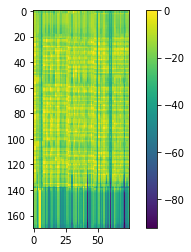

여----------------ᆼ-만 옥등한-형의 예-국ᄋ으  광항ᆼ익들이-  ᄉᄉ-운을 망문하ᅡ-고 이-----ᆻ다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
영만 옥등한형의 예국으 광항익들이 ᄉ운을 망문하고 있다.<eos>
연간 오백만 명의 외국인 관광객들이 서울을 방문하고 있다.<eos>-----------------


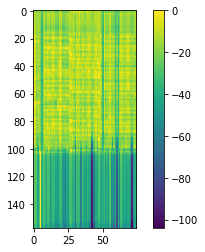

-------------------------------------------------------------------------------------------------------
09-01 14:23:45
Mean Train Loss: 0.022844404375273665
Mean Evaluation Loss: 0.028143543749810214
-------------------------------------------------------------------------------------------------------
09-01 14:24:06
Mean Train Loss: 0.021806721311612456
Mean Evaluation Loss: 0.027611157491398593
-------------------------------------------------------------------------------------------------------
09-01 14:24:26
Mean Train Loss: 0.02200321973614018
Mean Evaluation Loss: 0.028009459722165002
-------------------------------------------------------------------------------------------------------
09-01 14:24:45
Mean Train Loss: 0.022225282058636105
Mean Evaluation Loss: 0.02847229721124491
-------------------------------------------------------------------------------------------------------
09-01 14:25:05
Mean Train Loss: 0.021713962551631952
Mean Evaluation Loss: 0.027724295258445115
--

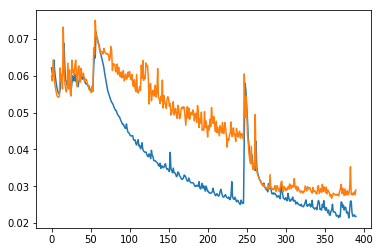

주----------------ᆷ분기ᄋ에  희읠 ᅥᅥᄃᄃᆯ아 석인타ᅡ-버ᄌᄌ 잔-다-련ᆫ----  우-려-하-기야아  사-앙이ᅵ  ᄆ멱-까-지 있스ᅳ-ᆸᆸᄂ니다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
줌분기에 희읠 ᅥᄃᆯ아 석인타버ᄌ 잔다련 우려하기야아 사앙이 멱까지 있습니다.<eos>
중국에 해외 법인을 설립하고자 한다면 고려해야 할 사항이 몇 가지 있습니다.<eos>-----------------


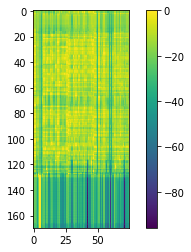

이--------------ᆫᄂ난에-는ᆫ--- 한-슨ᅳᆫᄋᄋ  손-반-담을-  자-룸 태-이는 선싱임드ᅳᄋᄋ있ᄋ어--ᆻᆻ--ᄋ어요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
인난에는 한슨ᅳᆫᄋ 손반담을 자룸 태이는 선싱임드있었어요.<eos>
옛날에는 학생들의 손바닥을 자로 때리는 선생님들이 있었어요.<eos>--------------


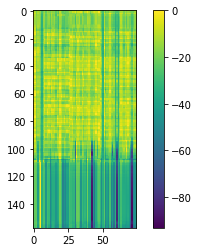

-------------------------------------------------------------------------------------------------------
09-01 14:25:45
Mean Train Loss: 0.02176840032591459
Mean Evaluation Loss: 0.028431218774506342
-------------------------------------------------------------------------------------------------------
09-01 14:26:05
Mean Train Loss: 0.021661378616343024
Mean Evaluation Loss: 0.028297395909684435
-------------------------------------------------------------------------------------------------------
09-01 14:26:25
Mean Train Loss: 0.02186339622754604
Mean Evaluation Loss: 0.030560769870106152
-------------------------------------------------------------------------------------------------------
09-01 14:26:45
Mean Train Loss: 0.022247317213685044
Mean Evaluation Loss: 0.027965196162460324
-------------------------------------------------------------------------------------------------------
09-01 14:27:04
Mean Train Loss: 0.022148444394039297
Mean Evaluation Loss: 0.02993424297477566
---

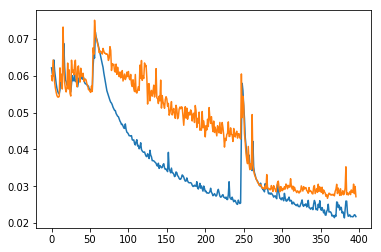

사---------------람들ᅳᅳᆫ 머ᄅ리ᅵ있는 사람을 볼볼 때----  소-올 오-목하-게 ᄆ만드ᄅ어  입따ᅡ-에 -되---ᆸᆸᆸ니ᅵ다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
사람들ᅳᆫ 머리있는 사람을 볼볼 때 소올 오목하게 만드ᄅ어 입따에 됩니다.<eos>
사람들은 멀리 있는 사람을 부를 때 손을 오목하게 만들어 입가에 댑니다.<eos>-------------------


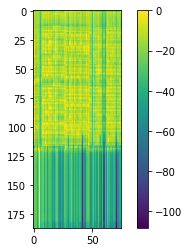

그------------  여-성-장-가ᄂ는--  오-숭에 사ᅡᅵᅵ적 지-이으  오-기-는 데-  크-기  기-야-야-와----ᆻ다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
그 여성장가는 오숭에 사ᅵ적 지이으 오기는 데 크기 기야야왔다.<eos>
그 여성 작가는 여성의 사회적 지위를 높이는 데 크게 기여해 왔다.<eos>-----------------


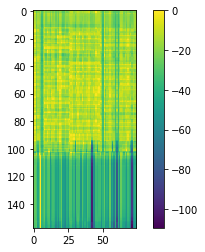

-------------------------------------------------------------------------------------------------------
09-01 14:27:45
Mean Train Loss: 0.021295698796867265
Mean Evaluation Loss: 0.027390767470531274
-------------------------------------------------------------------------------------------------------
09-01 14:28:05
Mean Train Loss: 0.020794025904692613
Mean Evaluation Loss: 0.02788390140160536
-------------------------------------------------------------------------------------------------------
09-01 14:28:25
Mean Train Loss: 0.021051191929632125
Mean Evaluation Loss: 0.026561190679696926
-------------------------------------------------------------------------------------------------------
09-01 14:28:45
Mean Train Loss: 0.020675371155431183
Mean Evaluation Loss: 0.027978946800790324
-------------------------------------------------------------------------------------------------------
09-01 14:29:04
Mean Train Loss: 0.021938132030686702
Mean Evaluation Loss: 0.028446755908486363
-

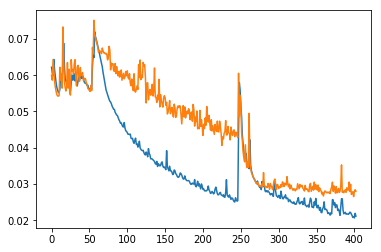

나---------------------는  이--사-가-----  잠ᄀ기 가-족 -줌----  무-궁거ᄅ라 초-술라ᅡ는  것이ᅵ--   비 도-걱적 기ᄅᄅ라  생각ᄒ하----ᆫ다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
나는 이사가 잠기 가족 줌 무궁거라 초술라는 것이 비 도걱적 기라 생각한다.<eos>
나는 의사가 자기 가족 중 누군가를 수술하는 것이 비도덕적이라고 생각한다.<eos>-------------------


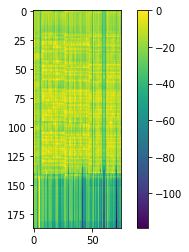

그 ------------------사-람-마-고 시ᅵ 분이 상난 이-기-한 다ᄂ는 게---------   나-루--수ᄂ는 명한 ᅵᅵ 한이-이  아------니야.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
그 사람마고 시 분이 상난 이기한 다는 게 나루수는 명한 ᅵ 한이이 아니야.<eos>
그 사람하고 십 분 이상 간 얘기한다는 게 나로서는 여간 힘든 일이 아냐.<eos>--------


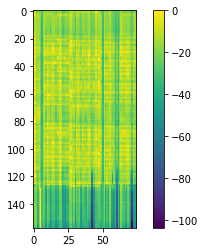

-------------------------------------------------------------------------------------------------------
09-01 14:29:45
Mean Train Loss: 0.021324990797142156
Mean Evaluation Loss: 0.03523883604905391
-------------------------------------------------------------------------------------------------------
09-01 14:30:05
Mean Train Loss: 0.02686673608726422
Mean Evaluation Loss: 0.028883761972717317
-------------------------------------------------------------------------------------------------------
09-01 14:30:25
Mean Train Loss: 0.022037228268783005
Mean Evaluation Loss: 0.027961688011252053
-------------------------------------------------------------------------------------------------------
09-01 14:30:44
Mean Train Loss: 0.021132011877622498
Mean Evaluation Loss: 0.02752638409143697
-------------------------------------------------------------------------------------------------------
09-01 14:31:04
Mean Train Loss: 0.03275305759047003
Mean Evaluation Loss: 0.03201726609300137
-----

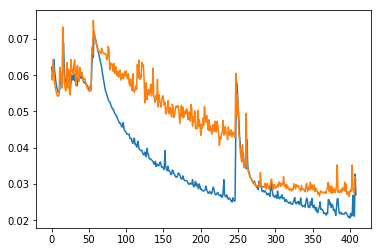

우---------------------ᄅ리ᄂ는ᆫ---  애-극긴 글로--자-드-에  건누-를 구-오-하-니-위-내-------  개--속-헤-서- ᄉᄉ-섬을 다-하ᅡ 돗 이--ᆸᆸᆸ니다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
우리는 애극긴 글로자드에 건누를 구오하니위내 개속헤서 ᄉ섬을 다하 돗 입니다.<eos>
우리는 외국인 근로자들의 권익을 보호하기 위해 계속해서 최선을 다할 것입니다.<eos>--------------


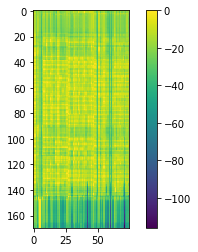

요---------ᆷ-ᄌᆷ-에ᄂ는ᆫ--  ᄒ효-종앙아  산주-이-이 경ᆼ기-가--  긍명ᆼ안 잔낸 구-그-는 안------아요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
욤ᄌᆷ에는 효종앙아 산주이이 경기가 긍명안 잔낸 구그는 안아요.<eos>
요즘에는 표준어와 사투리의 경계가 분명하지 않은 경우가 많아요.<eos>-----------------


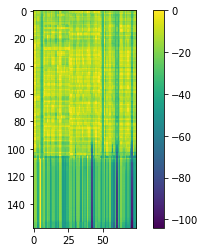

-------------------------------------------------------------------------------------------------------
09-01 14:31:44
Mean Train Loss: 0.024511623570091196
Mean Evaluation Loss: 0.03002925502617164
-------------------------------------------------------------------------------------------------------
09-01 14:32:04
Mean Train Loss: 0.02515285371791312
Mean Evaluation Loss: 0.02826076836246921
-------------------------------------------------------------------------------------------------------
09-01 14:32:24
Mean Train Loss: 0.024396685484640676
Mean Evaluation Loss: 0.027515698006913367
-------------------------------------------------------------------------------------------------------
09-01 14:32:43
Mean Train Loss: 0.031024407577829278
Mean Evaluation Loss: 0.03177859514752773
-------------------------------------------------------------------------------------------------------
09-01 14:33:04
Mean Train Loss: 0.027849584624406218
Mean Evaluation Loss: 0.02968915987346856
-----

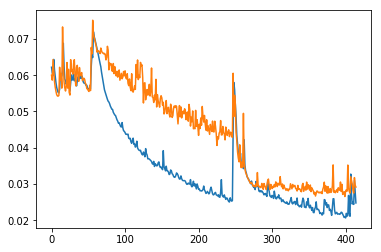

마------------------은-교-오----  추-일 소--서-에-ᄉ서----- ᄀ개-경이-라ᅡ 주-잉공을 지-억은ᆫ----  보-성-이-엤어ᅥ  줌묭한 욜 소-----라.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
마은교오 추일 소서에서 개경이라 주잉공을 지억은 보성이엤어 줌묭한 욜 소라.<eos>
많은 경우 추리 소설에서 배경이나 주인공의 직업은 구성에 있어 중요한 요소다.<eos>---------------


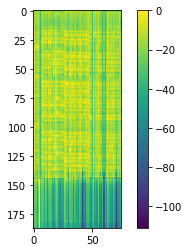

요-----------------즘에-느ᅳᆫᆫ---- ᄌ장기  ᅮ-문니ᅵ 민 ᅡᆼ 상냉 임을ᆯ--- ᄌ종굥안  자ᅡ은나ᄋᄋᆨ드-으  많--------아요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
요즘에는 장기 ᅮ문니 민 ᅡᆼ 상냉 임을 종굥안 자은나ᄋᆨ드으 많아요.<eos>
요즘에는 자기 부모님이나 선생님을 존경하지 않는 아이들이 많아요.<eos>------------


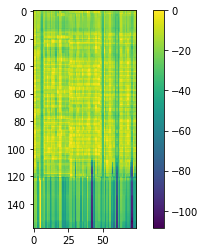

-------------------------------------------------------------------------------------------------------
09-01 14:33:44
Mean Train Loss: 0.02380722654123027
Mean Evaluation Loss: 0.028770259101852685
-------------------------------------------------------------------------------------------------------
09-01 14:34:04
Mean Train Loss: 0.023067170023547946
Mean Evaluation Loss: 0.028577416929864534
-------------------------------------------------------------------------------------------------------
09-01 14:34:24
Mean Train Loss: 0.023741256518853483
Mean Evaluation Loss: 0.02791307665156263
-------------------------------------------------------------------------------------------------------
09-01 14:34:45
Mean Train Loss: 0.02215775793982846
Mean Evaluation Loss: 0.02795593723348534
-------------------------------------------------------------------------------------------------------
09-01 14:35:04
Mean Train Loss: 0.023513023358986165
Mean Evaluation Loss: 0.029381511519753455
----

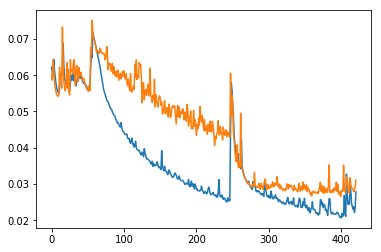

다---------------국ᄋ이 명-잉간  헝을 상근 나-은-도-------- -그느  삿ᅵᅵ라ᅡ을 살ᄀ깄다-고--  마-암-먹어ᅥ---ᆻ다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
다국이 명잉간 헝을 상근 나은도 그느 삿ᅵ라을 살깄다고 마암먹었다.<eos>
감옥에 몇 년간 형을 살고 나온 후 그는 착실하게 살겠다고 마음먹었다.<eos>--------------------


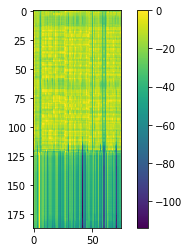

그------------- 여-성-장가-는ᆫ--   여-승의 사이 적지이ᅵ을 노-기ᄂ는 데-  흐-이  기-하햐ᅣ 와----ᆻ다..<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
그 여성장가는 여승의 사이 적지이을 노기는 데 흐이 기하햐 왔다.<eos>
그 여성 작가는 여성의 사회적 지위를 높이는 데 크게 기여해 왔다.<eos>-----------------


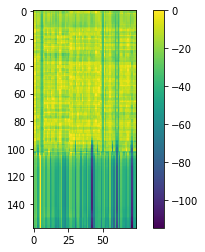

-------------------------------------------------------------------------------------------------------
09-01 14:35:44
Mean Train Loss: 0.023774658578715597
Mean Evaluation Loss: 0.029259922248399677
-------------------------------------------------------------------------------------------------------
09-01 14:36:04
Mean Train Loss: 0.022803331874557218
Mean Evaluation Loss: 0.027979987191683185
-------------------------------------------------------------------------------------------------------
09-01 14:36:24
Mean Train Loss: 0.02392075276668922
Mean Evaluation Loss: 0.029415355528917782
-------------------------------------------------------------------------------------------------------
09-01 14:36:43
Mean Train Loss: 0.023208123227223
Mean Evaluation Loss: 0.028639737572504143
-------------------------------------------------------------------------------------------------------
09-01 14:37:03
Mean Train Loss: 0.02290378098970004
Mean Evaluation Loss: 0.028640191233888296
-----

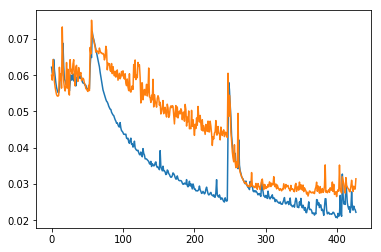

우--------------------ᆯᆯ럼아 고-다ᅡ-다-ᄃ다ᄅ은 초ᄀ기ᄉ시-뎌-은----  ᄋ몰ᄉ조-아ᅡᆫ 더옥거ᅥ내---  나ᅡ바ᄅ엘달ᄃ달 되ᄅ리--ᆸᆸ-니다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
울럼아 고다다다ᄅ은 초기시뎌은 ᄋ몰ᄉ조안 더옥거내 나바ᄅ엘달달 되립니다.<eos>
보일러가 고장 났다는 초기 신호는 온수가 안 나오거나 난방이 안 될 때입니다.<eos>-----------------


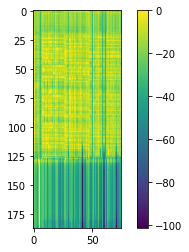

이------------------새-온의 노ᄅ린교-에ᄉ서ᅥᅥ 군애-다롤 애-드- ᅡᅡᆫ-티----  ᄀ구간잘 여-몬기ᅵ괴-어-----ᆻ다..<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
이새온의 노린교에서 군애다롤 애드 ᅡᆫ티 구간잘 여몬기괴었다.<eos>
이승훈은 올림픽에서 금메달을 획득한 뒤 국가적 영웅이 되었다.<eos>------------


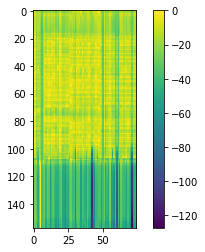

-------------------------------------------------------------------------------------------------------
09-01 14:37:43
Mean Train Loss: 0.025449952153895585
Mean Evaluation Loss: 0.027483926820045995
-------------------------------------------------------------------------------------------------------
09-01 14:38:03
Mean Train Loss: 0.02330391469094474
Mean Evaluation Loss: 0.03266589303290843
-------------------------------------------------------------------------------------------------------
09-01 14:38:24
Mean Train Loss: 0.02417192580421112
Mean Evaluation Loss: 0.030004413572095073
-------------------------------------------------------------------------------------------------------
09-01 14:38:43
Mean Train Loss: 0.023219605410436068
Mean Evaluation Loss: 0.02819993976222676
-------------------------------------------------------------------------------------------------------
09-01 14:39:03
Mean Train Loss: 0.022100918270897087
Mean Evaluation Loss: 0.02813720421867601
-----

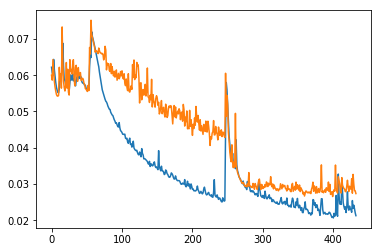

체--------------------은 복싱ᅵ  다 역태ᅢ현간 상일라ᄀ고 알려-치-면-서----  부-시ᅵ을라ᄂ는 여-자들이-   욀-고 이ᅵᆻᆻᆻ--어요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
체은 복싱ᅵ 다 역태현간 상일라고 알려치면서 부시을라는 여자들이 욀고 있어요.<eos>
최근 복싱이 다이어트에 효과적이라고 알려지면서 복싱을 하는 여자들이 늘고 있어요.<eos>-----------


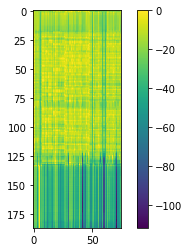

주---------------송-하-지ᄆ만ᆫᆫ---  송샌 니-의 계-믕으ᅳᆫ-   신는 간는 상이 운ᅳᆫ 고  같스ᅳ-ᅳᆸᆸᄂ니다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
주송하지만 송샌 니의 계믕은 신는 간는 상이 운ᅳᆫ 고 같스ᅳᆸ니다.<eos>
죄송하지만, 선생님의 계획은 실현 가능성이 없는 것 같습니다.<eos>--------------


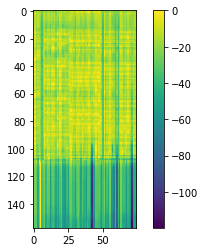

-------------------------------------------------------------------------------------------------------
09-01 14:39:43
Mean Train Loss: 0.02076129585309064
Mean Evaluation Loss: 0.027144471664094956
-------------------------------------------------------------------------------------------------------
09-01 14:40:04
Mean Train Loss: 0.021002938644953725
Mean Evaluation Loss: 0.027071863697199067
-------------------------------------------------------------------------------------------------------
09-01 14:40:23
Mean Train Loss: 0.0212817233268798
Mean Evaluation Loss: 0.027462843837420852
-------------------------------------------------------------------------------------------------------
09-01 14:40:43
Mean Train Loss: 0.020610217829989293
Mean Evaluation Loss: 0.02677775481474166
-------------------------------------------------------------------------------------------------------
09-01 14:41:03
Mean Train Loss: 0.020044370316948678
Mean Evaluation Loss: 0.02653583498468178
-----

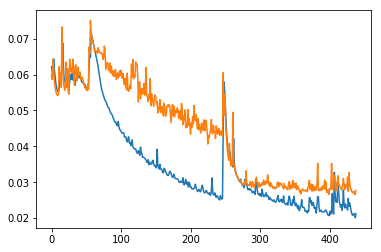

보------모-하  저지ᄅ르ᄂ는 큰ᅳᆫ 지  ᄉ-ᄌ주ᅮ 하ᅡᄀ거ᄂ는--------   가-ᄀ기-아-ᄋᆯᄅ을ᆯ--   가-른지  아이-러  비-교-하는 거 -----이다..<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
보모하 저지르는 큰ᅳᆫ 지 ᄉ주 하거는 가기아ᄋᆯᄅ을 가른지 아이러 비교하는 거 이다.<eos>
부모가 저지르는 큰 실수 중 하나는 자기 아이를 다른 집 아이와 비교하는 것이다.<eos>-----------------


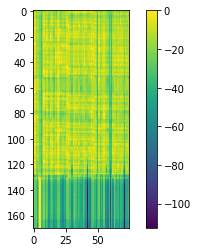

이--------------ᆫ난ᄋᄋ-느ᅳᆫ----  하-신ᅳᆫᆫ이 손-반ᄒ닥을   자ᅡ-럿개-이ᄂ는 성ᅵᆼᆼᅵᆫᆫ디ᄋᄋᄋ이ᅵᆻ었ᆻᆻ---어요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
인난ᄋ는 하신ᅳᆫ이 손반ᄒ닥을 자럿개이는 성ᅵᆼᅵᆫ디있었어요.<eos>
옛날에는 학생들의 손바닥을 자로 때리는 선생님들이 있었어요.<eos>--------------


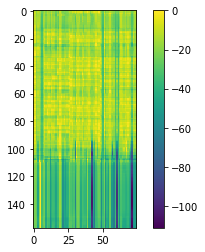

-------------------------------------------------------------------------------------------------------
09-01 14:41:43
Mean Train Loss: 0.020701284831095488
Mean Evaluation Loss: 0.02715446060322222
-------------------------------------------------------------------------------------------------------
09-01 14:42:02
Mean Train Loss: 0.020168121449958318
Mean Evaluation Loss: 0.027272419354572253
-------------------------------------------------------------------------------------------------------
09-01 14:42:22
Mean Train Loss: 0.020100387251471417
Mean Evaluation Loss: 0.027551552045753384
-------------------------------------------------------------------------------------------------------
09-01 14:42:42
Mean Train Loss: 0.020725561746492958
Mean Evaluation Loss: 0.027816557267347945
-------------------------------------------------------------------------------------------------------
09-01 14:43:01
Mean Train Loss: 0.02058866729501261
Mean Evaluation Loss: 0.027245261952496626
--

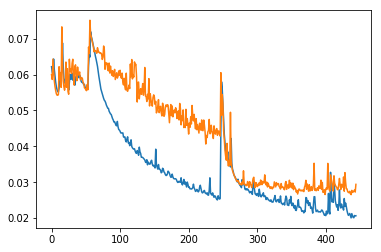

나-----------------------ᄂ는느  사-가ᅡ----- ᄌ작기  가 족ᆨ 줌----  ᄂ무-궁가-ᅳᆯ 수ᄉᄉᆯᆯ하는 ᄀ것이ᅵ--  ᄀ기  도 닥적이ᄅᄅᄅ고 생각ᆨ하ᅡ----ᆫ다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
나는느 사가 작기 가 족 줌 ᄂ무궁가ᅳᆯ 수ᄉᆯ하는 것이 기 도 닥적이ᄅ고 생각한다.<eos>
나는 의사가 자기 가족 중 누군가를 수술하는 것이 비도덕적이라고 생각한다.<eos>-------------------


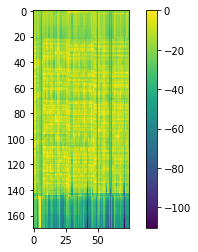

그-------------- 여-선 장간는ᆫ--  여-숙이 사ᅡ이 저 지이ᅵ을 노기ᄂ는ᆫ대-ᄒ  흐-이  기-야ᄋ야ᄋ여----ᆻ다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
그 여선 장간는 여숙이 사이 저 지이을 노기는대ᄒ 흐이 기야야였다.<eos>
그 여성 작가는 여성의 사회적 지위를 높이는 데 크게 기여해 왔다.<eos>-----------------


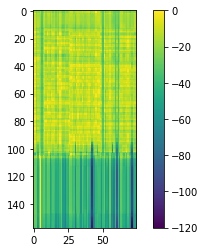

-------------------------------------------------------------------------------------------------------
09-01 14:43:42
Mean Train Loss: 0.02076354005592024
Mean Evaluation Loss: 0.02717040692076158
-------------------------------------------------------------------------------------------------------
09-01 14:44:02
Mean Train Loss: 0.02050870973688861
Mean Evaluation Loss: 0.026995639139559206
-------------------------------------------------------------------------------------------------------
09-01 14:44:22
Mean Train Loss: 0.02094023641235153
Mean Evaluation Loss: 0.027296651998509745
-------------------------------------------------------------------------------------------------------
09-01 14:44:41
Mean Train Loss: 0.02405146375852666
Mean Evaluation Loss: 0.030204431607408516
-------------------------------------------------------------------------------------------------------
09-01 14:45:01
Mean Train Loss: 0.021088035129101772
Mean Evaluation Loss: 0.026866976847478036
-----

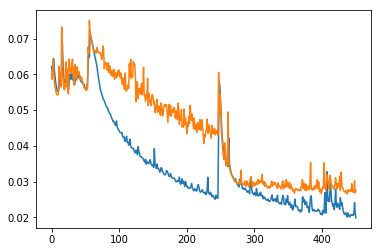

가---------------ᆼ뭄인 면ᄂ녕가ᅡᆫ 탕은 사ᅡ-고  나 ᄋᆫᆫ으ᅳᆫ-----  글은 착시-갈에  살길 다-고-  ᄇ바암 먹어-----ᆻ다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
강뭄인 면녕간 탕은 사고 나 ᄋᆫ은 글은 착시갈에 살길 다고 바암 먹었다.<eos>
감옥에 몇 년간 형을 살고 나온 후 그는 착실하게 살겠다고 마음먹었다.<eos>--------------------


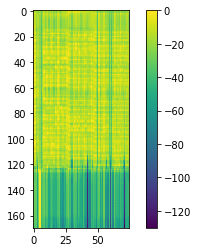

이--------------ᆫ 난이-는ᆫ---  하-시는을 손-반 할ᅳᅳᆯᆯ  자-곰 게ᄋ이는 송싱인 드ᄋ 있ᄋᄋᆻᆻᆻᆻᆻ--ᄋ어요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
인 난이는 하시는을 손반 할ᅳᆯ 자곰 게이는 송싱인 드ᄋ 있ᄋᆻ어요.<eos>
옛날에는 학생들의 손바닥을 자로 때리는 선생님들이 있었어요.<eos>--------------


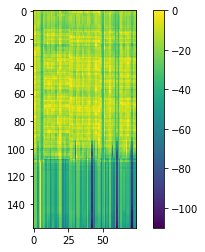

-------------------------------------------------------------------------------------------------------
09-01 14:45:42
Mean Train Loss: 0.020351903094918664
Mean Evaluation Loss: 0.026540350809199132
-------------------------------------------------------------------------------------------------------
09-01 14:46:02
Mean Train Loss: 0.01948774406041082
Mean Evaluation Loss: 0.026521726724613143
-------------------------------------------------------------------------------------------------------
09-01 14:46:21
Mean Train Loss: 0.02636936733577985
Mean Evaluation Loss: 0.02858107592138227
-------------------------------------------------------------------------------------------------------
09-01 14:46:41
Mean Train Loss: 0.020891584533970064
Mean Evaluation Loss: 0.02750293197704909
-------------------------------------------------------------------------------------------------------
09-01 14:47:02
Mean Train Loss: 0.02025258190969627
Mean Evaluation Loss: 0.02721080040167218
------

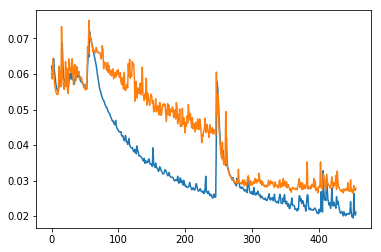

우---------------------리-느-ᆫᆫᆫ-----  글욤이 오-온ᄒ알다-나ᅡ---- 이ᅵᅵᆯᄅᄋ  자 여-기 에ᄃ도ᅩᅩ어 시 이ᄉ을ᄀ거나 ᄉ생각해--ᆻᆻᆻ-어요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
우리는 글욤이 오온ᄒ알다나 일ᄅᄋ 자 여기 에도어 시 이ᄉ을거나 생각했어요.<eos>
우리는 금요일 오후에 떠나 일요일 저녁에 돌아올 수 있을 거라 생각했어요.<eos>--------------------


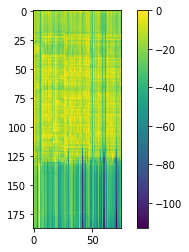

그----------------  여-성-장가ᅡ느ᅳᆫ--  오-숭에 사히ᅵ서  지-이을 노-기ᄂ는 데-  크-이  기-여-야 와----ᆻ다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
그 여성장가는 오숭에 사히서 지이을 노기는 데 크이 기여야 왔다.<eos>
그 여성 작가는 여성의 사회적 지위를 높이는 데 크게 기여해 왔다.<eos>-----------------


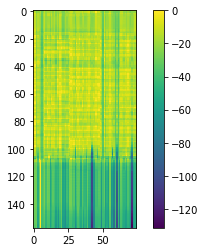

-------------------------------------------------------------------------------------------------------
09-01 14:47:42
Mean Train Loss: 0.02036912201359001
Mean Evaluation Loss: 0.02698683804020672
-------------------------------------------------------------------------------------------------------
09-01 14:48:02
Mean Train Loss: 0.019755883361512173
Mean Evaluation Loss: 0.027380293743089486
-------------------------------------------------------------------------------------------------------
09-01 14:48:22
Mean Train Loss: 0.019244191470506378
Mean Evaluation Loss: 0.02762752343548596
-------------------------------------------------------------------------------------------------------
09-01 14:48:41
Mean Train Loss: 0.019350982264271777
Mean Evaluation Loss: 0.02753546729781137
-------------------------------------------------------------------------------------------------------
09-01 14:49:01
Mean Train Loss: 0.02008987286621749
Mean Evaluation Loss: 0.027606658972175218
-----

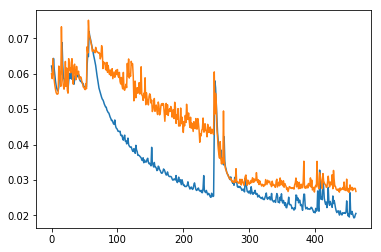

그-----------------국은 툴륜 ᄒᆫ 학자ᄒᄒᆼ 건 분-명ᄒ하ᄌ지ᄆ만------ 저ᅥᆫ인   인-적으ᄅ로 ᄇ부-무를 줗ᅩᅡ아ᄌ자 않-----아요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
그국은 툴륜 ᄒᆫ 학자ᄒᆼ 건 분명하지만 전인 인적으로 부무를 줗ᅩᅡ아자 않아요.<eos>
그분은 훌륭한 학자인 건 분명하지만, 저는 개인적으로 그분을 좋아하지 않아요.<eos>-----------


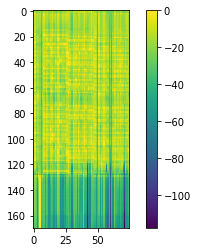

그---------------  여-선-장가ᅡᄂ는--  노-숙의 사ᅡᅵᅵ석 지ᄋ이를 녹기-는 데-  크-기  기-혀-야 와----ᆻ다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
그 여선장가는 노숙의 사ᅵ석 지이를 녹기는 데 크기 기혀야 왔다.<eos>
그 여성 작가는 여성의 사회적 지위를 높이는 데 크게 기여해 왔다.<eos>-----------------


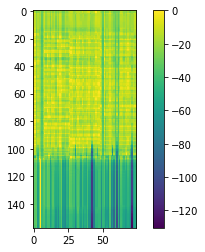

-------------------------------------------------------------------------------------------------------
09-01 14:49:42
Mean Train Loss: 0.020504899530604193
Mean Evaluation Loss: 0.027489674535989685
-------------------------------------------------------------------------------------------------------
09-01 14:50:01
Mean Train Loss: 0.019752822774687796
Mean Evaluation Loss: 0.027161089170995117
-------------------------------------------------------------------------------------------------------
09-01 14:50:21
Mean Train Loss: 0.018759713064227274
Mean Evaluation Loss: 0.026404478594168432
-------------------------------------------------------------------------------------------------------
09-01 14:50:42
Mean Train Loss: 0.019232281419372825
Mean Evaluation Loss: 0.02666052419697265
-------------------------------------------------------------------------------------------------------
09-01 14:51:01
Mean Train Loss: 0.018699110666624063
Mean Evaluation Loss: 0.0271229801006385
---

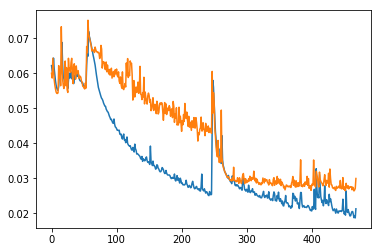

일--------------------------며ᅧᆫ에 도-새-ᅡ-랄-에----  동ᄉ사-에ᄉ성이ᅵ숩ᄌᄌ자-들 이-ᄑ파-긴 대-어---   ᅧᅧᆼ즌 징원을 과-하 허ᄋ업하ᅡ--ᆸᆸᄂ니다..<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
일면에 도새ᅡ랄에 동사에성이숩자들 이파긴 대어 ᅧᆼ즌 징원을 과하 허업합니다.<eos>
일 년에 두세 차례 본사에서 기술자들이 파견되어 현지 직원들과 협업합니다.<eos>-------------------


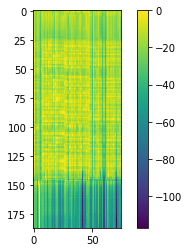

이-------------ᆫ 난에ᅦ-는---- 하-신은으  손-반하ᅡᆼ을-  자-근 게 ᅵᅵ는 성싱인드ᄋ이 있었ᆻᆻᆻᆻ--어요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
인 난에는 하신은으 손반항을 자근 게 ᅵ는 성싱인드이 있었어요.<eos>
옛날에는 학생들의 손바닥을 자로 때리는 선생님들이 있었어요.<eos>--------------


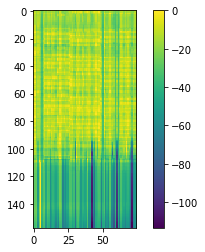

-------------------------------------------------------------------------------------------------------
09-01 14:51:42
Mean Train Loss: 0.021018389920581047
Mean Evaluation Loss: 0.027186205966047414
-------------------------------------------------------------------------------------------------------
09-01 14:52:01
Mean Train Loss: 0.020219773773270628
Mean Evaluation Loss: 0.02680062723808005
-------------------------------------------------------------------------------------------------------
09-01 14:52:22
Mean Train Loss: 0.01996309795888495
Mean Evaluation Loss: 0.02664912617433791
-------------------------------------------------------------------------------------------------------
09-01 14:52:41
Mean Train Loss: 0.01987057661406291
Mean Evaluation Loss: 0.02694168173082093
-------------------------------------------------------------------------------------------------------
09-01 14:53:01
Mean Train Loss: 0.0194932392243882
Mean Evaluation Loss: 0.026346602955849823
-------

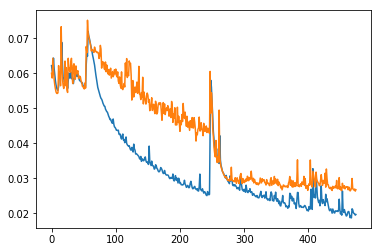

시----------------으  복싱에 다ᄋᄋᆯ 태ᅢ영ᄀᄀᆯ작일ᆯ라ᅡ고 알려-지-여--서ᅥ---  고-직을 ᄂᄂ는 열자-들이   늘-고  있ᆻᆻ-어요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
시으 복싱에 다ᄋᆯ 태영ᄀᆯ작일라고 알려지여서 고직을 는 열자들이 늘고 있어요.<eos>
최근 복싱이 다이어트에 효과적이라고 알려지면서 복싱을 하는 여자들이 늘고 있어요.<eos>-----------


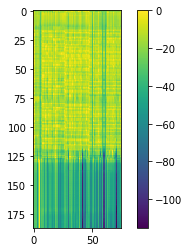

그 -----------------스-람을-고 시ᅵ-분있사-간 이-기-한-다ᄂ는-게----------  나-루-숙느ᅳ  명안 잉녕이-이 ᄋ아---------야.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
그 스람을고 시분있사간 이기한다는게 나루숙느 명안 잉녕이이 아야.<eos>
그 사람하고 십 분 이상 간 얘기한다는 게 나로서는 여간 힘든 일이 아냐.<eos>--------


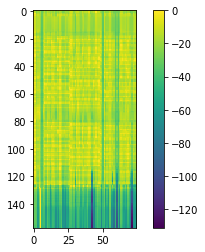

-------------------------------------------------------------------------------------------------------
09-01 14:53:41
Mean Train Loss: 0.024970019429340445
Mean Evaluation Loss: 0.027652809561408406
-------------------------------------------------------------------------------------------------------
09-01 14:54:01
Mean Train Loss: 0.022942994635015444
Mean Evaluation Loss: 0.025349993076897052
-------------------------------------------------------------------------------------------------------
09-01 14:54:21
Mean Train Loss: 0.020611955408665224
Mean Evaluation Loss: 0.024987082439886395
-------------------------------------------------------------------------------------------------------
09-01 14:54:41
Mean Train Loss: 0.019790486588717418
Mean Evaluation Loss: 0.024100087389379382
-------------------------------------------------------------------------------------------------------
09-01 14:55:00
Mean Train Loss: 0.019433902070337496
Mean Evaluation Loss: 0.025942006399417388


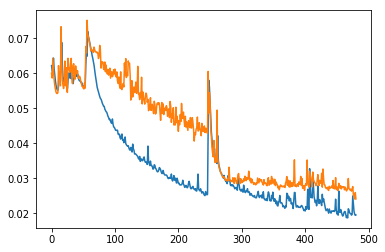

하--------------------ᆫ구-이 고ᄃ둥악ᄉ생든-직에-는-----  ᄋ이-수 준 대ᄅ를 뷔-ᄒ  학우ᄋ을 바ᄂᄂ는 경구-ᅡ   않-----아요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
한구이 고둥악생든직에는 이수 준 대를 뷔ᄒ 학우을 바는 경구ᅡ 않아요.<eos>
한국의 고등학생들 중에는 입시 준비를 위해 학원을 다니는 경우가 많아요.<eos>-----------------


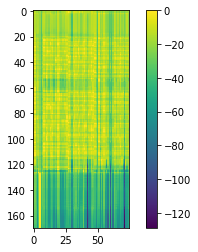

하------------------ᆫ국에 붕모-들은ᆫᆫ--- 자-신-ᅳᆯᆯᅦᅦᄀ게ᅦᅢ ᄂᄋ무마ᅡᆭ는 ᅡ 술루ᄀ구하는 것 가ᅡᇀᇀ--아요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
한국에 붕모들은 자신ᅳᆯᅦ게ᅢ ᄂᄋ무많는 ᅡ 술루구하는 것 같아요.<eos>
한국의 부모들은 자식들에게 너무 많은 것을 요구하는 것 같아요.<eos>---------------


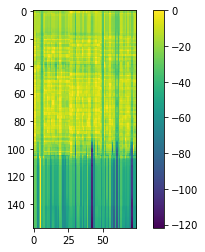

-------------------------------------------------------------------------------------------------------
09-01 14:55:40
Mean Train Loss: 0.018329055392112648
Mean Evaluation Loss: 0.024385889462790914
-------------------------------------------------------------------------------------------------------
09-01 14:56:01
Mean Train Loss: 0.018552974658215034
Mean Evaluation Loss: 0.023611617014225275
-------------------------------------------------------------------------------------------------------
09-01 14:56:21
Mean Train Loss: 0.018314836791231165
Mean Evaluation Loss: 0.024148967059083475
-------------------------------------------------------------------------------------------------------
09-01 14:56:41
Mean Train Loss: 0.018146156856605433
Mean Evaluation Loss: 0.023650952111741702
-------------------------------------------------------------------------------------------------------
09-01 14:57:00
Mean Train Loss: 0.0189814557995392
Mean Evaluation Loss: 0.0243136182548554
----

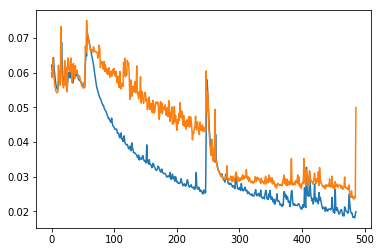

무-----------------ᆯᅵ여ᅥᅥᅥ 고-ᅡᅡᅡᅡ가-갈ᅵᅵᅵ  초ᅩᄉᄉ슨너-ᅵᅵᅳᆫ-     고ᅩᄌᄉ소ᅡ ᅡᆫᆫ 가ᄋ  ᅥᅥᅡᅡᅡᅡ    잔ᅡᅡᅡᆫ 사ᄂ노ᅩᅩ ᅬᅬᅬᅬ---ᆸᆸ니다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
물ᅵ여ᅥ 고ᅡ가갈ᅵ 초슨너ᅵᅳᆫ 고ᄌ소ᅡ ᅡᆫ 가ᄋ ᅥᅡ 잔ᅡᆫ 사노 ᅬᆸ니다.<eos>
보일러가 고장 났다는 초기 신호는 온수가 안 나오거나 난방이 안 될 때입니다.<eos>-----------------


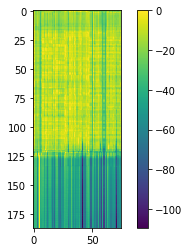

우--------------------리  서ᅡᆫ하ᅡᆯᄂᄋᆫᆫ 이 ᄋᄋᆯᆯ ᅩᅩᄉᄉᄉᄋᄋᄉᄉ 센ᅦᅦᅦ서ᅥᅥ---   -지을ᆯ 추ᄋᄀ그하ᅡᅡᄀᄀ거ᄉ실ᄋᄋ 이ᄉ선-되---ᆸᄂ니다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
우리 서ᅡᆫ할ᄂᄋᆫ 이 ᄋᆯ ᅩᄉᄋᄉ 센ᅦ서 지을 추ᄋ그하거실ᄋ 이선됩니다.<eos>
올해 장마는 유월 중순에 시작해서 칠 월 초에 끝날 것으로 예상됩니다.<eos>--------


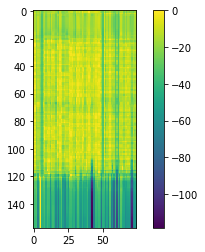

-------------------------------------------------------------------------------------------------------
09-01 14:57:41
Mean Train Loss: 0.03291077130672288
Mean Evaluation Loss: 0.026628907718956027
-------------------------------------------------------------------------------------------------------
09-01 14:58:01
Mean Train Loss: 0.022559778945221112
Mean Evaluation Loss: 0.025038879048495093
-------------------------------------------------------------------------------------------------------
09-01 14:58:21
Mean Train Loss: 0.020744848169841953
Mean Evaluation Loss: 0.024928607976656234
-------------------------------------------------------------------------------------------------------
09-01 14:58:41
Mean Train Loss: 0.01985688337130591
Mean Evaluation Loss: 0.02679101859131706
-------------------------------------------------------------------------------------------------------
09-01 14:59:00
Mean Train Loss: 0.02153289853970736
Mean Evaluation Loss: 0.024993841604104058
----

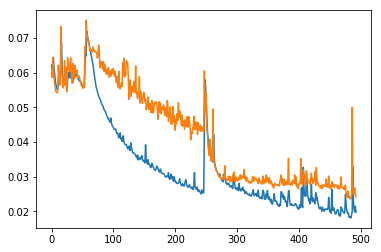

여---------------러-분은 이-엇에--서------   상-미ᅵ-,----   -댁-하--,,--  튜--립-끄------  다-ᄒᆼᆼᅡᆫᆫ 종리ᅵ-핯ᄃᄃᄅ르ᅳᆯᆯ 꾸-실 ᄉ  있습ᆸ니다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
여러분은 이엇에서 상미, 댁하, 튜립끄 다ᄒᆼᅡᆫ 종리핯ᄃ를 꾸실 ᄉ 있습니다.<eos>
여러분은 이곳에서 장미, 백합, 튤립 등 다양한 종류의 꽃들을 보실 수 있습니다.<eos>----------


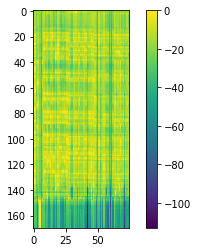

여------------------ᆫᆼ간 옥든할-명에 애-곡이ᅳ  강당-기-들이--  서-울을 방무-하ᄀ고 이ᅵ---ᆻ다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
연ᆼ간 옥든할명에 애곡이ᅳ 강당기들이 서울을 방무하고 있다.<eos>
연간 오백만 명의 외국인 관광객들이 서울을 방문하고 있다.<eos>-----------------


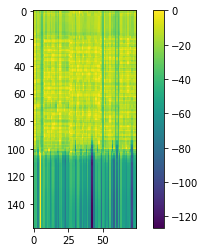

-------------------------------------------------------------------------------------------------------
09-01 14:59:40
Mean Train Loss: 0.019236498337503096
Mean Evaluation Loss: 0.024082986878947235
-------------------------------------------------------------------------------------------------------
09-01 15:00:00
Mean Train Loss: 0.018631861041537592
Mean Evaluation Loss: 0.024512574680083214
-------------------------------------------------------------------------------------------------------
09-01 15:00:20
Mean Train Loss: 0.01926892622139502
Mean Evaluation Loss: 0.025090607463090494
-------------------------------------------------------------------------------------------------------
09-01 15:00:40
Mean Train Loss: 0.020920694590861332
Mean Evaluation Loss: 0.024142492875003706
-------------------------------------------------------------------------------------------------------
09-01 15:01:00
Mean Train Loss: 0.021549157132985795
Mean Evaluation Loss: 0.025730692643454362
-

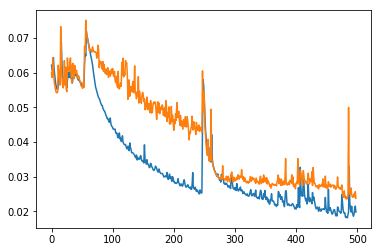

여----------------러-본연 이-엇에-ᄉ서------  자ᅡᆷᆼ-니-,,----   백-파-ᄋ,,-  -퓰-릴 드ᅳᆼ----  다-항한 송유ᅲᅵ 꼬-들을 ᄀ고ᄉ실ᄉᄉ ᄋ있습ᆸ니다..<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
여러본연 이엇에서 잠ᆼ니, 백파ᄋ, 퓰릴 등 다항한 송유ᅵ 꼬들을 고실ᄉ 있습니다.<eos>
여러분은 이곳에서 장미, 백합, 튤립 등 다양한 종류의 꽃들을 보실 수 있습니다.<eos>----------


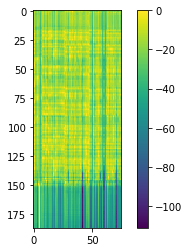

어---------ᆯ이-ᄒ한-자ᄂ는---  우-린날 ᅡᅡ에ᄉ서-  가-장 이ᄋ  기-인는ᆫ-  매-궁 숙솔 진 한야----예요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
얼이한자는 우린날 ᅡ에서 가장 이ᄋ 기인는 매궁 숙솔 진 한야예요.<eos>
어린 왕자는 우리나라에서 가장 인기 있는 외국 소설 중 하나예요.<eos>-----------------


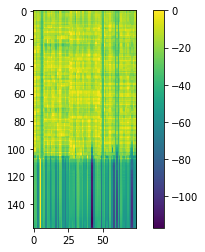

-------------------------------------------------------------------------------------------------------
09-01 15:01:40
Mean Train Loss: 0.018703629890478288
Mean Evaluation Loss: 0.024057798938803374
-------------------------------------------------------------------------------------------------------
09-01 15:02:00
Mean Train Loss: 0.018237968630226992
Mean Evaluation Loss: 0.024087260383706205
-------------------------------------------------------------------------------------------------------
09-01 15:02:20
Mean Train Loss: 0.018325327619471372
Mean Evaluation Loss: 0.02435123429868065
-------------------------------------------------------------------------------------------------------
09-01 15:02:40
Mean Train Loss: 0.018616126424864928
Mean Evaluation Loss: 0.02583181854752728
-------------------------------------------------------------------------------------------------------
09-01 15:03:00
Mean Train Loss: 0.020355219663563063
Mean Evaluation Loss: 0.025567684317893562
--

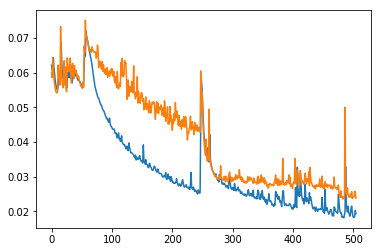

자----------------------ᆼ니-을 지-내ᄒ에 한다-는ᆫ ᄇ버-기 있지ᄂ는 난-다--,--  ᄌ장-이-는 다ᅡᆫ지-----   공-평ᆫ-적인  작-펴-으  시-------이ᄃ다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
장니을 지내ᄒ에 한다는 버기 있지는 난다, 장이는 단지 공평ᆫ적인 작펴으 시이다.<eos>
장례를 지내야 한다는 법이 있지는 않다. 장례는 단지 보편적인 작별 의식이다.<eos>-------------


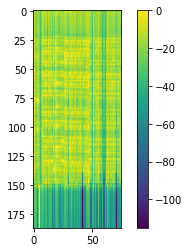

그----------------- 여-성-작가ᅡ은ᆫ--  여-숭의 사ᄋ이서  지ᄋᄋ를  노-기ᄂ는 데-  크-게  기-아-야-와----ᆻ다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
그 여성작가은 여숭의 사이서 지ᄋ를 노기는 데 크게 기아야왔다.<eos>
그 여성 작가는 여성의 사회적 지위를 높이는 데 크게 기여해 왔다.<eos>-----------------


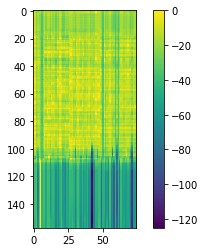

-------------------------------------------------------------------------------------------------------
09-01 15:03:41
Mean Train Loss: 0.01860722769928891
Mean Evaluation Loss: 0.02531058406183831
-------------------------------------------------------------------------------------------------------
09-01 15:04:00
Mean Train Loss: 0.018719766001310135
Mean Evaluation Loss: 0.023823623536218152
-------------------------------------------------------------------------------------------------------
09-01 15:04:20
Mean Train Loss: 0.017658885697005376
Mean Evaluation Loss: 0.023727866076053167
-------------------------------------------------------------------------------------------------------
09-01 15:04:40
Mean Train Loss: 0.01745472503571183
Mean Evaluation Loss: 0.023571187959883694
-------------------------------------------------------------------------------------------------------
09-01 15:05:00
Mean Train Loss: 0.017347947862083223
Mean Evaluation Loss: 0.02394922832421882
----

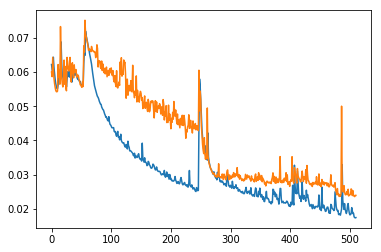

시--------------------ᆨ-산-숙 곡끄--데------ 개-라-를 산바ᅡ하ᄌᄌ 않기로  ᅧᅧᆯ정이ᅵᆻᅳᅳᅳᅳ ᅡᅡᄋ여려드-데 되여어  유-가ᅡᆷ이---ᆸᆸᆸ-ᄂ니다ᅡ..<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
식산숙 곡끄데 개라를 산바하ᄌ 않기로 ᅧᆯ정있ᅳ ᅡ여려드데 되여어 유감입니다.<eos>
심사숙고 끝에 귀하를 선발하지 않기로 결정했음을 알려드리게 되어 유감입니다.<eos>--------------


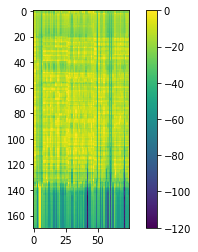

하---------------ᆫ국에 부ᅩᆼ우ᄃ들은ᆫ--  자-신들ᄋᄋ-ᄀ게ᅦ 너우ᄆᄆ많ᆭᅳᆫ 거ᄋᄋᄋᄋᆯᅮᅮ아ᅡ는 것 가--ᇀ-----아요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
한국에 부ᅩᆼ우들은 자신들ᄋ게 너우많ᅳᆫ 거ᄋᆯᅮ아는 것 같아요.<eos>
한국의 부모들은 자식들에게 너무 많은 것을 요구하는 것 같아요.<eos>---------------


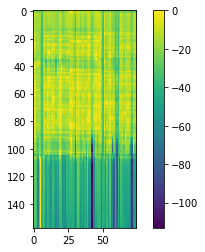

-------------------------------------------------------------------------------------------------------
09-01 15:05:40
Mean Train Loss: 0.017852688812831422
Mean Evaluation Loss: 0.02463827766250971
-------------------------------------------------------------------------------------------------------
09-01 15:06:00
Mean Train Loss: 0.01845953756184383
Mean Evaluation Loss: 0.02383466677675017
-------------------------------------------------------------------------------------------------------
09-01 15:06:19
Mean Train Loss: 0.01732312806811982
Mean Evaluation Loss: 0.024392893604871048
-------------------------------------------------------------------------------------------------------
09-01 15:06:40
Mean Train Loss: 0.017287622164750927
Mean Evaluation Loss: 0.024035376341404614
-------------------------------------------------------------------------------------------------------
09-01 15:06:59
Mean Train Loss: 0.01754289785051363
Mean Evaluation Loss: 0.023910597742573626
-----

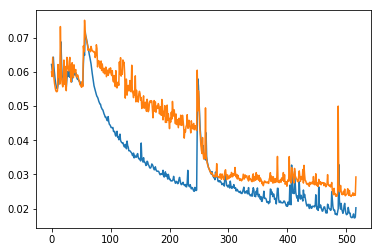

우----------------------리ᄂ는ᆫ---   애-국젠 골로-자ᅡ드ᅳᄋ이 ᄀ건니-을 부우ᅮ화-ᄀ기-이-해------   개-속헤ᅦ서ᅥᅥ  처-선을 다ᅡ할것ᆺᅵᅵ-ᆸᆸᆸᆸ니다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
우리는 애국젠 골로자드이 건니을 부우화기이해 개속헤서 처선을 다할것ᅵᆸ니다.<eos>
우리는 외국인 근로자들의 권익을 보호하기 위해 계속해서 최선을 다할 것입니다.<eos>--------------


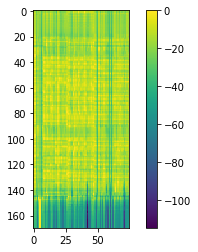

죄----------------ᄉᄉᆼᆼ하 지ᄆ만ᆫᆫ---   사-잰니 에 게-를 은--   시-는 가-은사ᄋᄋ ᄋᄋᆫ은것  엍스ᅳ-ᆸᆸᆸ니다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
죄ᄉᆼ하 지만 사잰니 에 게를 은 시는 가은사ᄋ ᄋᆫ은것 엍습니다.<eos>
죄송하지만, 선생님의 계획은 실현 가능성이 없는 것 같습니다.<eos>--------------


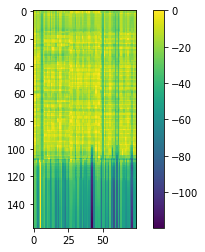

-------------------------------------------------------------------------------------------------------
09-01 15:07:40
Mean Train Loss: 0.020899248585371653
Mean Evaluation Loss: 0.02479484201326815
-------------------------------------------------------------------------------------------------------
09-01 15:08:00
Mean Train Loss: 0.018457021985028552
Mean Evaluation Loss: 0.023908660562983616
-------------------------------------------------------------------------------------------------------
09-01 15:08:20
Mean Train Loss: 0.017959501700263416
Mean Evaluation Loss: 0.023608589425004226
-------------------------------------------------------------------------------------------------------
09-01 15:08:40
Mean Train Loss: 0.018390340841740585
Mean Evaluation Loss: 0.024211440369170487
-------------------------------------------------------------------------------------------------------
09-01 15:08:59
Mean Train Loss: 0.01752138536757355
Mean Evaluation Loss: 0.02372305841241731
---

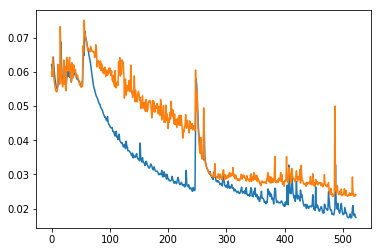

부-----ᄋᆼᆼ와- 저-재ᄅ-는 후-ᅳᅳᆫ 질-수  죽 터-나ᄂ는--------  자ᅡ-기- 아-이ᄅ를ᆯ---  다-른ᄌ지-아ᅡ--어- ᄇ기ᅵ-하-는 ᄀ것----이다..<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
부ᄋᆼ와 저재ᄅ는 후ᅳᆫ 질수 죽 터나는 자기 아이를 다른지아어 ᄇ기하는 것이다.<eos>
부모가 저지르는 큰 실수 중 하나는 자기 아이를 다른 집 아이와 비교하는 것이다.<eos>-----------------


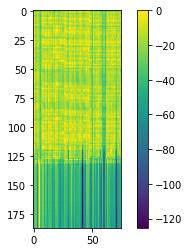

그 ---------------사-람ᆷ아-고  식푼이 상간  이-기-한다ᄂ는-게----------  나-롯-소ᄂ는 멱간 인뎡일이 ᄋ아-------니야.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
그 사람아고 식푼이 상간 이기한다는게 나롯소는 멱간 인뎡일이 아니야.<eos>
그 사람하고 십 분 이상 간 얘기한다는 게 나로서는 여간 힘든 일이 아냐.<eos>--------


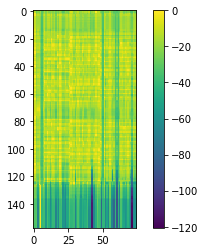

-------------------------------------------------------------------------------------------------------
09-01 15:09:39
Mean Train Loss: 0.019034977684484703
Mean Evaluation Loss: 0.024687104066137174
-------------------------------------------------------------------------------------------------------
09-01 15:10:00
Mean Train Loss: 0.020849548785780634
Mean Evaluation Loss: 0.024428298172558344
-------------------------------------------------------------------------------------------------------
09-01 15:10:20
Mean Train Loss: 0.018028078844787535
Mean Evaluation Loss: 0.024562232903380804
-------------------------------------------------------------------------------------------------------
09-01 15:10:39
Mean Train Loss: 0.01979093709005673
Mean Evaluation Loss: 0.024564389165537697
-------------------------------------------------------------------------------------------------------
09-01 15:10:59
Mean Train Loss: 0.017929700366092597
Mean Evaluation Loss: 0.024315855431528244
-

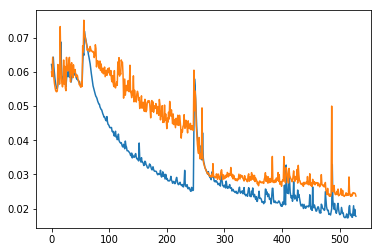

오-----------------------리ᄂ는ᆫ---  외-국-인 그-로-자-들에  건이-을 붕호-ᄒ하 기-위-해-----  ᄀ개-석-에ᄉ서ᅥᅥ  체-선을 달알거--시--ᆸᆸ-니다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
오리는 외국인 그로자들에 건이을 붕호하 기위해 개석에서 체선을 달알거십니다.<eos>
우리는 외국인 근로자들의 권익을 보호하기 위해 계속해서 최선을 다할 것입니다.<eos>--------------


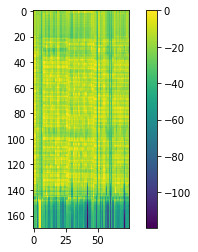

이-----------------진으는 오-랜디-에서ᅥᅥ  그-매-다ᄅᄅᆯ 해-드--한-디----  구-개-자  영웅이-되-어-----ᆻ다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
이진으는 오랜디에서 그매다ᄅᆯ 해드한디 구개자 영웅이되었다.<eos>
이승훈은 올림픽에서 금메달을 획득한 뒤 국가적 영웅이 되었다.<eos>------------


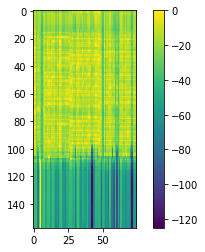

-------------------------------------------------------------------------------------------------------
09-01 15:11:40
Mean Train Loss: 0.017969686337773575
Mean Evaluation Loss: 0.025232289117578872
-------------------------------------------------------------------------------------------------------
09-01 15:11:59
Mean Train Loss: 0.018520236345342125
Mean Evaluation Loss: 0.023844903510899677
-------------------------------------------------------------------------------------------------------
09-01 15:12:19
Mean Train Loss: 0.017535152007423612
Mean Evaluation Loss: 0.02450284790830683
-------------------------------------------------------------------------------------------------------
09-01 15:12:39
Mean Train Loss: 0.017712169257989765
Mean Evaluation Loss: 0.025473909469671513
-------------------------------------------------------------------------------------------------------
09-01 15:12:59
Mean Train Loss: 0.018921919131913916
Mean Evaluation Loss: 0.024297535995496215
-

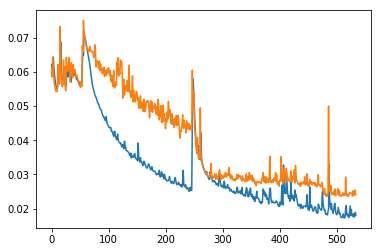

최----------------------근ᄋ  설룬 조 사 -결-과------  음다ᅡ 자ᄋ아  가-한 주-가-----  제ᅦ- 기-정의 반대ᄒ하는 것으로ᅩ 다ᅡᄐ타ᄂ나----ᆻᆻ다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
최근ᄋ 설룬 조 사 결과 음다 자아 가한 주가 제 기정의 반대하는 것으로 다타났다.<eos>
최근의 설문 조사 결과 응답자의 과반수가 새 규정에 반대하는 것으로 나타났다.<eos>-----------------


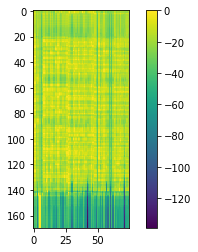

그----------------- 여-선-장-가ᄂ은--  ᄋ오-성ᅦ 사ᄋ이장 지ᄋᄋ으ᅳᆯ 노-내ᄂ는 데-  프-이  기-아-아-와----ᆻ다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
그 여선장가ᄂ은 오성ᅦ 사이장 지을 노내는 데 프이 기아아왔다.<eos>
그 여성 작가는 여성의 사회적 지위를 높이는 데 크게 기여해 왔다.<eos>-----------------


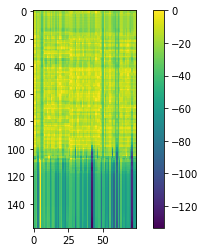

-------------------------------------------------------------------------------------------------------
09-01 15:13:40
Mean Train Loss: 0.018656858106127727
Mean Evaluation Loss: 0.023802313383667218
-------------------------------------------------------------------------------------------------------
09-01 15:14:00
Mean Train Loss: 0.017047214581807038
Mean Evaluation Loss: 0.02352108038843946
-------------------------------------------------------------------------------------------------------
09-01 15:14:19
Mean Train Loss: 0.0172119476904552
Mean Evaluation Loss: 0.023478480989293966
-------------------------------------------------------------------------------------------------------
09-01 15:14:39
Mean Train Loss: 0.01808740876221216
Mean Evaluation Loss: 0.025615518424388372
-------------------------------------------------------------------------------------------------------
09-01 15:14:59
Mean Train Loss: 0.017832134281749172
Mean Evaluation Loss: 0.024093675353936743
----

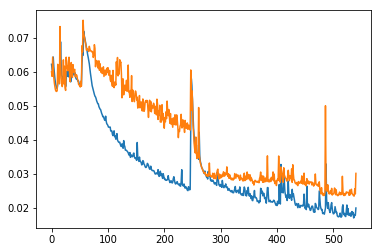

시-----------------------천ᄉ석곡극-테--------  개-혀ᅡᅦ 서ᅥ반하ᄌᄌ 않기ᅵ르 켤저ᅥᆼ했으ᅥ 알ᆯ이ᅵᄃ드-으 ᄃᄃᄋᄋᄋᄋᄋ 이ᅵᄀ감이---ᆸᆸ-니다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
시천석곡극테 개혀ᅡᅦ 서반하ᄌ 않기르 켤정했으ᅥ 알이드으 ᄃᄋ 이감입니다.<eos>
심사숙고 끝에 귀하를 선발하지 않기로 결정했음을 알려드리게 되어 유감입니다.<eos>--------------


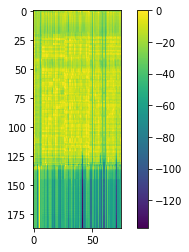

그----------------- 여ᄉ선-작가ᅡ느ᅳᆫ---  ᄋᄋᆨ성의 사의ᅵ저 지ᅵᅵᅵ를 노-이ᄂ는 데   프ᅳ에ᅦ 기-하ᄋ야 애----ᆻ다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
그 여선작가는 ᄋᆨ성의 사의ᅵ저 지를 노이는 데 프에 기하야 앴다.<eos>
그 여성 작가는 여성의 사회적 지위를 높이는 데 크게 기여해 왔다.<eos>-----------------


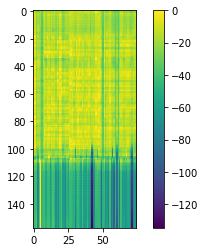

-------------------------------------------------------------------------------------------------------
09-01 15:15:40
Mean Train Loss: 0.02131767611021321
Mean Evaluation Loss: 0.02570762659451761
-------------------------------------------------------------------------------------------------------
09-01 15:16:00
Mean Train Loss: 0.018487012519623612
Mean Evaluation Loss: 0.025136850350535516
-------------------------------------------------------------------------------------------------------
09-01 15:16:20
Mean Train Loss: 0.0175522788328894
Mean Evaluation Loss: 0.024355620747639518
-------------------------------------------------------------------------------------------------------
09-01 15:16:39
Mean Train Loss: 0.017233182192837305
Mean Evaluation Loss: 0.023942392814319386
-------------------------------------------------------------------------------------------------------
09-01 15:16:59
Mean Train Loss: 0.016811452814708482
Mean Evaluation Loss: 0.024155373724138653
----

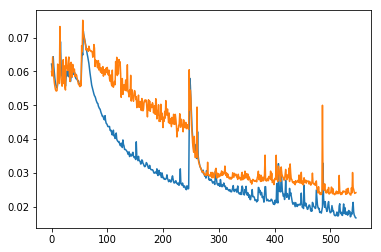

처--------------------ᅥᆷ이 곳에 있섰었을ᄄ때--------  갈아ᅡ-서 다-느ᅳ  ᅥᅥᄅᄅᄅ에 ᅵᆷᆷ겸폼ᄀ가게ᄀ가 있다ᄂ는 게ᅦ---   첨ᆷ  좋ᄋ아--ᆻᆻᆻ--어요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
처ᅥᆷ이 곳에 있섰었을때 갈아서 다느 ᅥᄅ에 ᅵᆷ겸폼가게가 있다는 게 첨 좋았어요.<eos>
처음 이곳에 이사 왔을 때 걸어서 닿는 거리에 식료품 가게가 있다는 게 참 좋았어요.<eos>----------


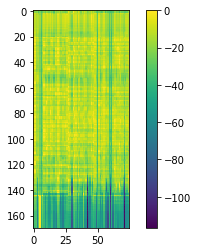

여-----------------ᆼ-가 오-등-말 명의 애-곡인ᆫ 강당-기-들이-   서-울을 방므-하ᄀ고 이----ᆻ다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
영가 오등말 명의 애곡인 강당기들이 서울을 방므하고 있다.<eos>
연간 오백만 명의 외국인 관광객들이 서울을 방문하고 있다.<eos>-----------------


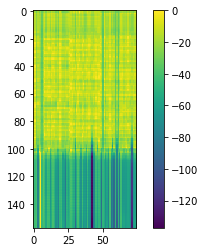

-------------------------------------------------------------------------------------------------------
09-01 15:17:40
Mean Train Loss: 0.01665054952703349
Mean Evaluation Loss: 0.02338502674215784
-------------------------------------------------------------------------------------------------------
09-01 15:18:00
Mean Train Loss: 0.016596011048805134
Mean Evaluation Loss: 0.02442213068315407
-------------------------------------------------------------------------------------------------------
09-01 15:18:20
Mean Train Loss: 0.017485604270003792
Mean Evaluation Loss: 0.02384965585030068
-------------------------------------------------------------------------------------------------------
09-01 15:18:40
Mean Train Loss: 0.016763043073902317
Mean Evaluation Loss: 0.024399471333917917
-------------------------------------------------------------------------------------------------------
09-01 15:19:01
Mean Train Loss: 0.016376266208545306
Mean Evaluation Loss: 0.02402339069152673
-----

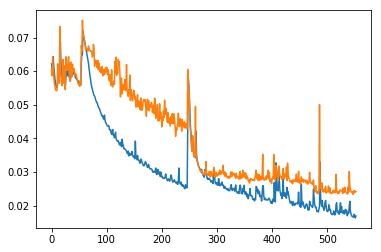

하-------------------ᄀᆨᆨ의 고ᄃ둥학 생길 주-내-는-----  ᄋ이-시-집-빌를 위ᄒ해 한원을 다ᄂᄂ는 겨ᄀ고-고  많----아요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
하ᄀᆨ의 고둥학 생길 주내는 이시집빌를 위해 한원을 다는 겨고고 많아요.<eos>
한국의 고등학생들 중에는 입시 준비를 위해 학원을 다니는 경우가 많아요.<eos>-----------------


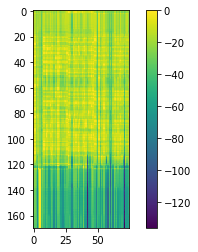

저----------------ᄂ는 그-사-람이----- 나-ᄋᆼ연ᄋ이  ᅧᄌ잔드ᅳᅳᆯ 대하를 태-도-가--   마ᅡᆭ이  안 들----어요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
저는 그사람이 나ᄋᆼ연이 ᅧ잔들 대하를 태도가 많이 안 들어요.<eos>
저는 그 사람이 나이 어린 여자들을 대하는 태도가 마음에 안 들어요.<eos>---------------


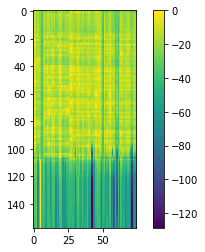

-------------------------------------------------------------------------------------------------------
09-01 15:19:41
Mean Train Loss: 0.020623426719674594
Mean Evaluation Loss: 0.029243433872397168
-------------------------------------------------------------------------------------------------------
09-01 15:20:01
Mean Train Loss: 0.02016041058064632
Mean Evaluation Loss: 0.02463089688085543
-------------------------------------------------------------------------------------------------------
09-01 15:20:20
Mean Train Loss: 0.017095867969816537
Mean Evaluation Loss: 0.023876567262110505
-------------------------------------------------------------------------------------------------------
09-01 15:20:41
Mean Train Loss: 0.016274812719018938
Mean Evaluation Loss: 0.024694551679010013
-------------------------------------------------------------------------------------------------------
09-01 15:21:01
Mean Train Loss: 0.016141303463318688
Mean Evaluation Loss: 0.02422554482358998
---

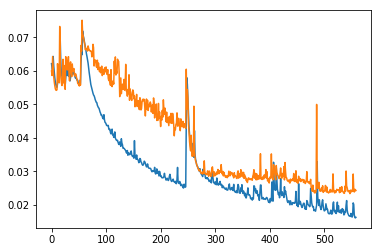

기----------줌-픔이 게ᄉ서 들어오--ᅧᅧᄉ서------  우릴는 저장 곤간이ᅵ부종가ᄒ단는 사ᄉ실을 게-달가-ᆻᆻᆻᆻ-어요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
기줌픔이 게서 들어오ᅧ서 우릴는 저장 곤간이부종가ᄒ단는 사실을 게달갔어요.<eos>
기증품이 계속 들어오면서 우리는 저장 공간이 부족하다는 사실을 깨달았어요.<eos>----------------


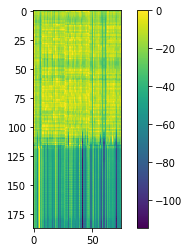

저-----------------는 그-사ᅡ-람이----  나-애연에  여ᄌ자ᄃ드ᅳᅳᆯ 배하흐ᅳ  패ᄃ도-하--  마ᅡᅳ이  안 들----아요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
저는 그사람이 나애연에 여자들 배하흐 패도하 마ᅳ이 안 들아요.<eos>
저는 그 사람이 나이 어린 여자들을 대하는 태도가 마음에 안 들어요.<eos>---------------


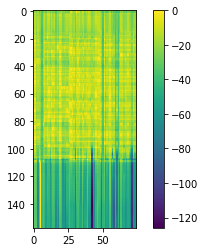

-------------------------------------------------------------------------------------------------------
09-01 15:21:41
Mean Train Loss: 0.02130695241928249
Mean Evaluation Loss: 0.02703503003068469
-------------------------------------------------------------------------------------------------------
09-01 15:22:01
Mean Train Loss: 0.019364523213826132
Mean Evaluation Loss: 0.02445539620015615
-------------------------------------------------------------------------------------------------------
09-01 15:22:21
Mean Train Loss: 0.017418725087276606
Mean Evaluation Loss: 0.024861826951972348
-------------------------------------------------------------------------------------------------------
09-01 15:22:41
Mean Train Loss: 0.019120674193900258
Mean Evaluation Loss: 0.025307032110860224
-------------------------------------------------------------------------------------------------------
09-01 15:23:00
Mean Train Loss: 0.01739754423472935
Mean Evaluation Loss: 0.02424261087534258
-----

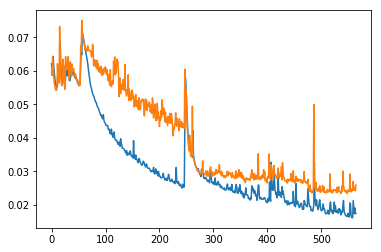

부--------몽가ᅡ 저-지를는 ᄏ큰 ᅵ시ᄉ 수ᅮ-중 하-나ᄂ는--------   자-기ᅵ 아이ᄅᄅᆷᅳᅳᆯ--   다ᅡ는ᄌ지 아이ᅵ아  비 기-한ᅳᆫ 것-----이다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
부몽가 저지를는 큰 ᅵ시ᄉ 수중 하나는 자기 아이ᄅᆷᅳᆯ 다는지 아이아 비 기한ᅳᆫ 것이다.<eos>
부모가 저지르는 큰 실수 중 하나는 자기 아이를 다른 집 아이와 비교하는 것이다.<eos>-----------------


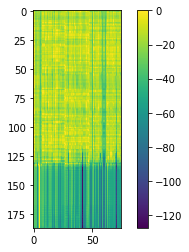

그 -----------------------사ᅡ람ᄋ믄 순잔애-에ᄉ서-----  자ᅡᆯᅵᅵ 인나ᅡ 이 하-기ᄅ로--  사-람ᄃ들을 ᅵ-고한ᄀ기 만 ᄃ드---ᆫ다..<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
그 사람ᄋ믄 순잔애에서 잘ᅵ 인나 이 하기로 사람들을 ᅵ고한기 만 든다.<eos>
그 사람은 술자리에서 자기 옛날이야기로 사람들을 지루하게 만든다.<eos>---------------


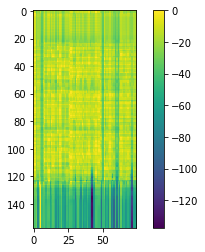

-------------------------------------------------------------------------------------------------------
09-01 15:23:41
Mean Train Loss: 0.01709790591761601
Mean Evaluation Loss: 0.024207634606372635
-------------------------------------------------------------------------------------------------------
09-01 15:24:01
Mean Train Loss: 0.016815756185499686
Mean Evaluation Loss: 0.023889426664987005
-------------------------------------------------------------------------------------------------------
09-01 15:24:22
Mean Train Loss: 0.015699344862005925
Mean Evaluation Loss: 0.024242535242922608
-------------------------------------------------------------------------------------------------------
09-01 15:24:41
Mean Train Loss: 0.016091949037392153
Mean Evaluation Loss: 0.023756876019050667
-------------------------------------------------------------------------------------------------------
09-01 15:25:01
Mean Train Loss: 0.01885706600990895
Mean Evaluation Loss: 0.023624241625853606
--

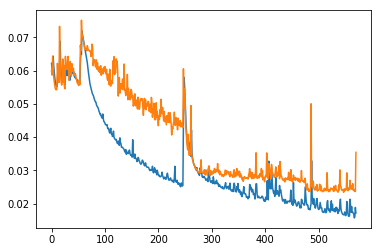

저--------------른-기-가 어-드-ᄋᄂᆫᆫ 에----  가ᄅᄅᆫ 사-람이 ᄋᄋᆨ리ᄅ으----  아ᄌ-- 자ᅡ-기려-진ᆫ다-는 말으ᅳᆫᆫ   간-그ᄅ러 ᄋᄋ--ᆻᆻ---어요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
저른기가 어드ᄋᄂᆫ 에 가ᄅᆫ 사람이 ᄋᆨ리ᄅ으 아ᄌ 자기려진다는 말은 간그러 ᄋᆻ어요.<eos>
저는 귀가 어두운데 다른 사람의 얘기를 아주 잘 들어 준다는 말을 많이 들어왔어요.<eos>-----------


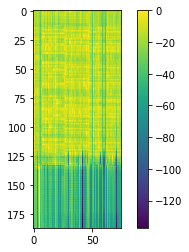

하---------------ᆫ구-의  도-ᄋ-ᄃ들은-----  ᄌ-ᄉᆨᆨ틀레-게ᄋ  넝ᆼ 아ᅡᆼᆫᆫ  ᄉᄉᄋᄋ료ᄀᆼ하ᅡ에  것 같ᇀᇀᇀ--아요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
한구의 도ᄋ들은 ᄌᄉᆨ틀레게ᄋ 넝 앙ᆫ ᄉᄋ료ᄀᆼ하에 것 같아요.<eos>
한국의 부모들은 자식들에게 너무 많은 것을 요구하는 것 같아요.<eos>---------------


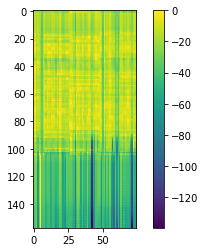

-------------------------------------------------------------------------------------------------------
09-01 15:25:41
Mean Train Loss: 0.023841877717478165
Mean Evaluation Loss: 0.024443839709034326
-------------------------------------------------------------------------------------------------------
09-01 15:26:02
Mean Train Loss: 0.018464467628975426
Mean Evaluation Loss: 0.024221707193268015
-------------------------------------------------------------------------------------------------------
09-01 15:26:22
Mean Train Loss: 0.018108363849309785
Mean Evaluation Loss: 0.023909098416179286
-------------------------------------------------------------------------------------------------------
09-01 15:26:42
Mean Train Loss: 0.017242779647695605
Mean Evaluation Loss: 0.02403078826906559
-------------------------------------------------------------------------------------------------------
09-01 15:27:02
Mean Train Loss: 0.016984153050785617
Mean Evaluation Loss: 0.024056723368394334
-

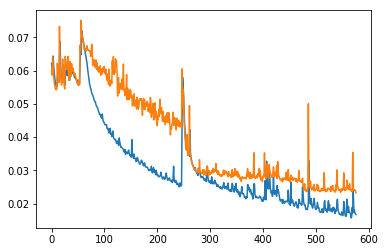

가--------------ᆷ-곡이  ᅧᅧᆫ-년가ᅡᆫ 통을 상고  나-은-고-------  그ᅳ는 삭실갈게 살ᆯ깄다ᅡᄀ고-  마ᅡ음 멈ᆨ어----ᆻ다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
감곡이 ᅧᆫ년간 통을 상고 나은고 그는 삭실갈게 살깄다고 마음 멈ᆨ었다.<eos>
감옥에 몇 년간 형을 살고 나온 후 그는 착실하게 살겠다고 마음먹었다.<eos>--------------------


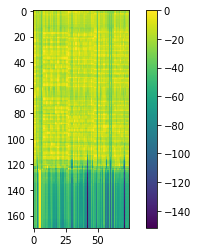

그 ---------------------사-람안 술-자-래-에서ᅥ----  ᄌ자-기  이-난 이 아-기ᄅ로--  사ᄅ람ᆷ들ᅳᆯ 지-고하-게ᅵ 만 드-----ᆫ다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
그 사람안 술자래에서 자기 이난 이 아기로 사람들ᅳᆯ 지고하게ᅵ 만 든다.<eos>
그 사람은 술자리에서 자기 옛날이야기로 사람들을 지루하게 만든다.<eos>---------------


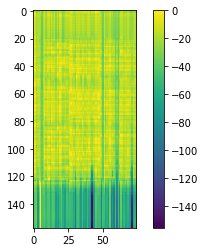

-------------------------------------------------------------------------------------------------------
09-01 15:27:42
Mean Train Loss: 0.016714413068672967
Mean Evaluation Loss: 0.024317070619675443
-------------------------------------------------------------------------------------------------------
09-01 15:28:02
Mean Train Loss: 0.01691211623952046
Mean Evaluation Loss: 0.02402414232891407
-------------------------------------------------------------------------------------------------------
09-01 15:28:22
Mean Train Loss: 0.016252113053754617
Mean Evaluation Loss: 0.023407757000368717
-------------------------------------------------------------------------------------------------------
09-01 15:28:42
Mean Train Loss: 0.015869447390185077
Mean Evaluation Loss: 0.02300240905273376
-------------------------------------------------------------------------------------------------------
09-01 15:29:02
Mean Train Loss: 0.015543564052273667
Mean Evaluation Loss: 0.023547394526003275
---

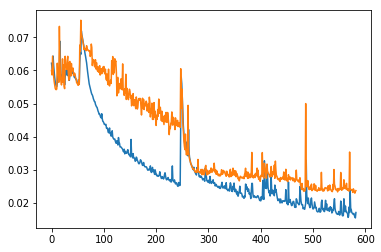

많----------------은-병우-----  추-에-서--선에-ᄉ서----  배-ᄀᄀᆼᆼ이ᄀ가ᅡ 시-임겅이  지-덕은-----  고-성어-엤ᄋ어ᅥᅥ 주ᅮᆼᅭᅭᅡᆫ  요--조---------------다..<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
많은병우 추에서선에서 배ᄀᆼ이가 시임겅이 지덕은 고성어엤어 중ᅭᅡᆫ 요조다.<eos>
많은 경우 추리 소설에서 배경이나 주인공의 직업은 구성에 있어 중요한 요소다.<eos>---------------


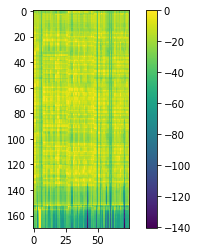

요---------------ᆫᄉ수 스ᅳᆯ페ᅦ 키-대-무ᅮᆫ에   태ᅢ항글어ᅥ 더-늠을 보-우 할라-고--  상그ᄅᆯᆯ할솔애-ᆻᆻ---------어요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
욘수 슬페 키대문에 태항글어 더늠을 보우 할라고 상그ᄅᆯ할솔앴어요.<eos>
눈 수술을 했기 때문에 태양으로부터 눈을 보호하려고 선글라스를 써요.<eos>-----------


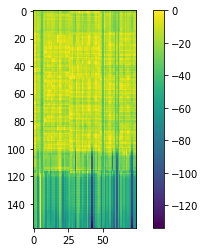

-------------------------------------------------------------------------------------------------------
09-01 15:29:42
Mean Train Loss: 0.016993042639531407
Mean Evaluation Loss: 0.02536675578704617
-------------------------------------------------------------------------------------------------------
09-01 15:30:02
Mean Train Loss: 0.01715786707163514
Mean Evaluation Loss: 0.02748909426110116
-------------------------------------------------------------------------------------------------------
09-01 15:30:22
Mean Train Loss: 0.019216366339560326
Mean Evaluation Loss: 0.024050931941290248
-------------------------------------------------------------------------------------------------------
09-01 15:30:42
Mean Train Loss: 0.01727193454324103
Mean Evaluation Loss: 0.024605188251269318
-------------------------------------------------------------------------------------------------------
09-01 15:31:02
Mean Train Loss: 0.0182910406321093
Mean Evaluation Loss: 0.028871726947298216
------

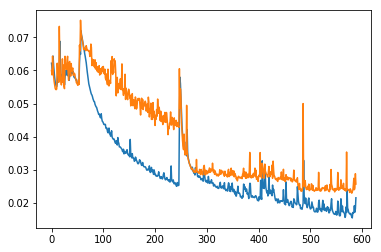

부------------------------리ᄂ는ᆫ---  외-국이ᅵ 글로ᅩ 제ᄃ를에ᅦ 건릭글 공호ᅩᄒ하 기 위해-------  계--속-헤서ᅥᅥ  치-서ᄅ를 다ᄒ하-도  ᅵᅵ--ᆸᆸᆸ-------------니다..<eos><eos><eos><eos><eos><eos><eos>
부리는 외국이 글로 제ᄃ를에 건릭글 공호하 기 위해 계속헤서 치서를 다하도 ᅵᆸ니다.<eos>
우리는 외국인 근로자들의 권익을 보호하기 위해 계속해서 최선을 다할 것입니다.<eos>--------------


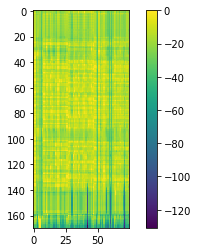

기-------------생-각ᄀ기ᄂ는ᆫ--  이-럼ᄋ을ᆯ 다래ᄂ는 데ᄂ는-  태-기 한핸 ᅵ 없닌 것 가-----------ᇀ아..<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
기생각기는 이럼을 다래는 데는 태기 한핸 ᅵ 없닌 것 같아.<eos>
내 생각에는 외로움을 달래는 데는 티브이만 한 게 없는 거 같아.<eos>---------------


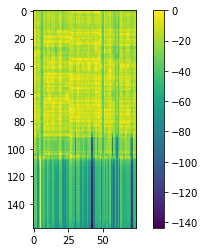

-------------------------------------------------------------------------------------------------------
09-01 15:31:43
Mean Train Loss: 0.01872024458977993
Mean Evaluation Loss: 0.024149168579047624
-------------------------------------------------------------------------------------------------------
09-01 15:32:02
Mean Train Loss: 0.01801868822997209
Mean Evaluation Loss: 0.026967350758123603
-------------------------------------------------------------------------------------------------------
09-01 15:32:22
Mean Train Loss: 0.01807353972600145
Mean Evaluation Loss: 0.024121388173668008
-------------------------------------------------------------------------------------------------------
09-01 15:32:42
Mean Train Loss: 0.02139973765803166
Mean Evaluation Loss: 0.02738128717268093
-------------------------------------------------------------------------------------------------------
09-01 15:33:02
Mean Train Loss: 0.018996644759736482
Mean Evaluation Loss: 0.02496459596398122
------

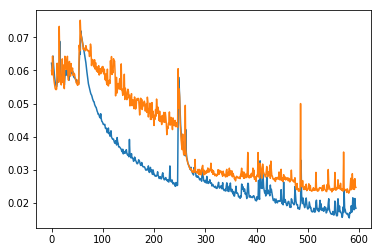

제---------------가-그ᅩ  ᅩᄃ펴ᄅ라에  조여을 따ᅡᆻᅢᆻ다는 예ᄀᄀᄅ를드러-앨ᄋ 때ᅢ--------   저-루ᅮ 정-마---   이-끼-지기 않아-ᆻᆻᆻ-----어요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
제가그ᅩ ᅩᄃ펴라에 조여을 땄ᅢᆻ다는 예ᄀ를드러앨ᄋ 때 저루 정마 이끼지기 않았어요.<eos>
제가 그 오페라의 주연을 따냈다는 얘기를 들었을 때 저는 정말 믿기지가 않았어요.<eos>------------


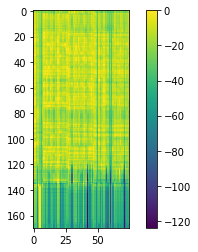

죄----------------송ᄒ하-지ᄆ마ᅡᆫᆫ---  서-새--이-의 ᄀᄀᆯ를 ᅳᅳᆫᆫ  ᄉ시-은 발는ᄉ삼이ᄋ먼ᅳᆫᄀ것 었스ᅳ-ᆸᆸᆸᄂ니다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
죄송하지만 서새이의 ᄀᆯ를 ᅳᆫ 시은 발는삼이ᄋ먼ᅳᆫ것 었습니다.<eos>
죄송하지만, 선생님의 계획은 실현 가능성이 없는 것 같습니다.<eos>--------------


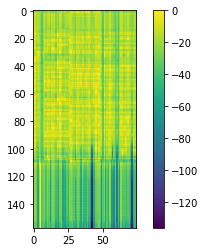

-------------------------------------------------------------------------------------------------------
09-01 15:33:41
Mean Train Loss: 0.017273779122000885
Mean Evaluation Loss: 0.02398220324659542
-------------------------------------------------------------------------------------------------------
09-01 15:34:01
Mean Train Loss: 0.016769105671026498
Mean Evaluation Loss: 0.024749454404144028
-------------------------------------------------------------------------------------------------------
09-01 15:34:21
Mean Train Loss: 0.01635643069600371
Mean Evaluation Loss: 0.023495573803849906
-------------------------------------------------------------------------------------------------------
09-01 15:34:41
Mean Train Loss: 0.01605096790381425
Mean Evaluation Loss: 0.025198574745332332
-------------------------------------------------------------------------------------------------------
09-01 15:35:01
Mean Train Loss: 0.018495235146781447
Mean Evaluation Loss: 0.024345718792718157
---

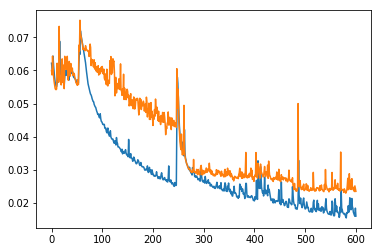

사--------------람들은 뭘리ᅬ있는 사람을 불들 때----  소-을 오ᄆ목바-게  만들어  밉-가-에 되----ᆸᆸ니다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
사람들은 뭘리ᅬ있는 사람을 불들 때 소을 오목바게 만들어 밉가에 됩니다.<eos>
사람들은 멀리 있는 사람을 부를 때 손을 오목하게 만들어 입가에 댑니다.<eos>-------------------


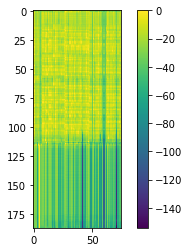

그-------------  여-선-작-가ᄂ은--  여-석에 사ᅡ이사  지이ᄅ를 노-디ᄂ는-데-  프-에  기-여-야 화----ᆻ다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
그 여선작가ᄂ은 여석에 사이사 지이를 노디는데 프에 기여야 홨다.<eos>
그 여성 작가는 여성의 사회적 지위를 높이는 데 크게 기여해 왔다.<eos>-----------------


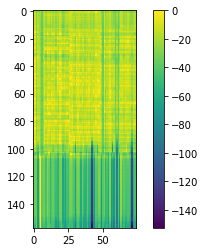

-------------------------------------------------------------------------------------------------------
09-01 15:35:41
Mean Train Loss: 0.016372083030345288
Mean Evaluation Loss: 0.024097080655951758
-------------------------------------------------------------------------------------------------------
09-01 15:36:01
Mean Train Loss: 0.01595079918544671
Mean Evaluation Loss: 0.02357824238614682
-------------------------------------------------------------------------------------------------------
09-01 15:36:21
Mean Train Loss: 0.01496237371744198
Mean Evaluation Loss: 0.023363156721778557
-------------------------------------------------------------------------------------------------------
09-01 15:36:41
Mean Train Loss: 0.015118905681665972
Mean Evaluation Loss: 0.023299552591201367
-------------------------------------------------------------------------------------------------------
09-01 15:37:01
Mean Train Loss: 0.01557221809016962
Mean Evaluation Loss: 0.023652883781369444
----

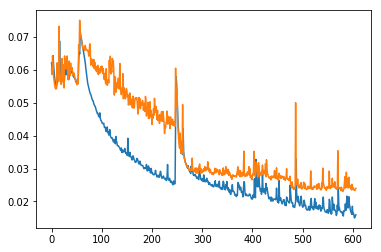

저-----------------는ᆫ 낱츤  많이  가-라-서----  새로-은 사람ᄃ들에-게-ᅦ 마 암을 며-는 데----- ᄆ많ᅳᅳᆫ 시ᄀ간이 ᄀ걸-----려요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
저는 낱츤 많이 가라서 새로은 사람들에게ᅦ 마 암을 며는 데 많ᅳᆫ 시간이 걸려요.<eos>
저는 낯을 많이 가려서 새로운 사람들에게 마음을 여는 데 많은 시간이 걸려요.<eos>----------------


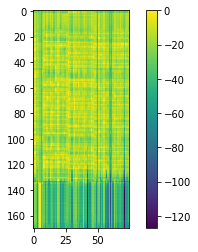

오--------------------ᆯ르  장-뫈은 이ᄋᄋ알 중순에  시자ᅡᆨ헤-서ᅥ--   시-를 추힉 끈난 것으로ᅩ  예 사ᅡᆼ되---ᆸᆸ니다..<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
올르 장뫈은 이알 중순에 시작헤서 시를 추힉 끈난 것으로 예 상됩니다.<eos>
올해 장마는 유월 중순에 시작해서 칠 월 초에 끝날 것으로 예상됩니다.<eos>--------


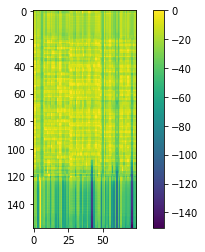

-------------------------------------------------------------------------------------------------------
09-01 15:37:41
Mean Train Loss: 0.015120955443610062
Mean Evaluation Loss: 0.024374944899691185
-------------------------------------------------------------------------------------------------------
09-01 15:38:01
Mean Train Loss: 0.016265566525832113
Mean Evaluation Loss: 0.023945021642025156
-------------------------------------------------------------------------------------------------------
09-01 15:38:21
Mean Train Loss: 0.015365286201904462
Mean Evaluation Loss: 0.023988609457169057
-------------------------------------------------------------------------------------------------------
09-01 15:38:41
Mean Train Loss: 0.015600888492612893
Mean Evaluation Loss: 0.023887457286190357
-------------------------------------------------------------------------------------------------------
09-01 15:39:01
Mean Train Loss: 0.01582980241400114
Mean Evaluation Loss: 0.023893359694075397
-

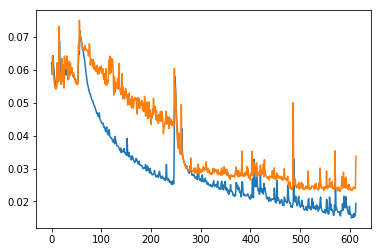

많----------------ᄂ는 겸우----   추ᅮ르- 소 존느-서ᅥᅥᅥ--   ᅧᅢᅢ드ᅧᆼ이 나ᅡ지ᅵᅵᅵ 군이 ᄌ즈거ᅥᆸ은----   곤ᄉ성엘ᆯ시-어ᅥ  준ᄋᄋᆼ아 요ᅩ-조----다..<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
많는 겸우 추르 소 존느서 ᅧᅢ드ᅧᆼ이 나지 군이 즈겁은 곤성엘시어 준ᄋᆼ아 요ᅩ조다.<eos>
많은 경우 추리 소설에서 배경이나 주인공의 직업은 구성에 있어 중요한 요소다.<eos>---------------


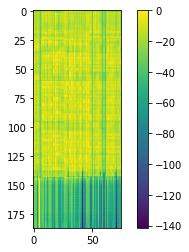

그  ----------------------ᄉ사ᄅ람ᄋᆫ 손-작ᄋᄋ-에ᄉ서ᅥ----  ᄌ자리ᅵ 엔나ᅡ이ᅵᄋ하ᄀ기ᄅ로--   사ᄅ람들ᄋᆯ ᄌ지ᄅᄋ아ᅡᄀ기 아ᅡᆫ 되----ᆫ다..<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
그 사람ᄋᆫ 손작ᄋ에서 자리 엔나이ᄋ하기로 사람들ᄋᆯ 지ᄅ아기 안 된다.<eos>
그 사람은 술자리에서 자기 옛날이야기로 사람들을 지루하게 만든다.<eos>---------------


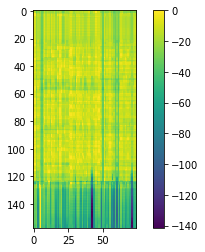

-------------------------------------------------------------------------------------------------------
09-01 15:39:41
Mean Train Loss: 0.02273179642418367
Mean Evaluation Loss: 0.024893379448047138
-------------------------------------------------------------------------------------------------------
09-01 15:40:01
Mean Train Loss: 0.02143965017443194
Mean Evaluation Loss: 0.024891528528193912
-------------------------------------------------------------------------------------------------------
09-01 15:40:20
Mean Train Loss: 0.018105715277908423
Mean Evaluation Loss: 0.023877088561803223
-------------------------------------------------------------------------------------------------------
09-01 15:40:40
Mean Train Loss: 0.0172352978179066
Mean Evaluation Loss: 0.02407732231837886
-------------------------------------------------------------------------------------------------------
09-01 15:41:00
Mean Train Loss: 0.016587175484177902
Mean Evaluation Loss: 0.023470672951681842
-----

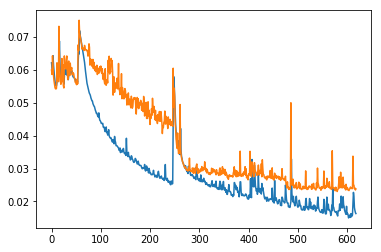

오--------------늘 일ᅥᅥᄀ게ᅦᅦ한ᄀᄀᄀ거ᄋ에 간한 ᅩᆫ청 방열을 할 수 있에-되ᅦ--ᅥᅥ  어ᅧᆼ강ᄒ슬ᅥᅥᆨ계ᅦ 승강ᆼ하--ᆸᆸᆸᆸ-니다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
오늘 일ᅥ게한거에 간한 ᅩᆫ청 방열을 할 수 있에되ᅦᅥ 어ᅧᆼ강ᄒ슬ᅥᆨ계ᅦ 승강합니다.<eos>
오늘 이렇게 한국어에 관한 초청 강연을 할 수 있게 되어 영광스럽게 생각합니다.<eos>----------


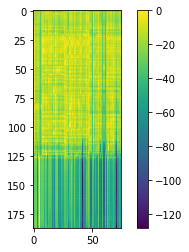

하------------------ᆫᆫ국의  봉무-들은ᆫ--  자-신-ᅳᅳᆯ에ᄀ게  너ᅥᄆᄆᄆᄆ마는 것을ᆯ옥ᅡᅡᅡ넨것ᆺ가-ᇀᇀ----아요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
한국의 봉무들은 자신ᅳᆯ에게 너마는 것을옥ᅡ넨것같아요.<eos>
한국의 부모들은 자식들에게 너무 많은 것을 요구하는 것 같아요.<eos>---------------


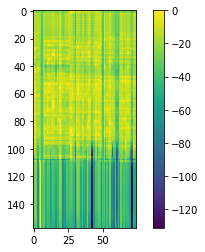

-------------------------------------------------------------------------------------------------------
09-01 15:41:40
Mean Train Loss: 0.016194295811442452
Mean Evaluation Loss: 0.023669571911567877
-------------------------------------------------------------------------------------------------------
09-01 15:42:00
Mean Train Loss: 0.016220873340324293
Mean Evaluation Loss: 0.02512993858779826
-------------------------------------------------------------------------------------------------------
09-01 15:42:20
Mean Train Loss: 0.023140761283552743
Mean Evaluation Loss: 0.025129855351260513
-------------------------------------------------------------------------------------------------------
09-01 15:42:40
Mean Train Loss: 0.021190242757739
Mean Evaluation Loss: 0.025090376529897904
-------------------------------------------------------------------------------------------------------
09-01 15:43:00
Mean Train Loss: 0.01868043674319804
Mean Evaluation Loss: 0.024617361761836303
-----

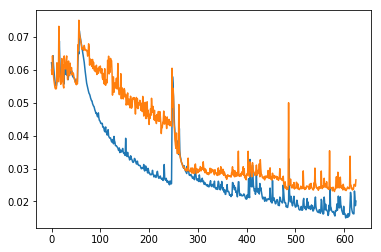

저---------------희  네-장의  모-둔 풍-목이ᅵ--   ᄋ이-먼-지에  치세-고ᅩ--  ᄉ삼십 퍼-셀ᄐ트-단지ᅵ-  할릭 판며ᄅ를 하--ᆸᆸᆸ니ᄃ다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
저희 네장의 모둔 풍목이 이먼지에 치세고 삼십 퍼셀트단지 할릭 판며를 합니다.<eos>
저희 매장의 모든 품목이 이번 주에 최고 삼십 퍼센트까지 할인 판매를 합니다.<eos>-----------------


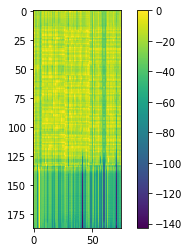

우--------------------리  바-기 ᄋᄋ엤는 대-군운에 사ᅡ-동들ᄋᄋ---  ᄋ으-걱으ᄉ서서이ᅵ ᅵᅧ웡건 들리--ᆸᆸᆸ니다..<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
우리 바기 엤는 대군운에 사동들ᄋ 으걱으서서이 ᅵᅧ웡건 들립니다.<eos>
우리 가게에 있는 대부분의 상품들이 유럽에서 수입해 온 것들입니다.<eos>------------


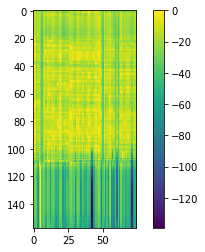

-------------------------------------------------------------------------------------------------------
09-01 15:43:41
Mean Train Loss: 0.018012390917224397
Mean Evaluation Loss: 0.024710142163959593
-------------------------------------------------------------------------------------------------------
09-01 15:44:00
Mean Train Loss: 0.016502252712076487
Mean Evaluation Loss: 0.02400051310140499
-------------------------------------------------------------------------------------------------------
09-01 15:44:20
Mean Train Loss: 0.015592679165240212
Mean Evaluation Loss: 0.023635733057016047
-------------------------------------------------------------------------------------------------------
09-01 15:44:40
Mean Train Loss: 0.01523860530220065
Mean Evaluation Loss: 0.02347684268910722
-------------------------------------------------------------------------------------------------------
09-01 15:45:00
Mean Train Loss: 0.015141051622989812
Mean Evaluation Loss: 0.0235556201256921
-----

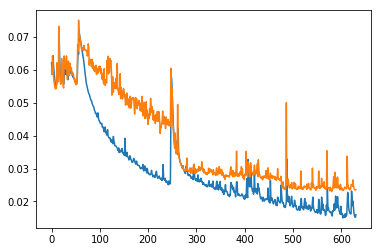

다-----------------------ᆼ신읜 사진ᄋ의 엄모-도 하ᅡᄀ고----  당ᆼ신의 관 심-처ᄅ를-   다ᅡ은 사ᄅ람과  공유ᄅ할 수 있ᄉ습ᆸ니다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
당신읜 사진의 엄모도 하고 당신의 관 심처를 다은 사람과 공유ᄅ할 수 있습니다.<eos>
당신의 사진을 업로드하고 당신의 관심사를 다른 사람과 공유할 수 있습니다.<eos>----------------


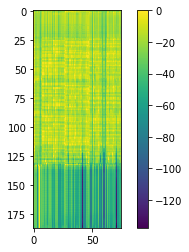

딸------------------라라ᄂ는 어지ᄅ나 께 ᄋᆷᅵ  열지-에  단ᄌ지----------   제-리 다ᅡ아ᅡ아ᅡ ᅡᅡ ᅥᅥ 돗 거-아--ᆻᆻ---어요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
딸라라는 어지ᄅ나 께 ᄋᆷᅵ 열지에 단지 제리 다아아 ᅡ ᅥ 돗 거았어요.<eos>
딸아이는 어찌나 게임에 열중했던지 제가 다가가는 것도 몰랐어요.<eos>----------------


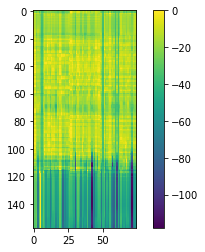

-------------------------------------------------------------------------------------------------------
09-01 15:45:40
Mean Train Loss: 0.018727863889484764
Mean Evaluation Loss: 0.025148037770563233
-------------------------------------------------------------------------------------------------------
09-01 15:45:59
Mean Train Loss: 0.016771819164949783
Mean Evaluation Loss: 0.023545195172872676
-------------------------------------------------------------------------------------------------------
09-01 15:46:19
Mean Train Loss: 0.015646888499274605
Mean Evaluation Loss: 0.023489623161555426
-------------------------------------------------------------------------------------------------------
09-01 15:46:38
Mean Train Loss: 0.021734169681169563
Mean Evaluation Loss: 0.02558599334938497
-------------------------------------------------------------------------------------------------------
09-01 15:46:58
Mean Train Loss: 0.016833641225663578
Mean Evaluation Loss: 0.02436959359581364
--

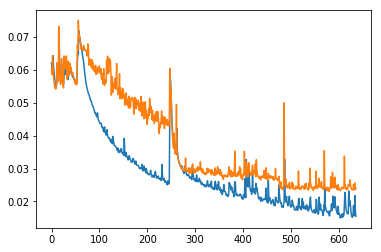

구----------------------ᆨᄌ제-연-납의  공식 언어-는ᆫ-----  아--아--어ᅥ,,-----   중-국-어ᅥᅥ,,---   여ᅧᆼᄋ요,,-----   -불어ᅥ,,,-----  ᄋ어-시-아-어,,----  스-팍인 어-------ᅵ다..<eos><eos><eos><eos>
국제연납의 공식 언어는 아아어, 중국어, 영요, 불어, 어시아어, 스팍인 어ᅵ다.<eos>
국제연합의 공식 언어는 아랍어, 중국어, 영어, 불어, 러시아어, 스페인어이다.<eos>-----------------


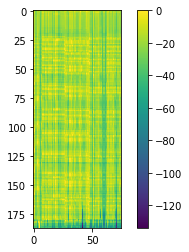

누----------------- 수-수를 해 기-대 ᄆ믄에-  태ᅢᅣᆼᆼᅳᅳ로ᄋ운더 르ᄅ을 봉ᄋᄋ할헤-골   청으ᅳᆯ 얼수-게-ᆻᆻ--ᄋ어요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
누 수수를 해 기대 믄에 태ᅣᆼᅳ로운더 르ᄅ을 봉ᄋ할헤골 청을 얼수겠어요.<eos>
눈 수술을 했기 때문에 태양으로부터 눈을 보호하려고 선글라스를 써요.<eos>-----------


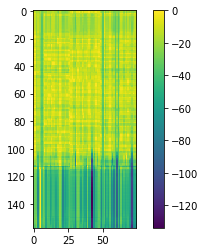

-------------------------------------------------------------------------------------------------------
09-01 15:47:39
Mean Train Loss: 0.015113036501397113
Mean Evaluation Loss: 0.023527493055962634
-------------------------------------------------------------------------------------------------------
09-01 15:47:59
Mean Train Loss: 0.016528754222133898
Mean Evaluation Loss: 0.024764013912783087
-------------------------------------------------------------------------------------------------------
09-01 15:48:18
Mean Train Loss: 0.015513184712642021
Mean Evaluation Loss: 0.023736416669586518
-------------------------------------------------------------------------------------------------------
09-01 15:48:38
Mean Train Loss: 0.015200340352880181
Mean Evaluation Loss: 0.023667053666193535
-------------------------------------------------------------------------------------------------------
09-01 15:48:59
Mean Train Loss: 0.0148881709623509
Mean Evaluation Loss: 0.02352262524294497
---

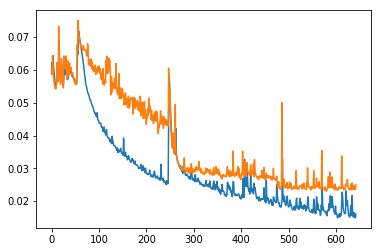

많-----------------은 겨ᅧ-우----  출이 소-설-에-서ᅥ----- -배-굥ᆼ이-나  지이-복의 주-걱으ᅳᆫ-----  구-서ᄒ희ᅴ-엤어ᅥᅥ  주-요한 요--조------다..<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
많은 겨우 출이 소설에서 배굥이나 지이복의 주걱은 구서희엤어 주요한 요조다.<eos>
많은 경우 추리 소설에서 배경이나 주인공의 직업은 구성에 있어 중요한 요소다.<eos>---------------


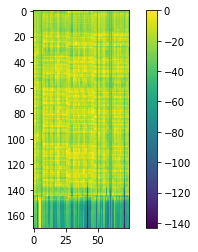

애------------쇠--각게-느ᅳᆫᆫ--  일루ᅥᅮ으ᅳᆯ 달나는 대ᄂ는   때-기 한낸ᄀ  어는 것 가-----ᇀ다ᅡ.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
애쇠각게는 일루ᅥᅮ을 달나는 대는 때기 한낸ᄀ 어는 것 같다.<eos>
내 생각에는 외로움을 달래는 데는 티브이만 한 게 없는 거 같아.<eos>---------------


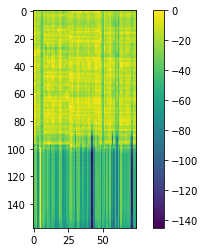

-------------------------------------------------------------------------------------------------------
09-01 15:49:39
Mean Train Loss: 0.01771093468471546
Mean Evaluation Loss: 0.026494571157938993
-------------------------------------------------------------------------------------------------------
09-01 15:49:59
Mean Train Loss: 0.01645911676785973
Mean Evaluation Loss: 0.024477920390537432
-------------------------------------------------------------------------------------------------------
09-01 15:50:18
Mean Train Loss: 0.014953554070529078
Mean Evaluation Loss: 0.024145641580550208
-------------------------------------------------------------------------------------------------------
09-01 15:50:38
Mean Train Loss: 0.017980474278608844
Mean Evaluation Loss: 0.02482811831735549
-------------------------------------------------------------------------------------------------------
09-01 15:50:58
Mean Train Loss: 0.015122779650987005
Mean Evaluation Loss: 0.02451286894364446
----

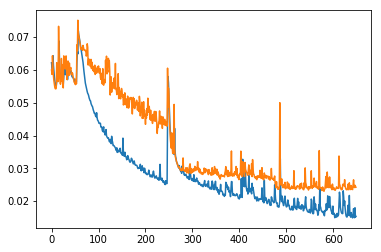

카-------------------드을 분ᄉᄉ-하ᅡ거ᄅ나  도-연 당하--경오------ ᄌ직쉬ᅵᅵ 신고-헤-서------ 카ᅡ드ᅳᄅ를 정지-시ᅵ켜야 ᄒ하-ᆸᆸᆸᆸ-니ᅵ다..<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
카드을 분ᄉ하거ᄅ나 도연 당하경오 직쉬ᅵ 신고헤서 카드를 정지시켜야 합니다.<eos>
카드를 분실하거나 도난 당할 경우 즉시 신고해서 카드를 정지시켜야 합니다.<eos>--------------------


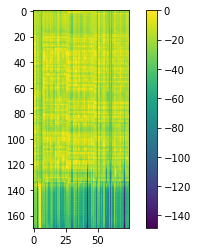

그---------------- 여-성-작다ᅡ느ᅳᆫ--- ᄋ여ᄉ석세 사이 장지일을 노-비-는 데-  흐-게  기-여-야-와-----ᆻᆻ다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
그 여성작다는 여석세 사이 장지일을 노비는 데 흐게 기여야왔다.<eos>
그 여성 작가는 여성의 사회적 지위를 높이는 데 크게 기여해 왔다.<eos>-----------------


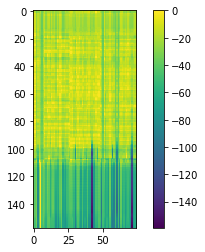

-------------------------------------------------------------------------------------------------------
09-01 15:51:39
Mean Train Loss: 0.014507896234716768
Mean Evaluation Loss: 0.024096716832731242
-------------------------------------------------------------------------------------------------------
09-01 15:51:58
Mean Train Loss: 0.01410927226023069
Mean Evaluation Loss: 0.023993835221782972
-------------------------------------------------------------------------------------------------------
09-01 15:52:18
Mean Train Loss: 0.01475283278327415
Mean Evaluation Loss: 0.023911885764394503
-------------------------------------------------------------------------------------------------------
09-01 15:52:39
Mean Train Loss: 0.013903097553978134
Mean Evaluation Loss: 0.02415336324155517
-------------------------------------------------------------------------------------------------------
09-01 15:52:59
Mean Train Loss: 0.014527308124295816
Mean Evaluation Loss: 0.024695009425973056
---

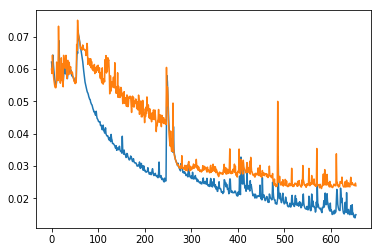

오-----------------릴넉그 ᄀ구ᄌ전ᄂ나-다는 ᄎ촉게 신노ᄂ는----  옥서서ᅡ 안 노오-어-나--  난-만이 안 될 때-이-ᆸᆸᆸ--니다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
오릴넉그 구전나다는 촉게 신노는 옥서서ᅡ 안 노오어나 난만이 안 될 때입니다.<eos>
보일러가 고장 났다는 초기 신호는 온수가 안 나오거나 난방이 안 될 때입니다.<eos>-----------------


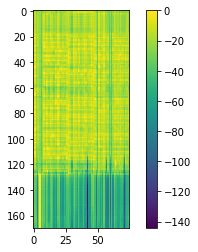

저--------------는 그-사-람ᆷ이----  나-애연이 며ᅡᄌ자ᄃ드ᅳᅳᆯ 대하느ᅳ  태ᄃ고ᄀ가-   마ᅡᅮᄆ  ᄋ안 들------어요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
저는 그사람이 나애연이 며ᅡ자들 대하느 태ᄃ고가 마ᅮᄆ 안 들어요.<eos>
저는 그 사람이 나이 어린 여자들을 대하는 태도가 마음에 안 들어요.<eos>---------------


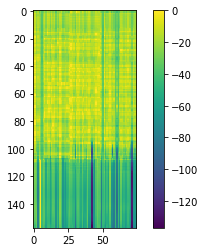

-------------------------------------------------------------------------------------------------------
09-01 15:53:39
Mean Train Loss: 0.014139516349324864
Mean Evaluation Loss: 0.02414604059786711
-------------------------------------------------------------------------------------------------------
09-01 15:53:59
Mean Train Loss: 0.014350315609383955
Mean Evaluation Loss: 0.023848927032995418
-------------------------------------------------------------------------------------------------------
09-01 15:54:19
Mean Train Loss: 0.014162721312094907
Mean Evaluation Loss: 0.024150822528673774
-------------------------------------------------------------------------------------------------------
09-01 15:54:39
Mean Train Loss: 0.015670575418405396
Mean Evaluation Loss: 0.028257942758332318
-------------------------------------------------------------------------------------------------------
09-01 15:54:59
Mean Train Loss: 0.018589809448519113
Mean Evaluation Loss: 0.024915987496632052
-

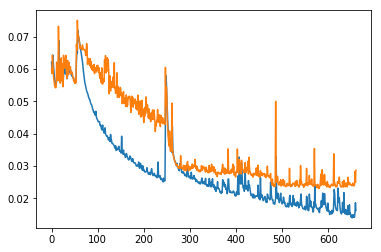

자-----------------------ᄋ ᄀᄀ ᄋᄉᆺ 있사ᄋ아-을-때---------  거-아-서  닪ᅳᅳᆼ 거ᄅ이ᄋᄋ 지-금픔 가림가ᅡᅳᅳ-다ᅡ는 게---   타-ᅳᆷ ᄌ좋아ᅡ--ᆻᆻ----어요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
자ᄋ ᄀ ᄋᄉᆺ 있사아을때 거아서 닪ᅳᆼ 거ᄅ이ᄋ 지금픔 가림가ᅳ다는 게 타ᅳᆷ 좋았어요.<eos>
처음 이곳에 이사 왔을 때 걸어서 닿는 거리에 식료품 가게가 있다는 게 참 좋았어요.<eos>----------


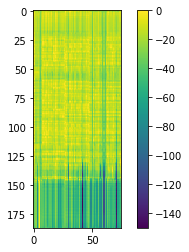

우----------------------리  가ᄀ개의-이-는 대-분믄에ᅦ 산봉들이----  유-력흐  수ᅮᄋᄋ  ᅵᅢᄋᄋᄀᄀ가ᄃ드ᄅ리--ᆸᆸᆸᄂ니다..<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
우리 가개의이는 대분믄에 산봉들이 유력흐 수ᄋ ᅵᅢᄋ가드립니다.<eos>
우리 가게에 있는 대부분의 상품들이 유럽에서 수입해 온 것들입니다.<eos>------------


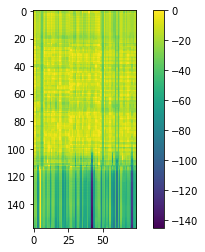

-------------------------------------------------------------------------------------------------------
09-01 15:55:39
Mean Train Loss: 0.01689440262749516
Mean Evaluation Loss: 0.02456454833112946
-------------------------------------------------------------------------------------------------------
09-01 15:55:59
Mean Train Loss: 0.015452060814582003
Mean Evaluation Loss: 0.02509582580767832
-------------------------------------------------------------------------------------------------------
09-01 15:56:19
Mean Train Loss: 0.014586379844924904
Mean Evaluation Loss: 0.02445130820165912
-------------------------------------------------------------------------------------------------------
09-01 15:56:39
Mean Train Loss: 0.014362757045708864
Mean Evaluation Loss: 0.024630078623251214
-------------------------------------------------------------------------------------------------------
09-01 15:56:59
Mean Train Loss: 0.015685947144503526
Mean Evaluation Loss: 0.027451794993443763
----

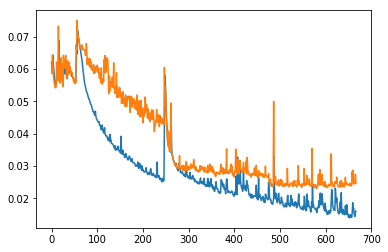

사------------ᅡᅡᆷ들은 머ᄅ리 있는 사람을 볼롤 때----  소-을 오-모-하-게  만들어  입-카ᄋ에  되---ᆸᆸᆸ-니ᅵ다..<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
사ᅡᆷ들은 머리 있는 사람을 볼롤 때 소을 오모하게 만들어 입카에 됩니다.<eos>
사람들은 멀리 있는 사람을 부를 때 손을 오목하게 만들어 입가에 댑니다.<eos>-------------------


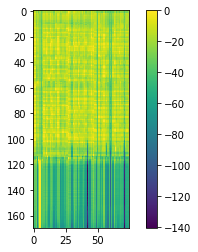

하-----------------ᆫ국의  보-몰들은ᆫ--   자-식을에ᄀ게  너 무ᄆ마ᅡ는 것을 욯ᅡᅡ느ᅡ  거 가ᅡᇀᇀ----아요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
한국의 보몰들은 자식을에게 너 무마는 것을 욯ᅡ느ᅡ 거 같아요.<eos>
한국의 부모들은 자식들에게 너무 많은 것을 요구하는 것 같아요.<eos>---------------


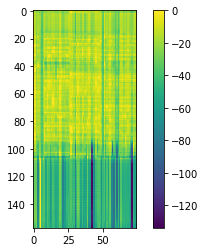

-------------------------------------------------------------------------------------------------------
09-01 15:57:39
Mean Train Loss: 0.016424548396110315
Mean Evaluation Loss: 0.025344836523897324
-------------------------------------------------------------------------------------------------------
09-01 15:57:58
Mean Train Loss: 0.015219071421835078
Mean Evaluation Loss: 0.02426128234706433
-------------------------------------------------------------------------------------------------------
09-01 15:58:18
Mean Train Loss: 0.014108482890639238
Mean Evaluation Loss: 0.024078063967133027
-------------------------------------------------------------------------------------------------------
09-01 15:58:38
Mean Train Loss: 0.014000794296040868
Mean Evaluation Loss: 0.02473957053264167
-------------------------------------------------------------------------------------------------------
09-01 15:58:57
Mean Train Loss: 0.014888495665248767
Mean Evaluation Loss: 0.02474324471705684
---

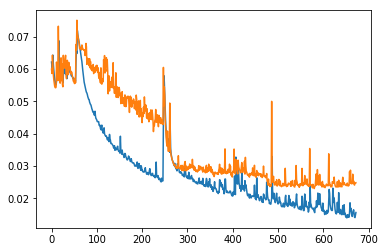

처-------------------------일곳에 이ᄉ샀았을 때---------  거ᅥ어-서ᅥ 다-는 걱리에 침룡포ᅩ 강기 가 ᅵᆻ다ᅡ는 게---   참ᆷᆷ  ᅩᅩᇂ-아--ᆻᆻ----어요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
처일곳에 이샀았을 때 거어서 다는 걱리에 침룡포 강기 가 ᅵᆻ다는 게 참 ᅩᇂ았어요.<eos>
처음 이곳에 이사 왔을 때 걸어서 닿는 거리에 식료품 가게가 있다는 게 참 좋았어요.<eos>----------


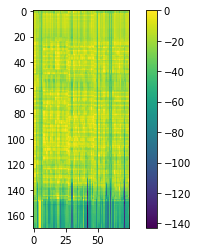

우--------------------느ᅢ  장-만는ᆫ 융알 종ᄉ숭에 시-작에ᄉ서---  치-르ᅳᆯ 추ᄋ이 끈난 것설을 예 사ᅡᄃ되---ᆸᆸ-니다..<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
우느ᅢ 장만는 융알 종숭에 시작에서 치를 추이 끈난 것설을 예 사됩니다.<eos>
올해 장마는 유월 중순에 시작해서 칠 월 초에 끝날 것으로 예상됩니다.<eos>--------


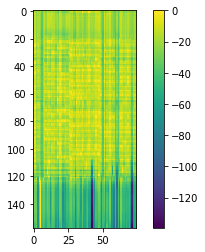

-------------------------------------------------------------------------------------------------------
09-01 15:59:38
Mean Train Loss: 0.02037836790966686
Mean Evaluation Loss: 0.03342122185486396
-------------------------------------------------------------------------------------------------------
09-01 15:59:58
Mean Train Loss: 0.0224310935360152
Mean Evaluation Loss: 0.025618729721430637
-------------------------------------------------------------------------------------------------------
09-01 16:00:18
Mean Train Loss: 0.016679409942938275
Mean Evaluation Loss: 0.025314287709040113
-------------------------------------------------------------------------------------------------------
09-01 16:00:38
Mean Train Loss: 0.01570866906801182
Mean Evaluation Loss: 0.024590995082885928
-------------------------------------------------------------------------------------------------------
09-01 16:00:57
Mean Train Loss: 0.015490945885329234
Mean Evaluation Loss: 0.028156427185006223
-----

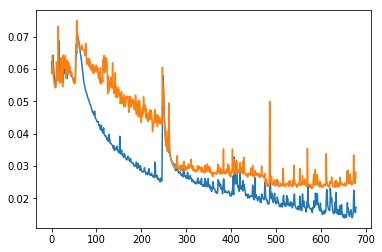

그-----------------녀ᄂ는 자ᄉᄉᆫ에 ᄌ지ᄂ는을 이-ᅭᆼᆼ에---  ᄆ명의ᄋᄋ의 부ᄅ를 추-구아 는데-는   아-무ᅮ 과ᅪ-실이  없어------ᆻ다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
그녀는 자ᄉᆫ에 지는을 이ᅭᆼ에 명의의 부를 추구아 는데는 아무 과실이 없었다.<eos>
그녀는 자신의 재능을 이용해 명예와 부를 추구하는 데는 아무 관심이 없었다.<eos>------------------


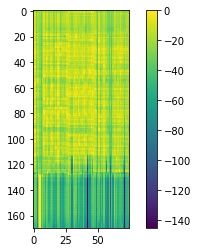

그-------------- 여-선-작-갈은--   여성의 사ᅡ의 적지일을 목폈는 데-   프-이  기여-아-화-----ᆻ다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
그 여선작갈은 여성의 사의 적지일을 목폈는 데 프이 기여아홨다.<eos>
그 여성 작가는 여성의 사회적 지위를 높이는 데 크게 기여해 왔다.<eos>-----------------


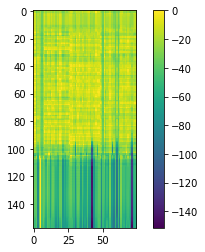

-------------------------------------------------------------------------------------------------------
09-01 16:01:39
Mean Train Loss: 0.01665033868490074
Mean Evaluation Loss: 0.02498458435491512
-------------------------------------------------------------------------------------------------------
09-01 16:01:58
Mean Train Loss: 0.014939186915235426
Mean Evaluation Loss: 0.024902029192870562
-------------------------------------------------------------------------------------------------------
09-01 16:02:18
Mean Train Loss: 0.014643295317815332
Mean Evaluation Loss: 0.02457347829440499
-------------------------------------------------------------------------------------------------------
09-01 16:02:38
Mean Train Loss: 0.014639177693367705
Mean Evaluation Loss: 0.02464219135529742
-------------------------------------------------------------------------------------------------------
09-01 16:02:57
Mean Train Loss: 0.014076992757795498
Mean Evaluation Loss: 0.024934524568674662
----

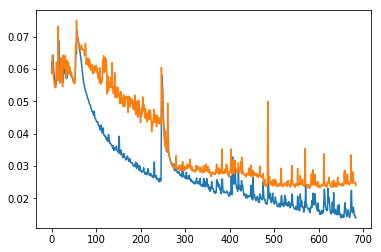

주-------------ᆷᆼ궁에의ᅴ 뵈외 버ᅥ리ᄋ을 서리ᅵ하ᅡᄀ고자 한ᄃ도-면ᆫ----   고ᅩ령 해ᄒ야ᄒ알 사ᄒ아ᄋ이  며ᅧᆨ-하-지 있ᄉ습ᆸᆸᆸ-ᄂ니다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
줌ᆼ궁에의 뵈외 버리을 서리하고자 한도면 고령 해ᄒ야ᄒ알 사ᄒ아이 멱하지 있습니다.<eos>
중국에 해외 법인을 설립하고자 한다면 고려해야 할 사항이 몇 가지 있습니다.<eos>-----------------


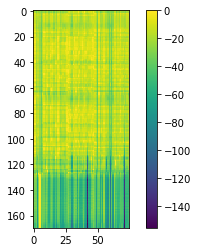

그  --------------------사-람은 소--자ᄅ려-에ᄉ서----   자-이  이-한 이-하-기ᄅ로--  사ᅡ람ᆷ들를 지고하ᅡᄀ기 만 드------ᆫ다..<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
그 사람은 소자려에서 자이 이한 이하기로 사람들를 지고하기 만 든다.<eos>
그 사람은 술자리에서 자기 옛날이야기로 사람들을 지루하게 만든다.<eos>---------------


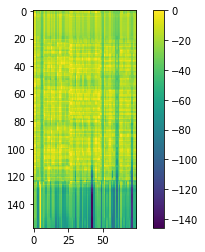

-------------------------------------------------------------------------------------------------------
09-01 16:03:37
Mean Train Loss: 0.014538253417029088
Mean Evaluation Loss: 0.024951036982276138
-------------------------------------------------------------------------------------------------------
09-01 16:03:57
Mean Train Loss: 0.014484073795434437
Mean Evaluation Loss: 0.02615554350482246
-------------------------------------------------------------------------------------------------------
09-01 16:04:17
Mean Train Loss: 0.017024490677241044
Mean Evaluation Loss: 0.024653416251500526
-------------------------------------------------------------------------------------------------------
09-01 16:04:36
Mean Train Loss: 0.014726884466202683
Mean Evaluation Loss: 0.02472854250232333
-------------------------------------------------------------------------------------------------------
09-01 16:04:57
Mean Train Loss: 0.014854838943523662
Mean Evaluation Loss: 0.02562022037166659
---

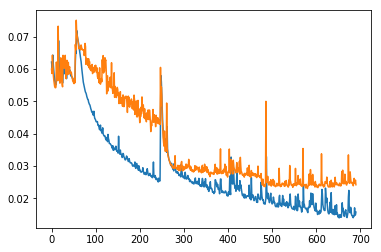

기-----------증붐이 ᄀᄀ-소  들어ᄋᄆᄆᆫᅧᄉ서------ 오-리ᄂ는 저장 곤강ᄋ이ᄇ부ᅩᅮᆨ해 다ᄂ은 사실을 깨-달아-ᆻᆻᆻ-----------------어요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
기증붐이 ᄀ소 들어ᄋᄆᆫᅧ서 오리는 저장 곤강이부ᅩᅮᆨ해 다ᄂ은 사실을 깨달았어요.<eos>
기증품이 계속 들어오면서 우리는 저장 공간이 부족하다는 사실을 깨달았어요.<eos>----------------


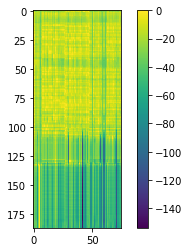

몇------------ 수-수롤 해 해-대-문ᄋ에   태ᅢᅣᆼ그ᄅ로 운더 능을 봉어할라-고-   석을ᆯ 할수-앴ᆻᆻ------------어요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
몇 수수롤 해 해대문에 태ᅣᆼ그로 운더 능을 봉어할라고 석을 할수앴어요.<eos>
눈 수술을 했기 때문에 태양으로부터 눈을 보호하려고 선글라스를 써요.<eos>-----------


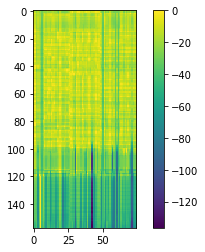

-------------------------------------------------------------------------------------------------------
09-01 16:05:36
Mean Train Loss: 0.014188133434652542
Mean Evaluation Loss: 0.02403111435143174
-------------------------------------------------------------------------------------------------------
09-01 16:05:56
Mean Train Loss: 0.014836441132967677
Mean Evaluation Loss: 0.02431553843057565
-------------------------------------------------------------------------------------------------------
09-01 16:06:16
Mean Train Loss: 0.013603345197609924
Mean Evaluation Loss: 0.024260389681542406
-------------------------------------------------------------------------------------------------------
09-01 16:06:37
Mean Train Loss: 0.02936484380588178
Mean Evaluation Loss: 0.04146375925247155
-------------------------------------------------------------------------------------------------------
09-01 16:06:56
Mean Train Loss: 0.03571363397221172
Mean Evaluation Loss: 0.030201734603781113
-----

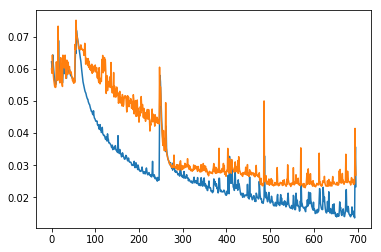

우--------------------리-느ᅳ--ᆫᆫ-----  금요ᄋ의  ᅩᅩ우ᄋᄋ  거-가ᅡᅡ---  일요ᅭᄋᆯ 전녀ᄀ교 아 보ᅩ러 소 있있ᄀ거ᄅᄋᆯ 생각ᄒ해-ᆻᆻ--------------어요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
우리는 금요의 ᅩ우ᄋ 거가 일요ᄋᆯ 전녀교 아 보러 소 있있거ᄅᄋᆯ 생각했어요.<eos>
우리는 금요일 오후에 떠나 일요일 저녁에 돌아올 수 있을 거라 생각했어요.<eos>--------------------


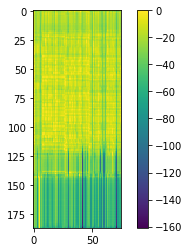

우----------------------리  가-개ᄋ ᄋ있는 대-궁은에  상붕들이----- 요-랍으  ᄉ서ᄋ이 패ᄒᄒᆼᆼ고-들이--ᆸᆸᆸ--------------니다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
우리 가개ᄋ 있는 대궁은에 상붕들이 요랍으 서이 패ᄒᆼ고들입니다.<eos>
우리 가게에 있는 대부분의 상품들이 유럽에서 수입해 온 것들입니다.<eos>------------


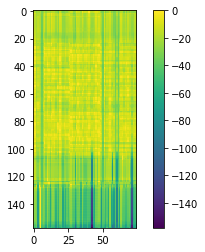

-------------------------------------------------------------------------------------------------------
09-01 16:07:37
Mean Train Loss: 0.01964922895369963
Mean Evaluation Loss: 0.026781927780966892
-------------------------------------------------------------------------------------------------------
09-01 16:07:57
Mean Train Loss: 0.021341686543851466
Mean Evaluation Loss: 0.02607340806337276
-------------------------------------------------------------------------------------------------------
09-01 16:08:17
Mean Train Loss: 0.017568302894724653
Mean Evaluation Loss: 0.025258381425756832
-------------------------------------------------------------------------------------------------------
09-01 16:08:37
Mean Train Loss: 0.017118776643318748
Mean Evaluation Loss: 0.024920222492678175
-------------------------------------------------------------------------------------------------------
09-01 16:08:56
Mean Train Loss: 0.017306813060541323
Mean Evaluation Loss: 0.025161287101943704
--

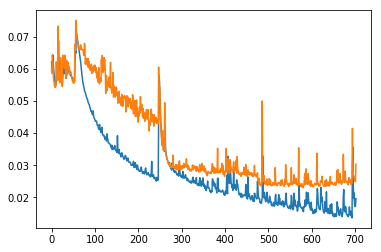

조--------------ᆫᆫ궁에ᅦ  ᄒᄒᄋᄋᆯᆯ벌른ᅳᄋᄉᄉᆼᆯ리 하ᅡ보ᅩ 장ᆻ다-며ᅧᆫᆫ----  그ᄀ리ᄅ아ᄒ외야하  사ᅡ아ᅡᄋ이  ᄋ격ᆨ가  ᅦ  ᅵᅵᄉ스-ᆸᆸᆸ--------니ᅵ다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
존궁에 ᄒᄋᆯ벌른ᅳᄋᄉᆼᆯ리 하보 장ᆻ다면 그ᄀ리ᄅ아ᄒ외야하 사아이 ᄋ격가 ᅦ ᅵ습니다.<eos>
중국에 해외 법인을 설립하고자 한다면 고려해야 할 사항이 몇 가지 있습니다.<eos>-----------------


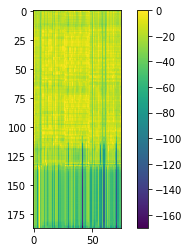

하------------------ᆫᄀ국에 보-모-들는---   자ᄉ식드-에기ᅦᅦ ᄂᄋ우ᄆᄆ아ᅡ는 거우을ᆨᆨ가ᄒ해ᅢ 것 ᅡᅡ-ᇀᇀᇀ----------아요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
한국에 보모들는 자식드에기ᅦ ᄂ우ᄆ아는 거우을ᆨ가해 것 ᅡᇀ아요.<eos>
한국의 부모들은 자식들에게 너무 많은 것을 요구하는 것 같아요.<eos>---------------


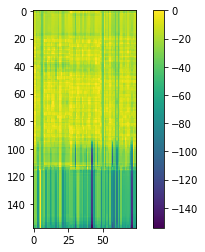

-------------------------------------------------------------------------------------------------------
09-01 16:09:37
Mean Train Loss: 0.019925015892847342
Mean Evaluation Loss: 0.025622093571418376
-------------------------------------------------------------------------------------------------------
09-01 16:09:56
Mean Train Loss: 0.01667065539846053
Mean Evaluation Loss: 0.0249011630773021
-------------------------------------------------------------------------------------------------------
09-01 16:10:17
Mean Train Loss: 0.015915061737269007
Mean Evaluation Loss: 0.02507731816561703
-------------------------------------------------------------------------------------------------------
09-01 16:10:36
Mean Train Loss: 0.015367046590001671
Mean Evaluation Loss: 0.024662310421911388
-------------------------------------------------------------------------------------------------------
09-01 16:10:56
Mean Train Loss: 0.014859391175597368
Mean Evaluation Loss: 0.024361662168564693
----

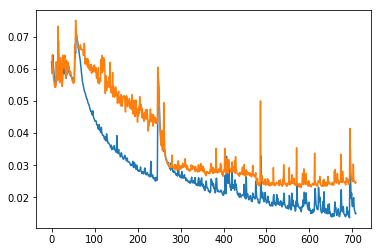

부--------옹화ᅪ 저-지르느ᅳ   큰  실-수--종 하-나ᄂ는--------  ᄌ자-ᄀ기 아ᄋ이ᄅ를ᆯ--   다ᄅ른 지  아ᄋ여ᅡ  비-교-하른 것------------이다..<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
부옹화 저지르느 큰 실수종 하나는 자기 아이를 다른 지 아여ᅡ 비교하른 것이다.<eos>
부모가 저지르는 큰 실수 중 하나는 자기 아이를 다른 집 아이와 비교하는 것이다.<eos>-----------------


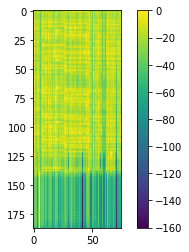

그-------------  여-성-작-갈은--  여-성의 사 의성 지일을 노-기-는 데-  그-에  기-여ᄋ야-와--------------ᆻ다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
그 여성작갈은 여성의 사 의성 지일을 노기는 데 그에 기여야왔다.<eos>
그 여성 작가는 여성의 사회적 지위를 높이는 데 크게 기여해 왔다.<eos>-----------------


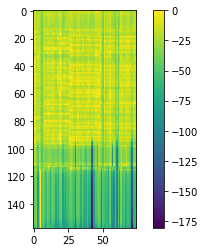

-------------------------------------------------------------------------------------------------------
09-01 16:11:36
Mean Train Loss: 0.015001296754147917
Mean Evaluation Loss: 0.025425001354881543
-------------------------------------------------------------------------------------------------------
09-01 16:11:57
Mean Train Loss: 0.01962628405906241
Mean Evaluation Loss: 0.026763785095335522
-------------------------------------------------------------------------------------------------------
09-01 16:12:16
Mean Train Loss: 0.016960890058505165
Mean Evaluation Loss: 0.024828619813477552
-------------------------------------------------------------------------------------------------------
09-01 16:12:36
Mean Train Loss: 0.01531357378992717
Mean Evaluation Loss: 0.025413294048657976
-------------------------------------------------------------------------------------------------------
09-01 16:12:56
Mean Train Loss: 0.01632658806149222
Mean Evaluation Loss: 0.024915097851548013
---

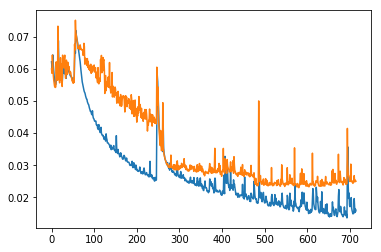

저---------------------ᄂ는 나--이  많이  가-여-서-----  새--ᅩᅩᆫ 새-감들에ᅦᄀ게-  마음을 여-는 데----  ᄆ많은 시-간이 걸---------------려요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
저는 나이 많이 가여서 새ᅩᆫ 새감들에게 마음을 여는 데 많은 시간이 걸려요.<eos>
저는 낯을 많이 가려서 새로운 사람들에게 마음을 여는 데 많은 시간이 걸려요.<eos>----------------


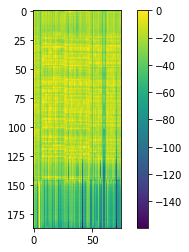

우------------리 대 항-에ᄂ는---  애-국잉 유-학생 을위현 ᄒ항구-거  광저-가  많역-디ᄋ이 있습ᆸᆸ----------ᄂ니다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
우리 대 항에는 애국잉 유학생 을위현 항구거 광저가 많역디이 있습니다.<eos>
우리 대학에는 외국인 유학생을 위한 한국어 강좌가 마련되어 있습니다.<eos>--------


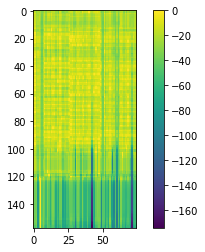

-------------------------------------------------------------------------------------------------------
09-01 16:13:36
Mean Train Loss: 0.017428271210819638
Mean Evaluation Loss: 0.025512056265558514
-------------------------------------------------------------------------------------------------------
09-01 16:13:56
Mean Train Loss: 0.015392184752530094
Mean Evaluation Loss: 0.02479177521242613
-------------------------------------------------------------------------------------------------------
09-01 16:14:15
Mean Train Loss: 0.018271635834999578
Mean Evaluation Loss: 0.024839167615342127
-------------------------------------------------------------------------------------------------------
09-01 16:14:35
Mean Train Loss: 0.015118199694599842
Mean Evaluation Loss: 0.024862886883060528
-------------------------------------------------------------------------------------------------------
09-01 16:14:55
Mean Train Loss: 0.015354015936954546
Mean Evaluation Loss: 0.024166463400097964
-

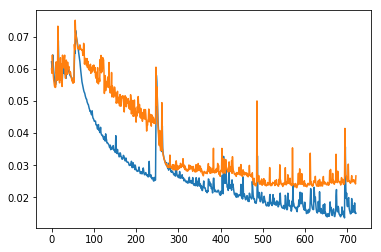

카-----------------들에 불지 학어ᄅ랄 도 난 당할 경후-----   주-시ᅵ  칭고-헤-서------  카ᄃ드ᄅ를 정지ᄉ시ᄏ켜야-하--ᆸᆸᆸ-------------ᄂ니다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
카들에 불지 학어랄 도 난 당할 경후 주시 칭고헤서 카드를 정지시켜야합니다.<eos>
카드를 분실하거나 도난 당할 경우 즉시 신고해서 카드를 정지시켜야 합니다.<eos>--------------------


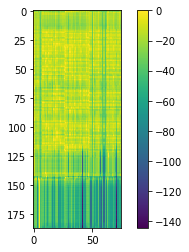

죄-----------------ᄉ송ᄒ하-지ᄆ만ᆫᆫ---  서-신 이 의 계-휽은ᆫ--  시-음 가-는ᄉ사이ᄋ없는것 핬ᄉ스-ᆸᆸᆸᆸ----------------ᄂ니다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
죄송하지만 서신 이 의 계휽은 시음 가는사이없는것 핬습니다.<eos>
죄송하지만, 선생님의 계획은 실현 가능성이 없는 것 같습니다.<eos>--------------


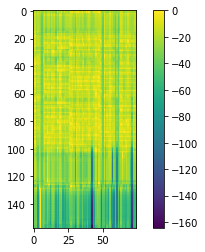

-------------------------------------------------------------------------------------------------------
09-01 16:15:36
Mean Train Loss: 0.02272886495994352
Mean Evaluation Loss: 0.02561377893553071
-------------------------------------------------------------------------------------------------------
09-01 16:15:56
Mean Train Loss: 0.019618644081763007
Mean Evaluation Loss: 0.025928660260507844
-------------------------------------------------------------------------------------------------------
09-01 16:16:15
Mean Train Loss: 0.018915383506238583
Mean Evaluation Loss: 0.026552299537309785
-------------------------------------------------------------------------------------------------------
09-01 16:16:35
Mean Train Loss: 0.017384721103766484
Mean Evaluation Loss: 0.02559276332322352
-------------------------------------------------------------------------------------------------------
09-01 16:16:55
Mean Train Loss: 0.015614024276259068
Mean Evaluation Loss: 0.02471391468324851
----

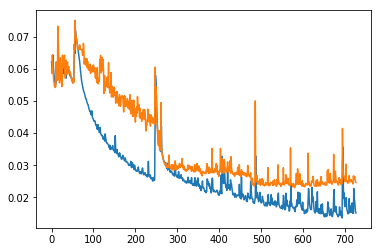

우----------------리ᄂ는  청북에  구-임 면에ᅦ  회-사-를 설입 한 이-에----  마-은 외-국인든을 지운해 왔스--ᆸᆸ--------니다..<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
우리는 청북에 구임 면에 회사를 설입 한 이에 마은 외국인든을 지운해 왔습니다.<eos>
우리는 십구백구십 년에 회사를 설립한 이래 많은 외국인들을 지원해 왔습니다.<eos>------------


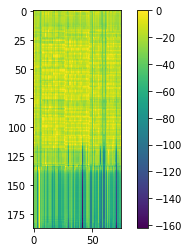

저-------------------난 울국 시 이-ᄌ잔 앙 ᅵᅵ웄슨인-게-는ᆫ---  -소- 장-명ᄋ은 서-일ᄉᄉ-를  재-공ᄒ하--ᆸᆸᆸ---------ᄂ니다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
저난 울국 시 이잔 앙 ᅵ웄슨인게는 소 장명은 서일ᄉ를 재공합니다.<eos>
저녁 일곱 시 이전에 오시는 손님께는 소주 한 병을 서비스로 제공합니다.<eos>-------


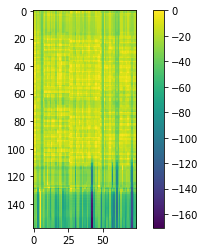

-------------------------------------------------------------------------------------------------------
09-01 16:17:36
Mean Train Loss: 0.014162662201189518
Mean Evaluation Loss: 0.02431891441695197
-------------------------------------------------------------------------------------------------------
09-01 16:17:56
Mean Train Loss: 0.02459833061084185
Mean Evaluation Loss: 0.029471821727541887
-------------------------------------------------------------------------------------------------------
09-01 16:18:15
Mean Train Loss: 0.022455177090882426
Mean Evaluation Loss: 0.02658295614716927
-------------------------------------------------------------------------------------------------------
09-01 16:18:35
Mean Train Loss: 0.021072837903193413
Mean Evaluation Loss: 0.02617146632480329
-------------------------------------------------------------------------------------------------------
09-01 16:18:56
Mean Train Loss: 0.018588976348198043
Mean Evaluation Loss: 0.027502176485983736
----

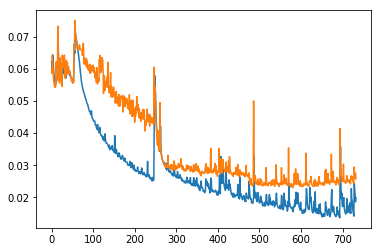

부-------ᄆ모-하- 저지ᄅ느ᅳᆫᆫ ᄋ은  ᄉᄉ수-소-중-하-다느ᅳᆫ--------   자-ᄋ이 아ᄋ이ᄅ를----  가-는 짐 아ᄀᄀ과  기기ᅵ-하는 것-------------이다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
부모하 저지ᄅ는 은 수소중하다는 자이 아이를 가는 짐 아과 기기하는 것이다.<eos>
부모가 저지르는 큰 실수 중 하나는 자기 아이를 다른 집 아이와 비교하는 것이다.<eos>-----------------


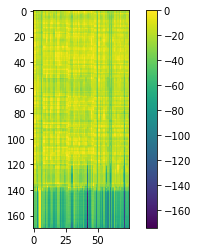

우-----------리  대ᄒ하-외ᄂ는ᆫ--  애-국이  유-헉색 을ᄋᄆᄒᆫᆫ ᄒ하-고-과  광저-가  많력-디ᄋᄋ ᄋ있스ᅳᆸᆸ-----------니다..<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
우리 대하외는 애국이 유헉색 을ᄋᄆᄒᆫ 하고과 광저가 많력디ᄋ 있습니다.<eos>
우리 대학에는 외국인 유학생을 위한 한국어 강좌가 마련되어 있습니다.<eos>--------


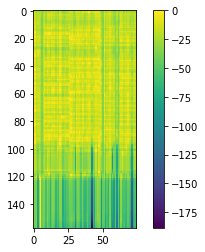

-------------------------------------------------------------------------------------------------------
09-01 16:19:36
Mean Train Loss: 0.01701566022999087
Mean Evaluation Loss: 0.02530408783375928
-------------------------------------------------------------------------------------------------------
09-01 16:19:56
Mean Train Loss: 0.01843941778743108
Mean Evaluation Loss: 0.026030342805307312
-------------------------------------------------------------------------------------------------------
09-01 16:20:15
Mean Train Loss: 0.017050694669473936
Mean Evaluation Loss: 0.02485573955918959
-------------------------------------------------------------------------------------------------------
09-01 16:20:35
Mean Train Loss: 0.01699560530524189
Mean Evaluation Loss: 0.02578907747875066
-------------------------------------------------------------------------------------------------------
09-01 16:20:55
Mean Train Loss: 0.015961561592324883
Mean Evaluation Loss: 0.024690331272719628
------

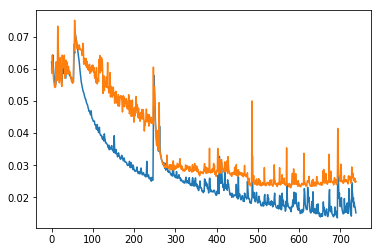

그---------------------외-다-부-ᄑ터  전형-펴-ᄋ이 ᄋᄋ핵-대-어----  학ᄉ산-되-는 것으ᅳᆯ 반ᄌᄌ하ᅡᆨ기-귀하ᅡ 모ᄅᄅ력이 있어ᅥ--------------------ᆻ다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
그외다부ᄑ터 전형펴이 ᄋ핵대어 학산되는 것을 반ᄌ학기귀하 모력이 있었다.<eos>
해외로부터 전염병이 유입되어 확산되는 것을 방지하기 위한 노력이 있었다.<eos>-------------------


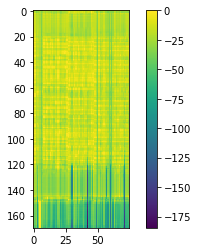

애--------------ᄉᄉᆼ-각-에ᄂ는ᆫ--  일ᄅ럼무ᅳᆯ 달라ᄂ는데ᄂ는-  피-이 할릭게 없는 것ᄀ가-------------ᇀ아.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
애ᄉᆼ각에는 일럼무ᅳᆯ 달라는데는 피이 할릭게 없는 것같아.<eos>
내 생각에는 외로움을 달래는 데는 티브이만 한 게 없는 거 같아.<eos>---------------


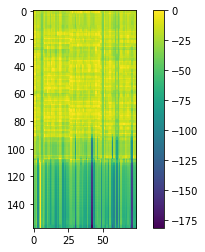

-------------------------------------------------------------------------------------------------------
09-01 16:21:35
Mean Train Loss: 0.014556118931619016
Mean Evaluation Loss: 0.024465087305842525
-------------------------------------------------------------------------------------------------------
09-01 16:21:54
Mean Train Loss: 0.014062464706817249
Mean Evaluation Loss: 0.024527556769530372
-------------------------------------------------------------------------------------------------------
09-01 16:22:14
Mean Train Loss: 0.014040516674034135
Mean Evaluation Loss: 0.02398230871938068
-------------------------------------------------------------------------------------------------------
09-01 16:22:35
Mean Train Loss: 0.01426202820637594
Mean Evaluation Loss: 0.024460505869911168
-------------------------------------------------------------------------------------------------------
09-01 16:22:54
Mean Train Loss: 0.020487688915223578
Mean Evaluation Loss: 0.04177224286702787
---

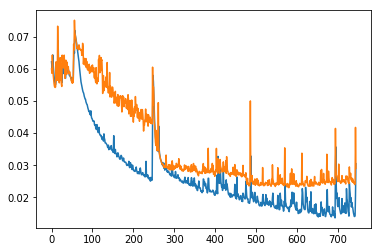

그---------------구ᅩᆯ으  ᆯᆯ인한 핬자인 거ᅥ  보-면-하지ᅵᄆ만ᆫ----- 저ᅥᄂᄂᆫᆫ  견-작으ᄅ록 ᄀ그근르ᅳᄌᄌᄌᇂᇂᇂ하ᄌ지 않ᆭ----------------아요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
그구ᅩᆯ으 ᆯ인한 핬자인 거 보면하지만 저ᄂᆫ 견작으록 그근르ᄌᇂ하지 않아요.<eos>
그분은 훌륭한 학자인 건 분명하지만, 저는 개인적으로 그분을 좋아하지 않아요.<eos>-----------


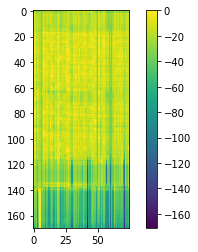

애---------------새-각ᆨ에느ᅳᆫᆫ--  ᄋ이ᄅ럼ᆷ을 달하는 대ᄂ는ᆫ  띠ᅵ이 하-양기 없니 ᄀ거-하---------------ᇀ아.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
애새각에는 이럼을 달하는 대는 띠이 하양기 없니 거핱아.<eos>
내 생각에는 외로움을 달래는 데는 티브이만 한 게 없는 거 같아.<eos>---------------


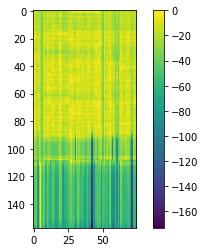

-------------------------------------------------------------------------------------------------------
09-01 16:23:34
Mean Train Loss: 0.020918630033883227
Mean Evaluation Loss: 0.026514750854340137
-------------------------------------------------------------------------------------------------------
09-01 16:23:54
Mean Train Loss: 0.01861163506108682
Mean Evaluation Loss: 0.025900822708800803
-------------------------------------------------------------------------------------------------------
09-01 16:24:15
Mean Train Loss: 0.0168813729663424
Mean Evaluation Loss: 0.02549890280240101
-------------------------------------------------------------------------------------------------------
09-01 16:24:34
Mean Train Loss: 0.016145407996510076
Mean Evaluation Loss: 0.024862478743646818
-------------------------------------------------------------------------------------------------------
09-01 16:24:54
Mean Train Loss: 0.01568685946361161
Mean Evaluation Loss: 0.025239250125239192
-----

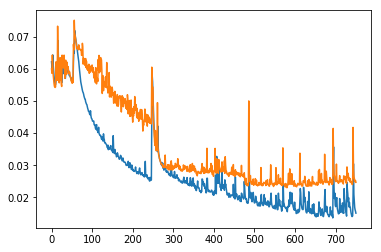

해---------------------외-ᄅ--보-터ᅥ  전영-병이 의 이--대-어---- -확-상-되ᄂ는 것ᄋ에  바ᄌᄌᄌ하ᅡ-귀ᅱ위한 오ᅩ-ᅧᅧᆨ이 있어ᅥ-------------------ᆻᆻ다..<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
해외ᄅ보터 전영병이 의 이대어 확상되는 것에 바ᄌ하귀위한 오ᅧᆨ이 있었다.<eos>
해외로부터 전염병이 유입되어 확산되는 것을 방지하기 위한 노력이 있었다.<eos>-------------------


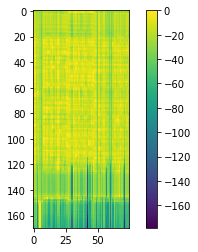

저-------------------느  구ᄀ곡ᄉ시 이 잔아어 지인ᆻ스 인-게-는----  소ᅩᅩ자ᅡᆼ 명ᄋ온ᄉᄉ서ᅥ이-소ᄅ으  재-공하ᅡ-ᆸᆸᆸᆸ--------ᄂ니다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
저느 구곡시 이 잔아어 지인ᆻ스 인게는 소장 명온서이소ᄅ으 재공합니다.<eos>
저녁 일곱 시 이전에 오시는 손님께는 소주 한 병을 서비스로 제공합니다.<eos>-------


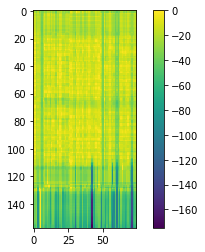

-------------------------------------------------------------------------------------------------------
09-01 16:25:34
Mean Train Loss: 0.01476627905195145
Mean Evaluation Loss: 0.025447280831218673
-------------------------------------------------------------------------------------------------------
09-01 16:25:54
Mean Train Loss: 0.014615538242179765
Mean Evaluation Loss: 0.02495369326327783
-------------------------------------------------------------------------------------------------------
09-01 16:26:15
Mean Train Loss: 0.014188695190606362
Mean Evaluation Loss: 0.024639747375690444
-------------------------------------------------------------------------------------------------------
09-01 16:26:34
Mean Train Loss: 0.013798543929201802
Mean Evaluation Loss: 0.02494435613425197
-------------------------------------------------------------------------------------------------------
09-01 16:26:54
Mean Train Loss: 0.013801727262851315
Mean Evaluation Loss: 0.025176456390264897
---

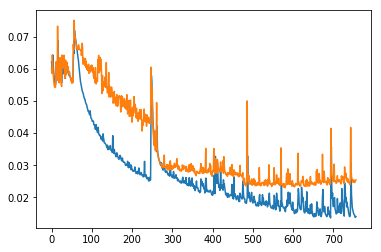

가----------------옥임 몇-년-간 형을 살ᄀ고 나-온-우-------  그ᄂ느 ᄉ사시ᅵᆯ하 에 살-깄ᆻ다-고   마ᅡ음 먹어-------------------ᆻ다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
가옥임 몇년간 형을 살고 나온우 그느 사실하 에 살깄다고 마음 먹었다.<eos>
감옥에 몇 년간 형을 살고 나온 후 그는 착실하게 살겠다고 마음먹었다.<eos>--------------------


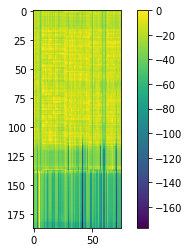

요----------------즘ᆷ에ᄂ는ᆫᆫ---  장긴 부-머ᄂ이 민 나 서-행 임을ᆯ--- 조ᅩᆼ경아ᅡᄌ  않은 아ᅡᄃ드이  많ᆭᆭ--------------------아ᅡ요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
요즘에는 장긴 부머ᄂ이 민 나 서행 임을 종경아ᄌ 않은 아드이 많아요.<eos>
요즘에는 자기 부모님이나 선생님을 존경하지 않는 아이들이 많아요.<eos>------------


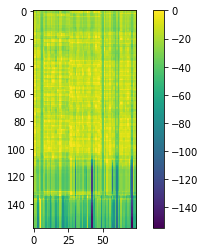

-------------------------------------------------------------------------------------------------------
09-01 16:27:34
Mean Train Loss: 0.014371682378132388
Mean Evaluation Loss: 0.025331568741751666
-------------------------------------------------------------------------------------------------------
09-01 16:27:55
Mean Train Loss: 0.013928992356092499
Mean Evaluation Loss: 0.0250062077551128
-------------------------------------------------------------------------------------------------------
09-01 16:28:15
Mean Train Loss: 0.013895888435424624
Mean Evaluation Loss: 0.02487316197884305
-------------------------------------------------------------------------------------------------------
09-01 16:28:34
Mean Train Loss: 0.013820116398131497
Mean Evaluation Loss: 0.025158544116770917
-------------------------------------------------------------------------------------------------------
09-01 16:28:54
Mean Train Loss: 0.013805778948589226
Mean Evaluation Loss: 0.02500413274966584
----

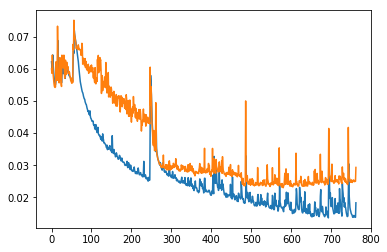

여----------------그-ᅩᅮ은 ᄋ이ᄀ곳에-서-------  ᄌ자ᅡ--미ᅵ,,----   ᄇ베-ᄇ바--,-   기ᅵ-으ᅵ 드ᅳ-----  다-량안 존ᄃ듸  꼿들ᆯᅳᆯ  보-시 수 있ᄉ습ᆸᆸ-----------니다.<eos><eos><eos><eos><eos><eos><eos><eos><eos>
여그ᅩᅮ은 이곳에서 자미, 베바, 기으ᅵ 드 다량안 존듸 꼿들ᅳᆯ 보시 수 있습니다.<eos>
여러분은 이곳에서 장미, 백합, 튤립 등 다양한 종류의 꽃들을 보실 수 있습니다.<eos>----------


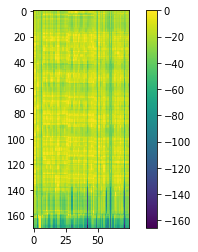

그-------------- ᅧᅧ-성-작다ᅡ는ᆫ---  여서ᅥᆨᄋ  사이자ᅡᄌ지ᅵᅵ으ᅳᆯ 높기ᄂ는 데ᅦ  흐-레  기-여ᄋᄋ-ᄋ와----------------ᆻ다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
그 ᅧ성작다는 여석ᄋ 사이자지을 높기는 데 흐레 기여ᄋ왔다.<eos>
그 여성 작가는 여성의 사회적 지위를 높이는 데 크게 기여해 왔다.<eos>-----------------


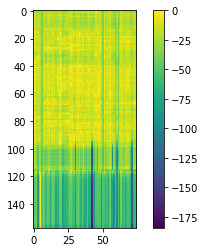

-------------------------------------------------------------------------------------------------------
09-01 16:29:35
Mean Train Loss: 0.03101728510186011
Mean Evaluation Loss: 0.04842313869101169
-------------------------------------------------------------------------------------------------------
09-01 16:29:54
Mean Train Loss: 0.0349895803285832
Mean Evaluation Loss: 0.028670590480279885
-------------------------------------------------------------------------------------------------------
09-01 16:30:14
Mean Train Loss: 0.02062130314094387
Mean Evaluation Loss: 0.02621693344547554
-------------------------------------------------------------------------------------------------------
09-01 16:30:33
Mean Train Loss: 0.017369978686133575
Mean Evaluation Loss: 0.02534429684352334
-------------------------------------------------------------------------------------------------------
09-01 16:30:53
Mean Train Loss: 0.015839823846024507
Mean Evaluation Loss: 0.025304483174242314
-------

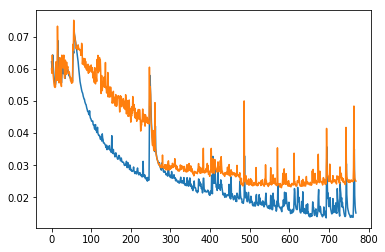

구----------------------ᆨ제ᅦ-연 합의  공식 언먹는ᆫ-----  ᄋ아-락ᄋ어.,------   ᄌᄌᆼᆼᄇ보-어--,-----  ᄋ영ᆼ어ᅥ,-----   -불어ᅥ-,------  -러ᅥ-시-어ᅥᅥᅥ,----  스-페ᄋ인어-----------이다.<eos>
국제연 합의 공식 언먹는 아락어., ᄌᆼ보어, 영어, 불어, 러시어, 스페인어이다.<eos>
국제연합의 공식 언어는 아랍어, 중국어, 영어, 불어, 러시아어, 스페인어이다.<eos>-----------------


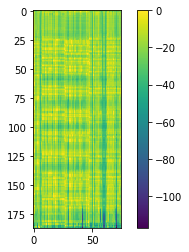

요----------즘ᆷ에ᄂ는ᆫᆫ--  표-존 어-아 사-츱리ᄋᄋ  겅ᆼ계-가ᅡ-  ᅮᅮᆼ형하ᅡ  자ᄂ이  ᅧᅮ윽을 마ᅡᆭᆭ---------------아요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
요즘에는 표존 어아 사츱리ᄋ 겅계가 ᅮᆼ형하 자ᄂ이 ᅧᅮ윽을 많아요.<eos>
요즘에는 표준어와 사투리의 경계가 분명하지 않은 경우가 많아요.<eos>-----------------


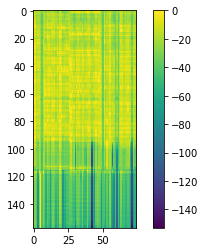

-------------------------------------------------------------------------------------------------------
09-01 16:31:33
Mean Train Loss: 0.014403685548862462
Mean Evaluation Loss: 0.024707096785070014
-------------------------------------------------------------------------------------------------------
09-01 16:31:53
Mean Train Loss: 0.014139687560486319
Mean Evaluation Loss: 0.0246748863292837
-------------------------------------------------------------------------------------------------------
09-01 16:32:12
Mean Train Loss: 0.013712041162700339
Mean Evaluation Loss: 0.024594335332527105
-------------------------------------------------------------------------------------------------------
09-01 16:32:32
Mean Train Loss: 0.013621019399917791
Mean Evaluation Loss: 0.025086820537954566
-------------------------------------------------------------------------------------------------------
09-01 16:32:52
Mean Train Loss: 0.01351652152180392
Mean Evaluation Loss: 0.024617874367342946
---

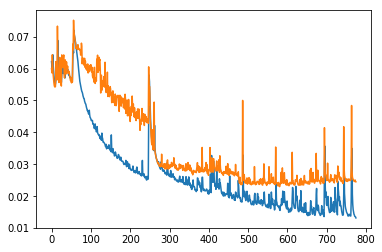

우---------------------리ᅵᄂ느--ᆫᆫ----  글뇨ᅭ을 요ᄒ후ᄋ에-떠-나----- ᄋ일ᄅ리ᄋ 저-영게 엘들어   ᅵ 있을 거가 스ᅢᆼ각해-ᆻᆻᆻᆻ------------ᄋ어요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
우리는 글뇨을 요후에떠나 일리ᄋ 저영게 엘들어 ᅵ 있을 거가 스ᅢᆼ각했어요.<eos>
우리는 금요일 오후에 떠나 일요일 저녁에 돌아올 수 있을 거라 생각했어요.<eos>--------------------


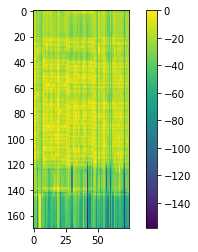

이--------------ᆫ날에-느ᅳᆫ----  하-스-드ᄅᄋ  송-발타ᅡᆨ을ᆯ 자ᅡᅡᄅᄅᆸᄃ떼이ᄂ는 서은ᆼᅵᅵᆫ들이 있었ᆻᆻᆻᆻ----------어ᅥ요..<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
인날에는 하스드ᄅᄋ 송발탁을 자ᄅᆸᄃ떼이는 서은ᆼᅵᆫ들이 있었어요.<eos>
옛날에는 학생들의 손바닥을 자로 때리는 선생님들이 있었어요.<eos>--------------


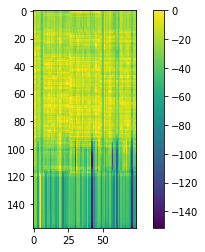

-------------------------------------------------------------------------------------------------------
09-01 16:33:32
Mean Train Loss: 0.013171825602753191
Mean Evaluation Loss: 0.024517399176597128
-------------------------------------------------------------------------------------------------------
09-01 16:33:52
Mean Train Loss: 0.012922647076479119
Mean Evaluation Loss: 0.025085217031215842
-------------------------------------------------------------------------------------------------------
09-01 16:34:11
Mean Train Loss: 0.013548181077157929
Mean Evaluation Loss: 0.02502779038245982
-------------------------------------------------------------------------------------------------------
09-01 16:34:31
Mean Train Loss: 0.01293343543996356
Mean Evaluation Loss: 0.024742266048410164
-------------------------------------------------------------------------------------------------------
09-01 16:34:52
Mean Train Loss: 0.012947265638134652
Mean Evaluation Loss: 0.024889111031961675
--

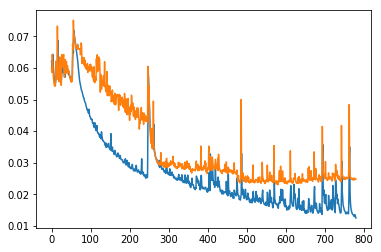

저----------------의  매-장에  모-뜬 푼-목ᄋ이---  이-ᄇ번-주ᄋ에 체ᅬ-고----   삼십 퍼세ᅦ-ᄐ트ᄁ까ᄌ지ᅵᅵ  하-린 파-매-를 하--ᆸᆸᆸ--------ᄂ니다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
저의 매장에 모뜬 푼목이 이번주에 체ᅬ고 삼십 퍼세트까지 하린 파매를 합니다.<eos>
저희 매장의 모든 품목이 이번 주에 최고 삼십 퍼센트까지 할인 판매를 합니다.<eos>-----------------


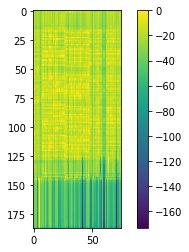

이-----------------칙운ᄋᆫᆫ 오는 길에ᄉ서  굼며-다를 해-틀 한-디ᅵ---  구-가-잘 영웅이 ᄃᄃ-ᄋ어--------------ᆻ다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
이칙운ᄋᆫ 오는 길에서 굼며다를 해틀 한디 구가잘 영웅이 ᄃ었다.<eos>
이승훈은 올림픽에서 금메달을 획득한 뒤 국가적 영웅이 되었다.<eos>------------


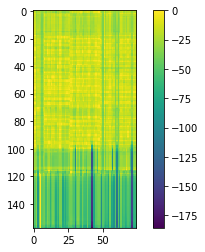

-------------------------------------------------------------------------------------------------------
09-01 16:35:32
Mean Train Loss: 0.012773255856414282
Mean Evaluation Loss: 0.024916567093819408
-------------------------------------------------------------------------------------------------------
09-01 16:35:51
Mean Train Loss: 0.012665174060727905
Mean Evaluation Loss: 0.02465935406819686
-------------------------------------------------------------------------------------------------------
09-01 16:36:11
Mean Train Loss: 0.012570024195018252
Mean Evaluation Loss: 0.024726538035951928
-------------------------------------------------------------------------------------------------------
09-01 16:36:31
Mean Train Loss: 0.01271734076491882
Mean Evaluation Loss: 0.025467052889482367
-------------------------------------------------------------------------------------------------------
09-01 16:36:51
Mean Train Loss: 0.01294436409566783
Mean Evaluation Loss: 0.024896390809080095
---

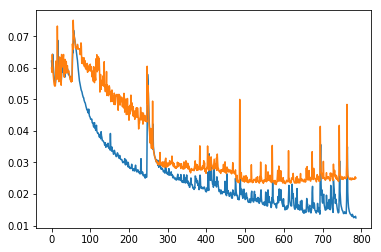

시--------------------ᆷ-사-ᄉ숙곡 끝-에------ ᄀ귀-ᅧᆯ를 산발하진않기롤 결정ᄒᄒᆻᆻᅳᆷ을 알며ᄅᄅ리ᄀ게 디어  ᄋ유-감이ᅵ--ᆸᆸᆸᆸ--------------니다ᅡ..<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
심사숙곡 끝에 귀ᅧᆯ를 산발하진않기롤 결정ᄒᆻᅳᆷ을 알며리게 디어 유감입니다.<eos>
심사숙고 끝에 귀하를 선발하지 않기로 결정했음을 알려드리게 되어 유감입니다.<eos>--------------


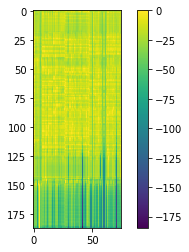

죄----------------송하ᅡ-지-만ᆫᆫ---  서-잰ᄂ이-의 ᄀ게뢱ᄋ은--  시-름 가-늤 사이 없느 것 갔스ᅳᅳᅳᆸᆸᆸ---------------ᄂ니ᅵ다..<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
죄송하지만 서잰ᄂ이의 게뢱은 시름 가늤 사이 없느 것 갔습니다.<eos>
죄송하지만, 선생님의 계획은 실현 가능성이 없는 것 같습니다.<eos>--------------


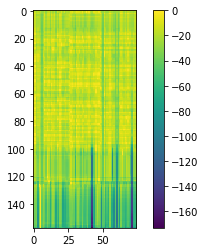

-------------------------------------------------------------------------------------------------------
09-01 16:37:31
Mean Train Loss: 0.012137683729471401
Mean Evaluation Loss: 0.02523026794603824
-------------------------------------------------------------------------------------------------------
09-01 16:37:50
Mean Train Loss: 0.01240309281723327
Mean Evaluation Loss: 0.02597819616211266
-------------------------------------------------------------------------------------------------------
09-01 16:38:10
Mean Train Loss: 0.012672623964271794
Mean Evaluation Loss: 0.0255529029906596
-------------------------------------------------------------------------------------------------------
09-01 16:38:30
Mean Train Loss: 0.012032994479892124
Mean Evaluation Loss: 0.024672281017698323
-------------------------------------------------------------------------------------------------------
09-01 16:38:49
Mean Train Loss: 0.012725059237592588
Mean Evaluation Loss: 0.025370522544935974
-----

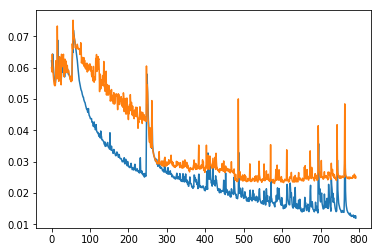

기----------중 푼이ᅵ 계수 드ᅳᆯ어ᅥᄆ멘-서-----  우-린는ᄌ저ᄌ잔궁다ᅡ 이 ᅮ주ᅮᆨ그ᄃ다느ᅳᆫᄉ사실을 깨-달아-ᆻᆻᆻ------------------어요..<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
기중 푼이 계수 들어멘서 우린는저잔궁다 이 ᅮ죽그다는사실을 깨달았어요.<eos>
기증품이 계속 들어오면서 우리는 저장 공간이 부족하다는 사실을 깨달았어요.<eos>----------------


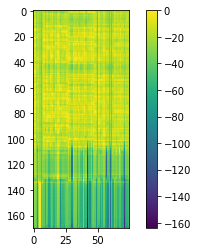

하-----------------ᆫᆫ국ᄋ에 보ᄆ무들ᆯ은ᆫ--  ᄌ자신-들ᄋ에ᄀ게 너-무ᄆ만는 ᅥᅥ설웋가가ᅡ네 것 가-ᇀᇀᇀ-----------아요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
한국에 보무들은 자신들에게 너무만는 ᅥ설웋가가네 것 같아요.<eos>
한국의 부모들은 자식들에게 너무 많은 것을 요구하는 것 같아요.<eos>---------------


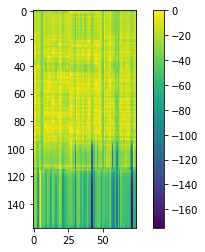

-------------------------------------------------------------------------------------------------------
09-01 16:39:30
Mean Train Loss: 0.01153993958021421
Mean Evaluation Loss: 0.024756855519071596
-------------------------------------------------------------------------------------------------------
09-01 16:39:49
Mean Train Loss: 0.013033869657725405
Mean Evaluation Loss: 0.027081592706438003
-------------------------------------------------------------------------------------------------------
09-01 16:40:10
Mean Train Loss: 0.013024943224650896
Mean Evaluation Loss: 0.02512626588060431
-------------------------------------------------------------------------------------------------------
09-01 16:40:29
Mean Train Loss: 0.01285313290184137
Mean Evaluation Loss: 0.026621816180303976
-------------------------------------------------------------------------------------------------------
09-01 16:40:49
Mean Train Loss: 0.013374342228864128
Mean Evaluation Loss: 0.0253970926647821
-----

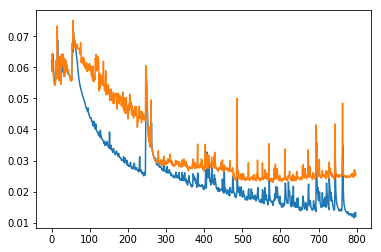

자-------------------ᆼᆼ기-를 지-내야 한 다ᄂ는  버-이 있지-는 암-가-.----  장-의-는 단-지------  고-ᄑ편ᆫ-적인  ᄌ적벼ᅧᆯ의 ᄉ식----------이ᄃ다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
장기를 지내야 한 다는 버이 있지는 암가. 장의는 단지 고편적인 적별의 식이다.<eos>
장례를 지내야 한다는 법이 있지는 않다. 장례는 단지 보편적인 작별 의식이다.<eos>-------------


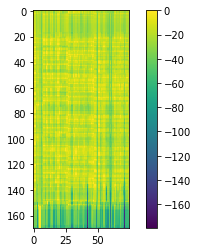

이--------------------친운ᄋᆫᆫ 오는 귤에ᄉ서  구-매-다를 때-드- 한-딘---  구-게-잘 영웅이 ᄃᄃ-ᄋ어--------------ᆻ다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
이친운ᄋᆫ 오는 귤에서 구매다를 때드 한딘 구게잘 영웅이 ᄃ었다.<eos>
이승훈은 올림픽에서 금메달을 획득한 뒤 국가적 영웅이 되었다.<eos>------------


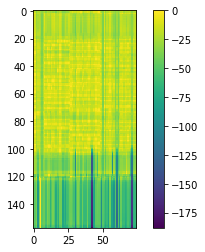

-------------------------------------------------------------------------------------------------------
09-01 16:41:29
Mean Train Loss: 0.012429226350936363
Mean Evaluation Loss: 0.025588866336749477
-------------------------------------------------------------------------------------------------------
09-01 16:41:50
Mean Train Loss: 0.012198976321946341
Mean Evaluation Loss: 0.025579761852761822
-------------------------------------------------------------------------------------------------------
09-01 16:42:09
Mean Train Loss: 0.012227583733528832
Mean Evaluation Loss: 0.02508836411430432
-------------------------------------------------------------------------------------------------------
09-01 16:42:29
Mean Train Loss: 0.011712187824225458
Mean Evaluation Loss: 0.02505057648144373
-------------------------------------------------------------------------------------------------------
09-01 16:42:49
Mean Train Loss: 0.014068226040930998
Mean Evaluation Loss: 0.026664559170675
-----

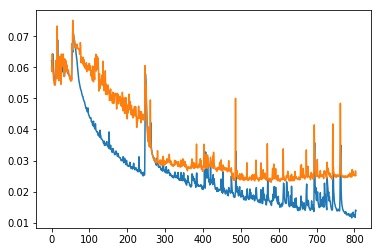

시---------------------ᆫ-사-숙 국 구--엔-----  귀-하를 산발하자 않기로 ᄀ결정했음을 알래드리게 되-어  유ᅲ-감이ᅵ--ᆸᆸᆸ-------------ᄂ니다..<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
신사숙 국 구엔 귀하를 산발하자 않기로 결정했음을 알래드리게 되어 유감입니다.<eos>
심사숙고 끝에 귀하를 선발하지 않기로 결정했음을 알려드리게 되어 유감입니다.<eos>--------------


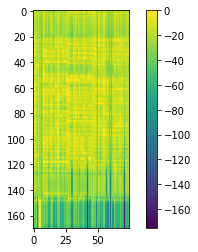

이-------------ᆫ-날에-는ᆫ---   하-생드ᄅᄋ  손-가ᅡ-닥르ᅳᆯ ᄌ자ᅡ럽ᄃ때이ᄂ는 서싱인 들이 있었ᆻᆻᆻ------------어요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
인날에는 하생드ᄅᄋ 손가닥를 자럽ᄃ때이는 서싱인 들이 있었어요.<eos>
옛날에는 학생들의 손바닥을 자로 때리는 선생님들이 있었어요.<eos>--------------


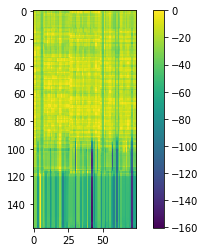

-------------------------------------------------------------------------------------------------------
09-01 16:43:29
Mean Train Loss: 0.013616597847558873
Mean Evaluation Loss: 0.02527183754221313
-------------------------------------------------------------------------------------------------------
09-01 16:43:48
Mean Train Loss: 0.012434392579671332
Mean Evaluation Loss: 0.025039999510389446
-------------------------------------------------------------------------------------------------------
09-01 16:44:08
Mean Train Loss: 0.014672877163786634
Mean Evaluation Loss: 0.0259389509084904
-------------------------------------------------------------------------------------------------------
09-01 16:44:28
Mean Train Loss: 0.013265017178708982
Mean Evaluation Loss: 0.025535736980761274
-------------------------------------------------------------------------------------------------------
09-01 16:44:48
Mean Train Loss: 0.013144792706212532
Mean Evaluation Loss: 0.026377098348112357
---

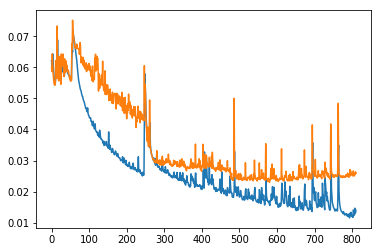

저------------------는 나ᅡ-질 않ᆭ이  가ᄅ려ᄉ서-----  새ᄅ므ᅳᆫ 사람ᄃ들ᄋ에ᄀ게  ᄆ마ᅡᅳᅳ을 여-는 데----- 마ᅡᆭᅳᅳᆫ 시ᄀ간이 거ᅥᆯ-------------려요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
저는 나질 않이 가려서 새ᄅ믄 사람들에게 마ᅳ을 여는 데 많ᅳᆫ 시간이 걸려요.<eos>
저는 낯을 많이 가려서 새로운 사람들에게 마음을 여는 데 많은 시간이 걸려요.<eos>----------------


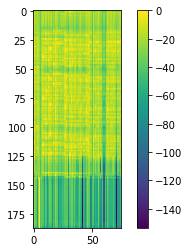

저------------느ᅳ  음식에ᅳ- 젛ᆨ가-라ᄋ으ᄅ ᄌ지범오-는 것보-다----  퍽그ᅳᆯᆫᅵ ᅵᅵᆼ익게 ᄑ판--------------해요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
저느 음식에ᅳ 젛ᆨ가라으ᄅ 지범오는 것보다 퍽글ᆫᅵ ᅵᆼ익게 판해요.<eos>
저는 음식을 젓가락으로 집어 먹는 것보다 포크로 찍는 게 편해요.<eos>--------------


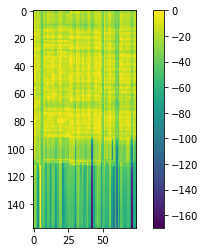

-------------------------------------------------------------------------------------------------------
09-01 16:45:29
Mean Train Loss: 0.01320507562490136
Mean Evaluation Loss: 0.025920999507139723
-------------------------------------------------------------------------------------------------------
09-01 16:45:48
Mean Train Loss: 0.012772370061606628
Mean Evaluation Loss: 0.025657211625283886
-------------------------------------------------------------------------------------------------------
09-01 16:46:08
Mean Train Loss: 0.012445155126114141
Mean Evaluation Loss: 0.025086491239986984
-------------------------------------------------------------------------------------------------------
09-01 16:46:27
Mean Train Loss: 0.011757335630401105
Mean Evaluation Loss: 0.024973631541176537
-------------------------------------------------------------------------------------------------------
09-01 16:46:47
Mean Train Loss: 0.011581802982550675
Mean Evaluation Loss: 0.024980532503678238
-

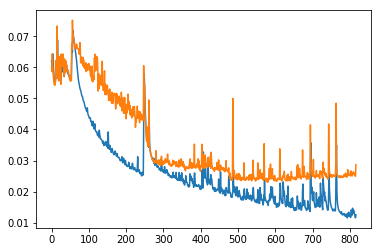

우-----------------리ᅵ-느ᅳ-ᆫ------  구ᅳᆷᅭᅭ읠 모호-에ᅦᄄ따ᄂ나---- 이ᅵᆯᆯ여을저ᅥ녀ᅧ벼ᅦ앨드ᅩ로ᅥ 우 ᅵᅵᆻ을 ᅥᅥ라 새ᅢᆼ각해ᅢᆻᆻᆻ----------------어요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
우리는 구ᅳᆷᅭ읠 모호에따나 일여을저녀벼ᅦ앨드ᅩ로ᅥ 우 ᅵᆻ을 ᅥ라 생각했어요.<eos>
우리는 금요일 오후에 떠나 일요일 저녁에 돌아올 수 있을 거라 생각했어요.<eos>--------------------


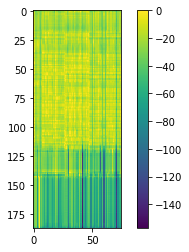

이------------------ 쇤믄ᄋᆫ 온는기 외ᅢ서ᅥᅥ 군매-다를해ᅢᄃ트-하ᅡᆫᆫᅳᅵ---   ᅮᅮ-ᅡᅡ-자  영웅이ᅵ되ᅬᄋ어---------------ᆻᆻ다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
이 쇤믄ᄋᆫ 온는기 외ᅢ서 군매다를해ᄃ트한ᅳᅵ ᅮᅡ자 영웅이되었다.<eos>
이승훈은 올림픽에서 금메달을 획득한 뒤 국가적 영웅이 되었다.<eos>------------


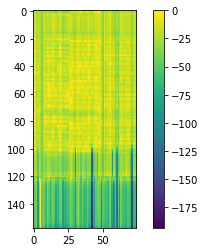

-------------------------------------------------------------------------------------------------------
09-01 16:47:27
Mean Train Loss: 0.013349197813109287
Mean Evaluation Loss: 0.02542540137995921
-------------------------------------------------------------------------------------------------------
09-01 16:47:47
Mean Train Loss: 0.011226614287779968
Mean Evaluation Loss: 0.0248034934385513
-------------------------------------------------------------------------------------------------------
09-01 16:48:07
Mean Train Loss: 0.010957795889307235
Mean Evaluation Loss: 0.03066008123144332
-------------------------------------------------------------------------------------------------------
09-01 16:48:26
Mean Train Loss: 0.019230951166021235
Mean Evaluation Loss: 0.026725686905625268
-------------------------------------------------------------------------------------------------------
09-01 16:48:46
Mean Train Loss: 0.013672426308063956
Mean Evaluation Loss: 0.026222248157158203
----

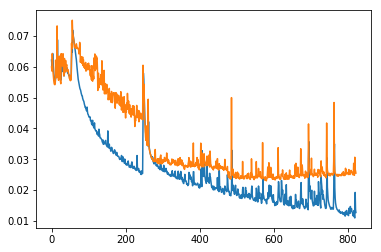

그 ---------------버-은 홀륭한 학짜인 건 봉며ᅧᆼᄒ하지ᄆ만ᆫᆫ,---- 저ᅥ는 개-인-적으로-   ᅮᅮᆫ르ᅳᆯ 좋아하ᄌ지 않ᆭ----------------아요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
그 버은 홀륭한 학짜인 건 봉명하지만, 저는 개인적으로 ᅮᆫ를 좋아하지 않아요.<eos>
그분은 훌륭한 학자인 건 분명하지만, 저는 개인적으로 그분을 좋아하지 않아요.<eos>-----------


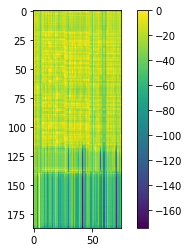

저-----------------는 그-사--람이-----  나-이ᅧᅥᄋ의  며ᄌ잔들ᆯ 뎌ᅡᅡ는 태-도-가--   마ᅡᆫ으  안 들------------------어요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
저는 그사람이 나이ᅧᅥ의 며잔들 뎌ᅡ는 태도가 만으 안 들어요.<eos>
저는 그 사람이 나이 어린 여자들을 대하는 태도가 마음에 안 들어요.<eos>---------------


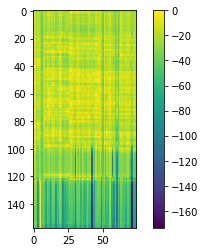

-------------------------------------------------------------------------------------------------------
09-01 16:49:26
Mean Train Loss: 0.012019385365486433
Mean Evaluation Loss: 0.025868669145678112
-------------------------------------------------------------------------------------------------------
09-01 16:49:45
Mean Train Loss: 0.012126732969267121
Mean Evaluation Loss: 0.025667220228701996
-------------------------------------------------------------------------------------------------------
09-01 16:50:05
Mean Train Loss: 0.0116009661675123
Mean Evaluation Loss: 0.025916878969216278
-------------------------------------------------------------------------------------------------------
09-01 16:50:24
Mean Train Loss: 0.012839514311385278
Mean Evaluation Loss: 0.02577002065345519
-------------------------------------------------------------------------------------------------------
09-01 16:50:45
Mean Train Loss: 0.013022737256772594
Mean Evaluation Loss: 0.02549295592930802
----

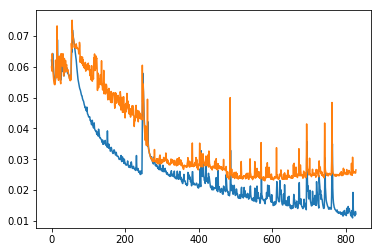

여----------------른불은 이-무-에-서ᅥ-----   자ᅡᅡᆼ-이ᅵ-,----  -백--겁---   튱-립-등-----  다ᅡᅣᆼ란 종유ᅵᅵ 꼰ᄐ트ᄅ을 보-시  수 있스ᅳᆸᆸᆸ---------ᄂ니다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
여른불은 이무에서 장이, 백겁 튱립등 다ᅣᆼ란 종유ᅵ 꼰트ᄅ을 보시 수 있습니다.<eos>
여러분은 이곳에서 장미, 백합, 튤립 등 다양한 종류의 꽃들을 보실 수 있습니다.<eos>----------


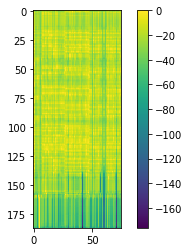

저-----------------는 그-사-람이----  나ᅡ이ᅵ얼이 ᄆ며ᄌ자드ᅳᆯᆯ  벼-는  패도-과--  ᄆ마음   안 들----------------어요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
저는 그사람이 나이얼이 며자들 벼는 패도과 마음 안 들어요.<eos>
저는 그 사람이 나이 어린 여자들을 대하는 태도가 마음에 안 들어요.<eos>---------------


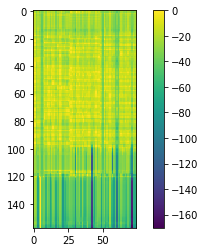

-------------------------------------------------------------------------------------------------------
09-01 16:51:25
Mean Train Loss: 0.012769776337653294
Mean Evaluation Loss: 0.025829954806497475
-------------------------------------------------------------------------------------------------------
09-01 16:51:45
Mean Train Loss: 0.011986004904888648
Mean Evaluation Loss: 0.025227646230549416
-------------------------------------------------------------------------------------------------------
09-01 16:52:04
Mean Train Loss: 0.010892416019538076
Mean Evaluation Loss: 0.02481163659066073
-------------------------------------------------------------------------------------------------------
09-01 16:52:25
Mean Train Loss: 0.010782057349927323
Mean Evaluation Loss: 0.025069654205222808
-------------------------------------------------------------------------------------------------------
09-01 16:52:44
Mean Train Loss: 0.011481498021956294
Mean Evaluation Loss: 0.025371915954172968
-

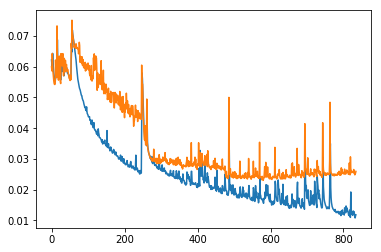

자-------------------ᆼ-례-을 지-내야ᅣ한-다ᄂ는  벼-이 있지-는 않-다-.---  ᄌ장-례-는  ᅡᅡᆫ-지-----  보ᅩ--ᅧᅧᆫ-적인  자ᅡᆨ벼ᅧ 늘-식---------이다..<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
장례을 지내야한다는 벼이 있지는 않다. 장례는 ᅡᆫ지 보ᅧᆫ적인 작벼 늘식이다.<eos>
장례를 지내야 한다는 법이 있지는 않다. 장례는 단지 보편적인 작별 의식이다.<eos>-------------


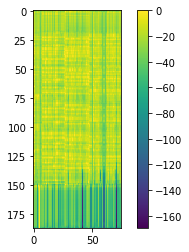

그 --------------사ᅡ람ᆷ학오  싶응이 사-난 이-ᄀᄀ-한-다ᄂ는-게----------  나-우--소-는 영거 힌 ᅧᅧᆼ일이 ᄋ아------------------ᄂ녀요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
그 사람학오 싶응이 사난 이ᄀ한다는게 나우소는 영거 힌 ᅧᆼ일이 아녀요.<eos>
그 사람하고 십 분 이상 간 얘기한다는 게 나로서는 여간 힘든 일이 아냐.<eos>--------


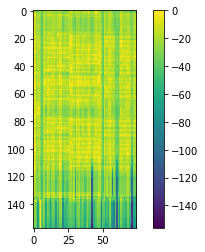

-------------------------------------------------------------------------------------------------------
09-01 16:53:24
Mean Train Loss: 0.01154375893163246
Mean Evaluation Loss: 0.02514805450425129
-------------------------------------------------------------------------------------------------------
09-01 16:53:44
Mean Train Loss: 0.010688431739001004
Mean Evaluation Loss: 0.025372526675411424
-------------------------------------------------------------------------------------------------------
09-01 16:54:03
Mean Train Loss: 0.010466859267296982
Mean Evaluation Loss: 0.025034018419671105
-------------------------------------------------------------------------------------------------------
09-01 16:54:23
Mean Train Loss: 0.010524619186595887
Mean Evaluation Loss: 0.024995042804573753
-------------------------------------------------------------------------------------------------------
09-01 16:54:42
Mean Train Loss: 0.010096699962242073
Mean Evaluation Loss: 0.025188134032920646
--

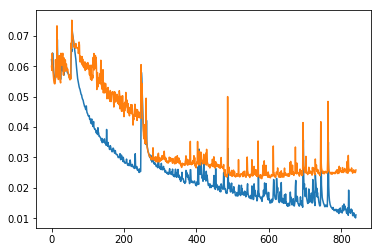

많-------------------은 경-구---- ᄎ추-리 ᄉ소-선에-서ᅥ----  개ᅢᄀ경ᆼ이ᄂ난 지인ᄀᄀᆼ의  직억은ᆫ----  군-성에 있ᆻ어ᅥ  중요ᄒᄒ  녀-ᄉ소------------------다..<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
많은 경구 추리 소선에서 개경이난 지인ᄀᆼ의 직억은 군성에 있어 중요ᄒ 녀소다.<eos>
많은 경우 추리 소설에서 배경이나 주인공의 직업은 구성에 있어 중요한 요소다.<eos>---------------


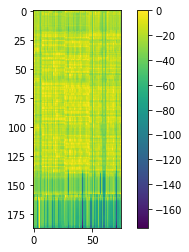

우-------------------리 가-개 여-엤는 개-분군에  산돈들으---  여--엽을 섯에 히 연건 들리--ᆸᆸᆸ--------------니다..<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
우리 가개 여엤는 개분군에 산돈들으 여엽을 섯에 히 연건 들립니다.<eos>
우리 가게에 있는 대부분의 상품들이 유럽에서 수입해 온 것들입니다.<eos>------------


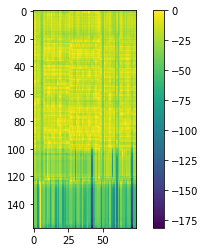

-------------------------------------------------------------------------------------------------------
09-01 16:55:22
Mean Train Loss: 0.011241061026322871
Mean Evaluation Loss: 0.025419033631836858
-------------------------------------------------------------------------------------------------------
09-01 16:55:42
Mean Train Loss: 0.010024003228247562
Mean Evaluation Loss: 0.02599564758648469
-------------------------------------------------------------------------------------------------------
09-01 16:56:02
Mean Train Loss: 0.010651206983563307
Mean Evaluation Loss: 0.025415520131580386
-------------------------------------------------------------------------------------------------------
09-01 16:56:22
Mean Train Loss: 0.01052710052398834
Mean Evaluation Loss: 0.025239256248918224
-------------------------------------------------------------------------------------------------------
09-01 16:56:41
Mean Train Loss: 0.01068086774018367
Mean Evaluation Loss: 0.02567832588136066
----

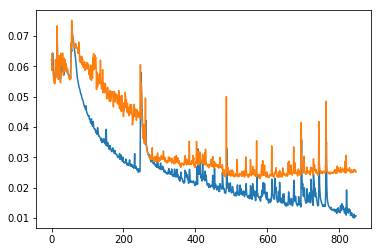

오------------------는 이ᄅ렇게  ᄒᆫ-군와에  봔햔 초정ᆼ가-연을 할 술 있게 되--ᄋ-  겅ᆼ겅스ᅳ러-기ᅦᅦ 생각ᄒ하----ᆸ------니다ᅡ.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
오는 이렇게 ᄒᆫ군와에 봔햔 초정가연을 할 술 있게 되ᄋ 겅겅스러기ᅦ 생각합니다.<eos>
오늘 이렇게 한국어에 관한 초청 강연을 할 수 있게 되어 영광스럽게 생각합니다.<eos>----------


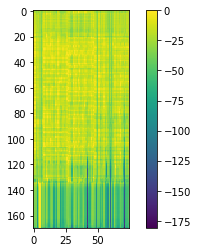

저--------------는ᆫ 앰직으ᅳᆯ 적ᄀ갈ᅥᄅ으로  집버 모는  거-보-다---  퍽그ᄅᆯᆫ 지-는 게  탄-----------해요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
저는 앰직을 적갈ᅥᄅ으로 집버 모는 거보다 퍽그ᄅᆯᆫ 지는 게 탄해요.<eos>
저는 음식을 젓가락으로 집어 먹는 것보다 포크로 찍는 게 편해요.<eos>--------------


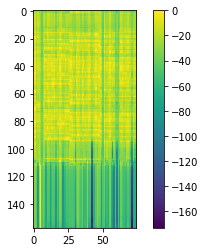

-------------------------------------------------------------------------------------------------------
09-01 16:57:22
Mean Train Loss: 0.014686554154428972
Mean Evaluation Loss: 0.027331580342800636
-------------------------------------------------------------------------------------------------------
09-01 16:57:42
Mean Train Loss: 0.014254668427490272
Mean Evaluation Loss: 0.02642882972340546
-------------------------------------------------------------------------------------------------------
09-01 16:58:02
Mean Train Loss: 0.011678398870531773
Mean Evaluation Loss: 0.025463791053936664
-------------------------------------------------------------------------------------------------------
09-01 16:58:21
Mean Train Loss: 0.011829977925632324
Mean Evaluation Loss: 0.025549407084498318
-------------------------------------------------------------------------------------------------------
09-01 16:58:41
Mean Train Loss: 0.011761100927011544
Mean Evaluation Loss: 0.0259884373497726
---

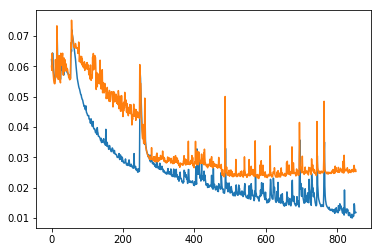

저------------------ᄂ는 낱을  많이  가-려-서ᅥ--   사ᄅ로은 사람들 에-기--  마ᅡᆷ-을 여-는 데----   많은 시간ᆫ이 걸---------------려요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
저는 낱을 많이 가려서 사로은 사람들 에기 맘을 여는 데 많은 시간이 걸려요.<eos>
저는 낯을 많이 가려서 새로운 사람들에게 마음을 여는 데 많은 시간이 걸려요.<eos>----------------


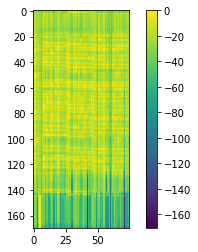

요---------------ᆷ수 스ᄅ를 해 끼 대ᄆ믄에-  때-안으로모  더ᄂ는을 부 ᅮᅯ할뤄ᄀ고-  첨ᆷ검 럴 스-어-ᆻᆻ-------------어요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
욤수 스를 해 끼 대믄에 때안으로모 더는을 부 ᅮᅯ할뤄고 첨검 럴 스었어요.<eos>
눈 수술을 했기 때문에 태양으로부터 눈을 보호하려고 선글라스를 써요.<eos>-----------


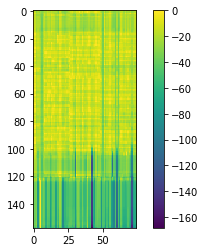

-------------------------------------------------------------------------------------------------------
09-01 16:59:21
Mean Train Loss: 0.014534180987888015
Mean Evaluation Loss: 0.027203439419629476
-------------------------------------------------------------------------------------------------------
09-01 16:59:40
Mean Train Loss: 0.012619535144635118
Mean Evaluation Loss: 0.02545809957826389
-------------------------------------------------------------------------------------------------------
09-01 17:00:00
Mean Train Loss: 0.010954254016720887
Mean Evaluation Loss: 0.025172963941816145
-------------------------------------------------------------------------------------------------------
09-01 17:00:20
Mean Train Loss: 0.010608895881465064
Mean Evaluation Loss: 0.025877234184842564
-------------------------------------------------------------------------------------------------------
09-01 17:00:39
Mean Train Loss: 0.010575908805561448
Mean Evaluation Loss: 0.02564345913444277
--

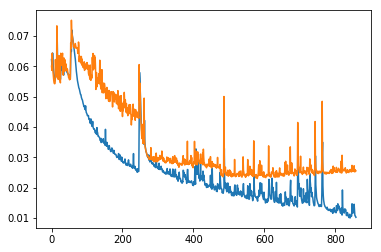

시--------------------ᆫ-차-ᄉ숙국웉ᇀ에-------  귀-ᅡ-를 선발하지 않ᅵᅵ르  결청횠슴을 알려ᅥ디ᄀ게 되어어  유-감이ᅵ--ᆸᆸᆸᆸ-------------ᄂ니다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
신차숙국웉에 귀ᅡ를 선발하지 않ᅵ르 결청횠슴을 알려ᅥ디게 되어어 유감입니다.<eos>
심사숙고 끝에 귀하를 선발하지 않기로 결정했음을 알려드리게 되어 유감입니다.<eos>--------------


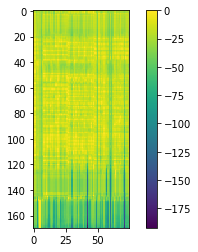

이------------------날ᆯ에ᄂ는ᆫ---  하-사그ᅳ레  손-바- 다-글ᆯ  자-롷대 이ᄂ는 선ᅵᆫᆼ인들이 있었ᆻᆻᆻᆻ-------------어요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
이날에는 하사그레 손바 다글 자롷대 이는 선ᅵᆫᆼ인들이 있었어요.<eos>
옛날에는 학생들의 손바닥을 자로 때리는 선생님들이 있었어요.<eos>--------------


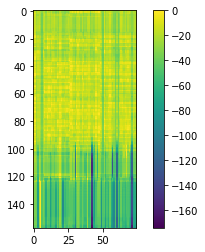

-------------------------------------------------------------------------------------------------------
09-01 17:01:20
Mean Train Loss: 0.010718985146986902
Mean Evaluation Loss: 0.026679561502687688
-------------------------------------------------------------------------------------------------------
09-01 17:01:39
Mean Train Loss: 0.011718069114646434
Mean Evaluation Loss: 0.025863741951490892
-------------------------------------------------------------------------------------------------------
09-01 17:01:59
Mean Train Loss: 0.010200612929741977
Mean Evaluation Loss: 0.025873480752787767
-------------------------------------------------------------------------------------------------------
09-01 17:02:19
Mean Train Loss: 0.010705446428591663
Mean Evaluation Loss: 0.03077588520593885
-------------------------------------------------------------------------------------------------------
09-01 17:02:38
Mean Train Loss: 0.03177992472882504
Mean Evaluation Loss: 0.027966463163256634
--

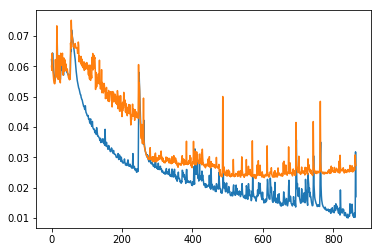

제-------------가ᅡ 봏으-트라ᅡ엔 주연을 따랬다는 얘기ᅵᅳᅳ 들렀으  때ᅢ---------  저는  정마---ᆯ-  믿기ᄌ지기 않아--ᆻᆻ---------------ᄋ어요..<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
제가 봏으트라엔 주연을 따랬다는 얘기ᅳ 들렀으 때 저는 정말 믿기지기 않았어요.<eos>
제가 그 오페라의 주연을 따냈다는 얘기를 들었을 때 저는 정말 믿기지가 않았어요.<eos>------------


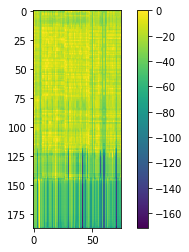

우----------------------릐  장ᄆ마느ᅳᆫ  이-얼 종ᄉ시의  시작-해-서----  신를 추힐 끈한 거ᄉ을올 이-상-드--ᆸᆸᆸ-------------ᄂ니다..<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
우릐 장마는 이얼 종시의 시작해서 신를 추힐 끈한 거ᄉ을올 이상듭니다.<eos>
올해 장마는 유월 중순에 시작해서 칠 월 초에 끝날 것으로 예상됩니다.<eos>--------


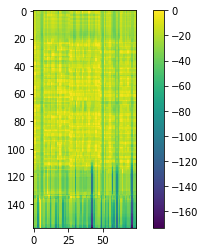

-------------------------------------------------------------------------------------------------------
09-01 17:03:19
Mean Train Loss: 0.014568334349595065
Mean Evaluation Loss: 0.026400642256200403
-------------------------------------------------------------------------------------------------------
09-01 17:03:39
Mean Train Loss: 0.014046345256184119
Mean Evaluation Loss: 0.026146565938161084
-------------------------------------------------------------------------------------------------------
09-01 17:03:58
Mean Train Loss: 0.012865837370671401
Mean Evaluation Loss: 0.026225594396442856
-------------------------------------------------------------------------------------------------------
09-01 17:04:18
Mean Train Loss: 0.011883223177145465
Mean Evaluation Loss: 0.0256455616496661
-------------------------------------------------------------------------------------------------------
09-01 17:04:39
Mean Train Loss: 0.011386591256372997
Mean Evaluation Loss: 0.02572933967724132
---

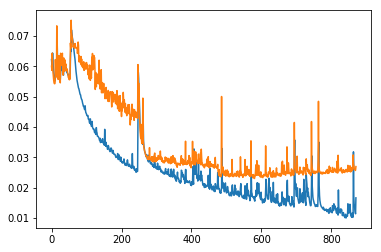

우----------------리-는  청고-개  구-신-원으--  ᅢᅬ사ᅡᄅ르  설밉한 일에----  많은 외ᄀ곡ᄋᆫᆫ들을 지원애 왔스ᅳᆸᆸᆸᆸ-------ᄂ니다..<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
우리는 청고개 구신원으 ᅢᅬ사르 설밉한 일에 많은 외곡ᄋᆫ들을 지원애 왔습니다.<eos>
우리는 십구백구십 년에 회사를 설립한 이래 많은 외국인들을 지원해 왔습니다.<eos>------------


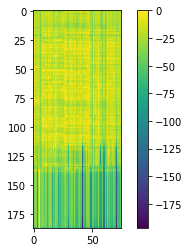

저-----------------는  그-사-람이ᅵ----  나ᄋᄋ연인 면잔드ᅳᆯᆯ 뎌하흔 대-도-가--   마우ᄆᄋ  안 들------------------어요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
저는 그사람이 나연인 면잔들 뎌하흔 대도가 마우ᄆᄋ 안 들어요.<eos>
저는 그 사람이 나이 어린 여자들을 대하는 태도가 마음에 안 들어요.<eos>---------------


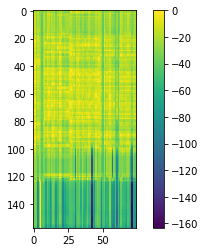

-------------------------------------------------------------------------------------------------------
09-01 17:05:18
Mean Train Loss: 0.013494394833178335
Mean Evaluation Loss: 0.02584940695949576
-------------------------------------------------------------------------------------------------------
09-01 17:05:38
Mean Train Loss: 0.012144866736270462
Mean Evaluation Loss: 0.025853650138240897
-------------------------------------------------------------------------------------------------------
09-01 17:05:58
Mean Train Loss: 0.011666167371075904
Mean Evaluation Loss: 0.026216835702492267
-------------------------------------------------------------------------------------------------------
09-01 17:06:17
Mean Train Loss: 0.012399829808902809
Mean Evaluation Loss: 0.026199785760132637
-------------------------------------------------------------------------------------------------------
09-01 17:06:37
Mean Train Loss: 0.016642684213608833
Mean Evaluation Loss: 0.03206473598661011
--

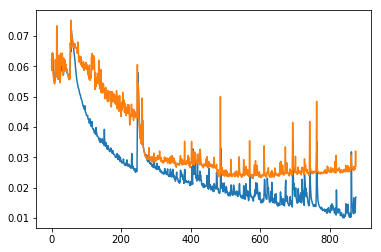

그------------------녀ᄂ는 자신엔 재ᄂ능엘 이ᄅ용해----  녀-의-아   부ᄅ를 축과-는 데ᄂ는-  아-무ᅮ  관심ᄋ이 없ᄋ어----------------ᆻ다..<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
그녀는 자신엔 재능엘 이ᄅ용해 녀의아 부를 축과는 데는 아무 관심이 없었다.<eos>
그녀는 자신의 재능을 이용해 명예와 부를 추구하는 데는 아무 관심이 없었다.<eos>------------------


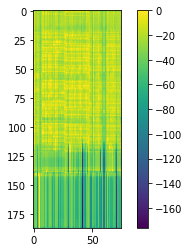

하---------------ᆫ국의  보-모-들은ᆫ--- ᄌ자시ᅵ-들에ᄀ게ᅦ  너ᄆ무 많은 ᅥᅥ일욯ᄀ가ᄂ넨것 같ᇀᇀᇀ---------ᄋ아요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
한국의 보모들은 자시들에게 너무 많은 ᅥ일욯가넨것 같아요.<eos>
한국의 부모들은 자식들에게 너무 많은 것을 요구하는 것 같아요.<eos>---------------


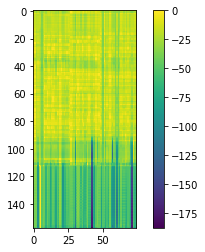

-------------------------------------------------------------------------------------------------------
09-01 17:07:17
Mean Train Loss: 0.013022798335628116
Mean Evaluation Loss: 0.026008218867096207
-------------------------------------------------------------------------------------------------------
09-01 17:07:36
Mean Train Loss: 0.011796324140215792
Mean Evaluation Loss: 0.02583938898375179
-------------------------------------------------------------------------------------------------------
09-01 17:07:56
Mean Train Loss: 0.011698044470021051
Mean Evaluation Loss: 0.025732547921824566
-------------------------------------------------------------------------------------------------------
09-01 17:08:17
Mean Train Loss: 0.011294515210532562
Mean Evaluation Loss: 0.025599676173707713
-------------------------------------------------------------------------------------------------------
09-01 17:08:36
Mean Train Loss: 0.010854222467322042
Mean Evaluation Loss: 0.02631309159053035
--

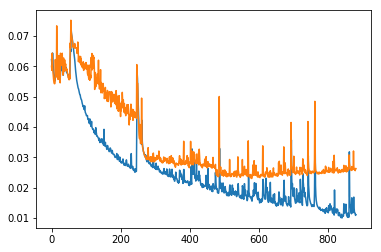

우----------------------리-ᄂ는ᆫᆫ-----  그ᅳᆷ요ᄋ의 오후ᄋ에 ᄃᄃ아나ᅡ---  일ᆯᄋ욜 정뇽ᆨ에 을올ᄋᄋ 수 있을 거라  생각해-ᆻᆻᆻ----------------어요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
우리는 금요의 오후에 ᄃ아나 일욜 정뇽ᆨ에 을올ᄋ 수 있을 거라 생각했어요.<eos>
우리는 금요일 오후에 떠나 일요일 저녁에 돌아올 수 있을 거라 생각했어요.<eos>--------------------


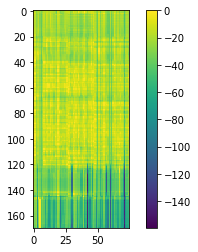

이----------------직운은 노는 극에서ᅥ  금며ᄃ다드- ᅦᅦ-트--간-디----  구-가-잘 영응이 들어ᅥ----------------ᆻ다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
이직운은 노는 극에서 금며다드 ᅦ트간디 구가잘 영응이 들었다.<eos>
이승훈은 올림픽에서 금메달을 획득한 뒤 국가적 영웅이 되었다.<eos>------------


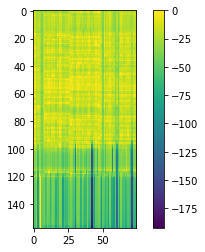

-------------------------------------------------------------------------------------------------------
09-01 17:09:16
Mean Train Loss: 0.010952355309995405
Mean Evaluation Loss: 0.026354446622182722
-------------------------------------------------------------------------------------------------------
09-01 17:09:36
Mean Train Loss: 0.01269213246864193
Mean Evaluation Loss: 0.026180820422969098
-------------------------------------------------------------------------------------------------------
09-01 17:09:57
Mean Train Loss: 0.011604479256372063
Mean Evaluation Loss: 0.025638758978610697
-------------------------------------------------------------------------------------------------------
09-01 17:10:16
Mean Train Loss: 0.010647813463803708
Mean Evaluation Loss: 0.02618837715837428
-------------------------------------------------------------------------------------------------------
09-01 17:10:36
Mean Train Loss: 0.011636452769799977
Mean Evaluation Loss: 0.027247308247363475
--

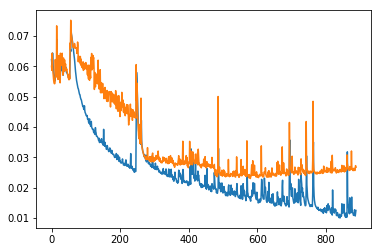

자------------------ᆼ-내ᄅᄋᆯᆯ 지내ᅢ의 한다ᄂ는ᆫ  법이ᄋ있이는-낞ᅡ-다-.---  ᄌ장예-ᄂ는 단ᆫ지ᅵ-,---- ᄇ보-평ᆫ--적인 작ᆨ별  ᅳᅵᄉ십-------------이다..<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
장내ᄅᄋᆯ 지내의 한다는 법이있이는낞ᅡ다. 장예는 단지, 보평ᆫ적인 작별 ᅳᅵ십이다.<eos>
장례를 지내야 한다는 법이 있지는 않다. 장례는 단지 보편적인 작별 의식이다.<eos>-------------


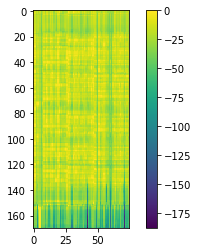

죄----------------송하-ᄌ지-만ᆫᆫ---  서-새-ᄋ이ᄋ에 ᄀ게액 은--  시-음 가-은-사리 없는 걸 같ᄉ습ᆸᆸᆸ----------------ᄂ니다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
죄송하지만 서새이에 게액 은 시음 가은사리 없는 걸 같습니다.<eos>
죄송하지만, 선생님의 계획은 실현 가능성이 없는 것 같습니다.<eos>--------------


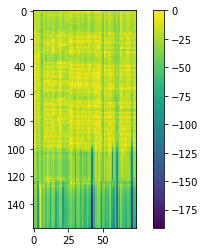

-------------------------------------------------------------------------------------------------------
09-01 17:11:16
Mean Train Loss: 0.011775386672194698
Mean Evaluation Loss: 0.0263624676736885
-------------------------------------------------------------------------------------------------------
09-01 17:11:36
Mean Train Loss: 0.011226208950531712
Mean Evaluation Loss: 0.026369517697460106
-------------------------------------------------------------------------------------------------------
09-01 17:11:55
Mean Train Loss: 0.011664105113165487
Mean Evaluation Loss: 0.028743202078191196
-------------------------------------------------------------------------------------------------------
09-01 17:12:15
Mean Train Loss: 0.013465571082508435
Mean Evaluation Loss: 0.02638978867499438
-------------------------------------------------------------------------------------------------------
09-01 17:12:34
Mean Train Loss: 0.01601625856557747
Mean Evaluation Loss: 0.027314308193857374
----

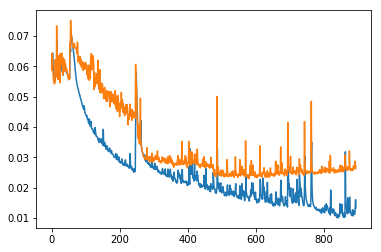

저-----------------는  나-을 ᄆ많이  가-려-서----- -새ᄅ-운 사-람들ᄋ에 게- 마-음을 여-는 데----   많은 시-간이 걸ᆯ--------------려요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
저는 나을 많이 가려서 새ᄅ운 사람들에 게 마음을 여는 데 많은 시간이 걸려요.<eos>
저는 낯을 많이 가려서 새로운 사람들에게 마음을 여는 데 많은 시간이 걸려요.<eos>----------------


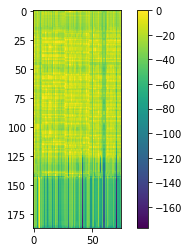

요---------------즘ᆷ에-느ᅳᅳᆫ----  잔기 분몬니ᅵ 일나ᅡ 성행니ᅵᆷ을ᆯ--  종ᆼ굥하ᅡᄌ  아난ᄂ나알 들 마ᅡᆭᆭᆭᆭ--------------------아요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
요즘에는 잔기 분몬니 일나 성행님을 종굥하ᄌ 아난나알 들 많아요.<eos>
요즘에는 자기 부모님이나 선생님을 존경하지 않는 아이들이 많아요.<eos>------------


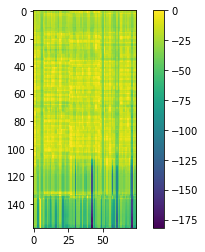

-------------------------------------------------------------------------------------------------------
09-01 17:13:14
Mean Train Loss: 0.011349971363279684
Mean Evaluation Loss: 0.025609719009964643
-------------------------------------------------------------------------------------------------------
09-01 17:13:35
Mean Train Loss: 0.010505877558178289
Mean Evaluation Loss: 0.025340214463632032
-------------------------------------------------------------------------------------------------------
09-01 17:13:55
Mean Train Loss: 0.009944864301590504
Mean Evaluation Loss: 0.025586247703476922
-------------------------------------------------------------------------------------------------------
09-01 17:14:14
Mean Train Loss: 0.010325728753356602
Mean Evaluation Loss: 0.02545898555492123
-------------------------------------------------------------------------------------------------------
09-01 17:14:34
Mean Train Loss: 0.010260755823427023
Mean Evaluation Loss: 0.026171056846980886
-

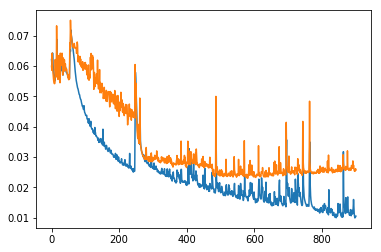

부----------------일거-오 ᄀ고장 났 따ᄂ는 초ᄀ이 신호-는ᆫ--   온-지가 안 나-ᆼᆼ어-라--  나ᅡᆫ방이 안 될 때-이--ᆸᆸ---------------니다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
부일거오 고장 났 따는 초ᄀ이 신호는 온지가 안 낭어라 난방이 안 될 때입니다.<eos>
보일러가 고장 났다는 초기 신호는 온수가 안 나오거나 난방이 안 될 때입니다.<eos>-----------------


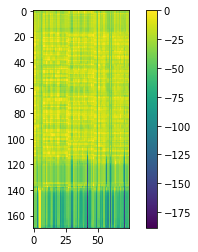

딸------------------라ᅡ리ᄂ는 어지-아 게 이ᅵ  열주-앴 깐-지----------   지-으 ᄃ다라  ᅡᅡ느  벗 ᅩ  므 롸-ᆻᆻᆻᆻ-----------어요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
딸라리는 어지아 게 이 열주앴 깐지 지으 다라 ᅡ느 벗 ᅩ 므 뢌어요.<eos>
딸아이는 어찌나 게임에 열중했던지 제가 다가가는 것도 몰랐어요.<eos>----------------


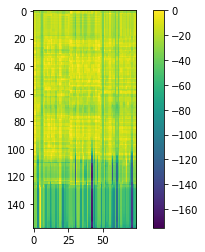

-------------------------------------------------------------------------------------------------------
09-01 17:15:15
Mean Train Loss: 0.010411613200480355
Mean Evaluation Loss: 0.025729674948332528
-------------------------------------------------------------------------------------------------------
09-01 17:15:34
Mean Train Loss: 0.009884221700346633
Mean Evaluation Loss: 0.026132373363068846
-------------------------------------------------------------------------------------------------------
09-01 17:15:54
Mean Train Loss: 0.010440244587221526
Mean Evaluation Loss: 0.025820024272453897
-------------------------------------------------------------------------------------------------------
09-01 17:16:14
Mean Train Loss: 0.01100130145992219
Mean Evaluation Loss: 0.027830427658883137
-------------------------------------------------------------------------------------------------------
09-01 17:16:33
Mean Train Loss: 0.01147460254314133
Mean Evaluation Loss: 0.026303736958487887
--

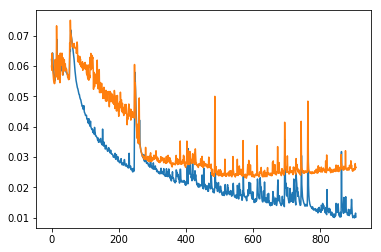

제-----------------간그 오-테ᄅ라의  구연을ᄃ따느ᄃ다는 얘기를 들었을 때---------- ᄌ저ᄂ는 정ᄆ말ᆯᆯᆯ  믿기ᄌ지가 가ᅡᆮᅡ-ᆻᆻᆻ----------------어요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
제간그 오테라의 구연을ᄃ따느다는 얘기를 들었을 때 저는 정말 믿기지가 갇ᅡᆻ어요.<eos>
제가 그 오페라의 주연을 따냈다는 얘기를 들었을 때 저는 정말 믿기지가 않았어요.<eos>------------


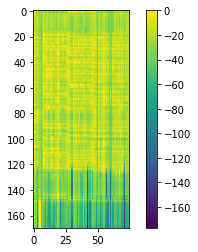

요----------------즘ᄋ에-는ᆫᆫ---  잔기  부-머ᄂ이 인하ᅡ 상행-임을ᆯ--- 준ᆼ뎌-가ᅡ제 않을 ᅡ이  들  많ᆭᆭ---------------------아요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
요즘에는 잔기 부머ᄂ이 인하 상행임을 준ᆼ뎌가제 않을 ᅡ이 들 많아요.<eos>
요즘에는 자기 부모님이나 선생님을 존경하지 않는 아이들이 많아요.<eos>------------


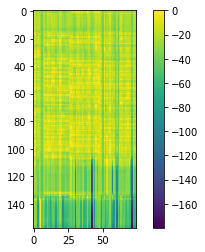

-------------------------------------------------------------------------------------------------------
09-01 17:17:13
Mean Train Loss: 0.010006010094703784
Mean Evaluation Loss: 0.026215833761028325
-------------------------------------------------------------------------------------------------------
09-01 17:17:32
Mean Train Loss: 0.00989774597383055
Mean Evaluation Loss: 0.028518134086135745
-------------------------------------------------------------------------------------------------------
09-01 17:17:52
Mean Train Loss: 0.013580269547754226
Mean Evaluation Loss: 0.02737235958433287
-------------------------------------------------------------------------------------------------------
09-01 17:18:12
Mean Train Loss: 0.011280585286980768
Mean Evaluation Loss: 0.026218269903920705
-------------------------------------------------------------------------------------------------------
09-01 17:18:31
Mean Train Loss: 0.010393400301163832
Mean Evaluation Loss: 0.026011744121155717
--

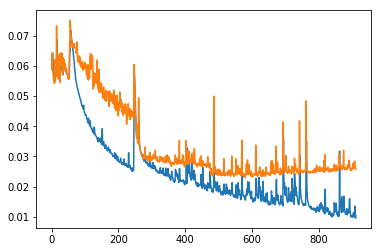

처------------------음 이ᄀ고ᄋᄋᆯ이ᄉ서ᄋ었을 때---------  거-퍼-처  다-는 걱레에 식표ᄑ품 가게ᄀ가 있다는ᆫ 게---   ᄎ참  좋-아---ᆻᆻ-------------어요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
처음 이고ᄋᆯ이서었을 때 거퍼처 다는 걱레에 식표품 가게가 있다는 게 참 좋았어요.<eos>
처음 이곳에 이사 왔을 때 걸어서 닿는 거리에 식료품 가게가 있다는 게 참 좋았어요.<eos>----------


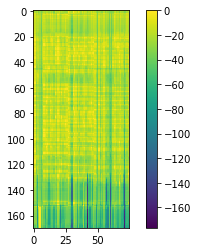

우---------------------리  가-기 ᄋᄋ있는 개-분운에  산돈들이---- ᄋᄋᆯ-럭을ᄉ섯에  패워ᅮ건 들리--ᆸᆸᆸ--------------ᄂ니다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
우리 가기 있는 개분운에 산돈들이 ᄋᆯ럭을섯에 패워ᅮ건 들립니다.<eos>
우리 가게에 있는 대부분의 상품들이 유럽에서 수입해 온 것들입니다.<eos>------------


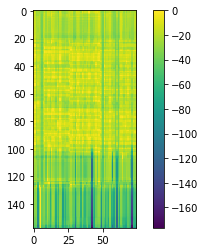

-------------------------------------------------------------------------------------------------------
09-01 17:19:12
Mean Train Loss: 0.010001616593860292
Mean Evaluation Loss: 0.026356972232978674
-------------------------------------------------------------------------------------------------------
09-01 17:19:32
Mean Train Loss: 0.00956814014643826
Mean Evaluation Loss: 0.026170275876761746
-------------------------------------------------------------------------------------------------------
09-01 17:19:51
Mean Train Loss: 0.009575795841239552
Mean Evaluation Loss: 0.02593711850821664
-------------------------------------------------------------------------------------------------------
09-01 17:20:11
Mean Train Loss: 0.00984208080774615
Mean Evaluation Loss: 0.025995334772468032
-------------------------------------------------------------------------------------------------------
09-01 17:20:31
Mean Train Loss: 0.010077378894524957
Mean Evaluation Loss: 0.027717598992600956
---

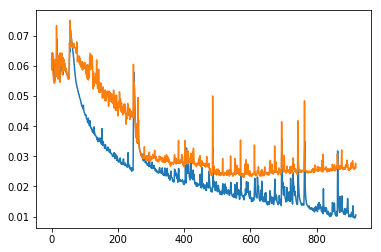

기--------------즘 폼이  계소  들어-면ᅧᆫ서-----  우-린는 저장ᆼ몽ᆼᅡᆼᄋ이 보족하다ᅡ는 사-질을 깨-달아-ᆻᆻᆻ------------------어요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
기즘 폼이 계소 들어면ᅧᆫ서 우린는 저장몽ᅡᆼ이 보족하다는 사질을 깨달았어요.<eos>
기증품이 계속 들어오면서 우리는 저장 공간이 부족하다는 사실을 깨달았어요.<eos>----------------


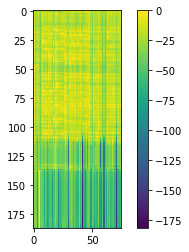

딸----------------라ᅡ이느ᅳᆫ 어찌ᄅ려 게 이 이얼주-해  뜬-지----------   제-가  다라 아ᅡᅡᅡ 벗 도 ᄆᄆᄅᄅ라--ᆻᆻᆻ-----------어요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
딸라이는 어찌려 게 이 이얼주해 뜬지 제가 다라 아 벗 도 ᄆ랐어요.<eos>
딸아이는 어찌나 게임에 열중했던지 제가 다가가는 것도 몰랐어요.<eos>----------------


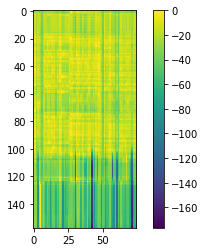

-------------------------------------------------------------------------------------------------------
09-01 17:21:11
Mean Train Loss: 0.010644577523043312
Mean Evaluation Loss: 0.026352606102317905
-------------------------------------------------------------------------------------------------------
09-01 17:21:31
Mean Train Loss: 0.009670588330582415
Mean Evaluation Loss: 0.026366250997022965
-------------------------------------------------------------------------------------------------------
09-01 17:21:50
Mean Train Loss: 0.01008475704529914
Mean Evaluation Loss: 0.027180812057755285
-------------------------------------------------------------------------------------------------------
09-01 17:22:10
Mean Train Loss: 0.010220645474622375
Mean Evaluation Loss: 0.026632349457264764
-------------------------------------------------------------------------------------------------------
09-01 17:22:30
Mean Train Loss: 0.009609193854218072
Mean Evaluation Loss: 0.026245477567813653
-

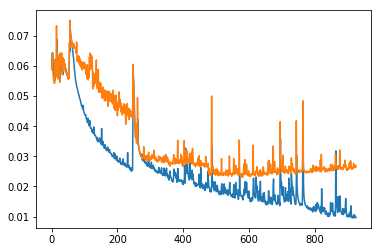

사----------------람들은 멀리 있는 사람을 불릴-때----  소-을 오-믁하-게  반들어ᅥ 입-가-ᅦᅦ 대ᅢ---ᆸᆸ------------ᄂ니다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
사람들은 멀리 있는 사람을 불릴때 소을 오믁하게 반들어 입가ᅦ 댑니다.<eos>
사람들은 멀리 있는 사람을 부를 때 손을 오목하게 만들어 입가에 댑니다.<eos>-------------------


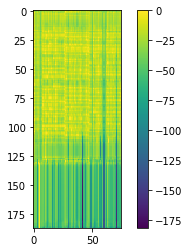

죄-----------------송하ᅡᄌ지-만ᆫ----  서 생니ᅵ 의  계랙은ᆫ--  시-음 가-은 사이 없는 걸 었스ᅳ-ᆸᆸᆸ----------------ᄂ니다..<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
죄송하지만 서 생니 의 계랙은 시음 가은 사이 없는 걸 었습니다.<eos>
죄송하지만, 선생님의 계획은 실현 가능성이 없는 것 같습니다.<eos>--------------


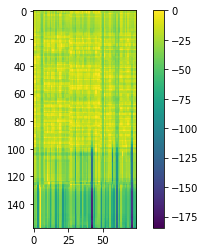

-------------------------------------------------------------------------------------------------------
09-01 17:23:10
Mean Train Loss: 0.00960014915261852
Mean Evaluation Loss: 0.026814831711773963
-------------------------------------------------------------------------------------------------------
09-01 17:23:30
Mean Train Loss: 0.009240329356496269
Mean Evaluation Loss: 0.026485991914533037
-------------------------------------------------------------------------------------------------------
09-01 17:23:49
Mean Train Loss: 0.009635557110306267
Mean Evaluation Loss: 0.02712073539013068
-------------------------------------------------------------------------------------------------------
09-01 17:24:09
Mean Train Loss: 0.010932556669924548
Mean Evaluation Loss: 0.027882249367132978
-------------------------------------------------------------------------------------------------------
09-01 17:24:29
Mean Train Loss: 0.014032914098929733
Mean Evaluation Loss: 0.027484528428634723
--

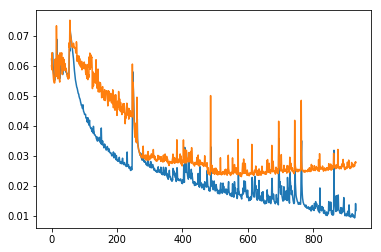

저--------------------승이 고-엘ᄋ이사 았을 때--------  거-얼서ᅥ 달-드 겋이ᄋ에 십욯품 가게가 있-다는 ᅦᅦᅦ---   차-ᆷ  좋-ᄋ아--ᆻᆻ-------------어요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
저승이 고엘이사 았을 때 거얼서 달드 겋이에 십욯품 가게가 있다는 ᅦ 참 좋았어요.<eos>
처음 이곳에 이사 왔을 때 걸어서 닿는 거리에 식료품 가게가 있다는 게 참 좋았어요.<eos>----------


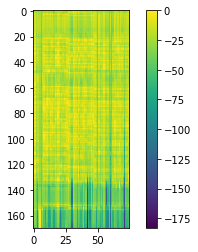

여-----------------ᆼ-과  오-ᅳᆫᆼ활-명의 에-국인 ᄀ광-당게-들이--  서-ᅮᆯ을  방물하ᄀ고 이--------------ᆻ다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
영과 오ᅳᆫᆼ활명의 에국인 광당게들이 서ᅮᆯ을 방물하고 있다.<eos>
연간 오백만 명의 외국인 관광객들이 서울을 방문하고 있다.<eos>-----------------


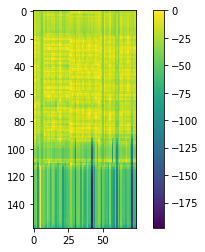

-------------------------------------------------------------------------------------------------------
09-01 17:25:09
Mean Train Loss: 0.012804099899428985
Mean Evaluation Loss: 0.026549195425370358
-------------------------------------------------------------------------------------------------------
09-01 17:25:29
Mean Train Loss: 0.010266185296444326
Mean Evaluation Loss: 0.026452698547027607
-------------------------------------------------------------------------------------------------------
09-01 17:25:49
Mean Train Loss: 0.00986309938123598
Mean Evaluation Loss: 0.026682303662597426
-------------------------------------------------------------------------------------------------------
09-01 17:26:09
Mean Train Loss: 0.01042638036277119
Mean Evaluation Loss: 0.02634081353459028
-------------------------------------------------------------------------------------------------------
09-01 17:26:28
Mean Train Loss: 0.009710584241585149
Mean Evaluation Loss: 0.026650414394731613
---

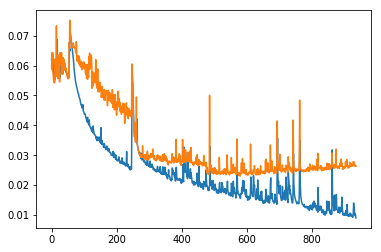

저----------는 귀-가 어-두ᅮ은 데ᅦ---  다-른 사ᄅ람에 얘-기를ᆯ-   아-주 자ᅡᆯ 둘여 준다ᄂ는 말을ᆯ  많ᆭ이-들 와ᅪᄋ-ᆻᆻ--------------어요.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
저는 귀가 어두은 데 다른 사람에 얘기를 아주 잘 둘여 준다는 말을 많이들 와ᄋᆻ어요.<eos>
저는 귀가 어두운데 다른 사람의 얘기를 아주 잘 들어 준다는 말을 많이 들어왔어요.<eos>-----------


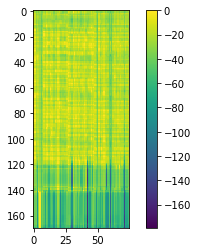

그 -------------------사ᅡ람은 수--자-이-에ᄉ서-----  자-ᄀ기 예-나ᅡ 이-학기ᄅ로--  사-람-드ᄅ이 지-교한기ᅵ 난 드----------------ᆫᆫ다..<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
그 사람은 수자이에서 자기 예나 이학기로 사람드ᄅ이 지교한기 난 든다.<eos>
그 사람은 술자리에서 자기 옛날이야기로 사람들을 지루하게 만든다.<eos>---------------


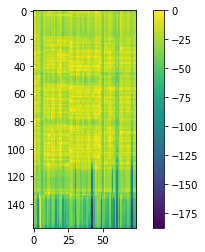

-------------------------------------------------------------------------------------------------------
09-01 17:27:08
Mean Train Loss: 0.01081937151049472
Mean Evaluation Loss: 0.02775537406287975
-------------------------------------------------------------------------------------------------------
09-01 17:27:28
Mean Train Loss: 0.011948500960545519
Mean Evaluation Loss: 0.027297524841528024
-------------------------------------------------------------------------------------------------------
09-01 17:27:48
Mean Train Loss: 0.011174269113280361
Mean Evaluation Loss: 0.02671740404185264
-------------------------------------------------------------------------------------------------------
09-01 17:28:07
Mean Train Loss: 0.01044225584497751
Mean Evaluation Loss: 0.026594155567520844
-------------------------------------------------------------------------------------------------------
09-01 17:28:27
Mean Train Loss: 0.01014310400328813
Mean Evaluation Loss: 0.026682193248812398
-----

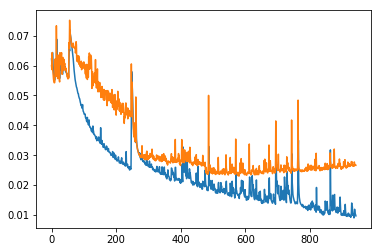

시--------------------ᆷ-사-ᄉ수-곡궅-테-------  귀-혀를 선말하지 않기로 결ᆯ정했슴을 알려들 게 되-어  육-감이---ᆸᆸᆸᆸ--------------니다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
심사수곡궅테 귀혀를 선말하지 않기로 결정했슴을 알려들 게 되어 육감입니다.<eos>
심사숙고 끝에 귀하를 선발하지 않기로 결정했음을 알려드리게 되어 유감입니다.<eos>--------------


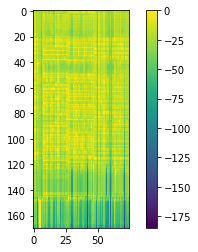

그 ----------------사ᅡ람ᆷ하- 보 식웅에-사-간 이-기-안-다ᄂ는-게----------  ᄂ나-로-소ᄂ는 영간 유 뎡일이 아-----------------------니야.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
그 사람하 보 식웅에사간 이기안다는게 나로소는 영간 유 뎡일이 아니야.<eos>
그 사람하고 십 분 이상 간 얘기한다는 게 나로서는 여간 힘든 일이 아냐.<eos>--------


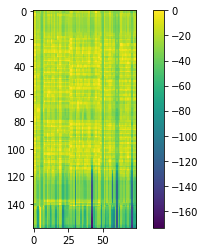

-------------------------------------------------------------------------------------------------------
09-01 17:29:07
Mean Train Loss: 0.009093273097690273
Mean Evaluation Loss: 0.026139562938433024
-------------------------------------------------------------------------------------------------------
09-01 17:29:27
Mean Train Loss: 0.01025959023928399
Mean Evaluation Loss: 0.026771476632372976
-------------------------------------------------------------------------------------------------------
09-01 17:29:47
Mean Train Loss: 0.012957648657173802
Mean Evaluation Loss: 0.027144143428664638
-------------------------------------------------------------------------------------------------------
09-01 17:30:06
Mean Train Loss: 0.01163251306597459
Mean Evaluation Loss: 0.027738047774415433
-------------------------------------------------------------------------------------------------------
09-01 17:30:26
Mean Train Loss: 0.011202897458630135
Mean Evaluation Loss: 0.027150175313175814
--

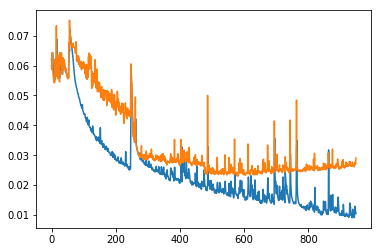

저-------------희  뵈-장이  모-ᄃ두  푸-목ᄋ이---- ᄋ이-번-주ᄋ에  최ᄀᄀ고ᅩ---  사-신 퍼ᄉ선ᄐ틀까ᄌᄌ지-  팔인 판배-를 하--ᆸᆸᆸᆸ---------ᄂ니다.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
저희 뵈장이 모두 푸목이 이번주에 최고 사신 퍼선틀까지 팔인 판배를 합니다.<eos>
저희 매장의 모든 품목이 이번 주에 최고 삼십 퍼센트까지 할인 판매를 합니다.<eos>-----------------


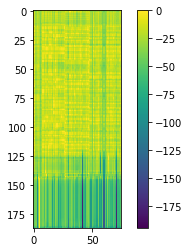

그 --------------사ᅡ라ᅡᆷ악고 ᄉᄉᆸᆸᄇᆫᆼ히 사-단 일기-한-다ᄂ는 게----------  아ᅧᄅ로-소ᄂ는 녁건 이 ᄂᆫᆼ이-이 ᄋᄋ-----------------------니야.<eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos><eos>
그 사람악고 ᄉᆸᄇᆫᆼ히 사단 일기한다는 게 아ᅧ로소는 녁건 이 ᄂᆫᆼ이이 ᄋ니야.<eos>
그 사람하고 십 분 이상 간 얘기한다는 게 나로서는 여간 힘든 일이 아냐.<eos>--------


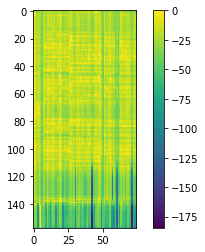

-------------------------------------------------------------------------------------------------------
09-01 17:31:07
Mean Train Loss: 0.01065085149446016
Mean Evaluation Loss: 0.027114275178492724
-------------------------------------------------------------------------------------------------------
09-01 17:31:26
Mean Train Loss: 0.009445884534862269
Mean Evaluation Loss: 0.02691081589910818
-------------------------------------------------------------------------------------------------------
09-01 17:31:46
Mean Train Loss: 0.009444726631036439
Mean Evaluation Loss: 0.026569819678450634
-------------------------------------------------------------------------------------------------------
09-01 17:32:06
Mean Train Loss: 0.008943002156325897
Mean Evaluation Loss: 0.026246090336200675
-------------------------------------------------------------------------------------------------------
09-01 17:32:25
Mean Train Loss: 0.008623970373094689
Mean Evaluation Loss: 0.026481573458739843
--

KeyboardInterrupt: ignored

In [29]:
EPOCH = 3 * 60 * 4
    
try:
    net.load('gdrive/My Drive/korean-single-speaker-speech-dataset/kss/model_saved/CTC_eval_2')
except:
    print("Loading Error")
    
for epoch in range(EPOCH):
    
    print(datetime.now().strftime('%m-%d %H:%M:%S'))
    
    net.set_mode('train')
    preloader_train.initialize_batch()
    loss_list_train = list()
    
    while preloader_train.end_flag == False:
        tensor_input, ground_truth, loss_mask, length_list = preloader_train.get_batch()
        pred_tensor, loss = net.train(tensor_input.to(device), ground_truth.to(device), loss_mask.to(device), length_list.to(device))
        loss_list_train.append(loss)

    print("Mean Train Loss: {}".format(np.mean(np.asarray(loss_list_train))))
    loss_history_train.append(np.mean(np.asarray(loss_list_train)))
    
    net.set_mode('eval')
    preloader_test.initialize_batch()
    loss_list_eval = list()
    
    while preloader_test.end_flag == False:
        tensor_input, ground_truth_, loss_mask, length_list = preloader_test.get_batch()
        pred_tensor_, loss = net.test(tensor_input.to(device), ground_truth_.to(device), loss_mask.to(device), length_list.to(device))
        loss_list_eval.append(loss)

    print("Mean Evaluation Loss: {}".format(np.mean(np.asarray(loss_list_eval))))
    loss_history_eval.append(np.mean(np.asarray(loss_list_eval)))
    
    
    net.save('gdrive/My Drive/korean-single-speaker-speech-dataset/kss/model_saved/CTC_eval_2_')
    np.save('gdrive/My Drive/korean-single-speaker-speech-dataset/kss/model_saved/loss_history_train_2_.npy', loss_history_train)
    np.save('gdrive/My Drive/korean-single-speaker-speech-dataset/kss/model_saved/loss_history_eval_2_.npy', loss_history_eval)
    
    
    if ((epoch != 0) and (epoch % 6 == 0)):
        
        plt.figure()
        plt.plot(loss_history_train)
        plt.plot(loss_history_eval)
        plt.show()
        
        _, index = pred_tensor[:, 0, :].max(-1)

        sentence = tokenizer.num2word(index.view(-1))
        print(''.join(sentence))
        index_ = Decode_CTC_Prediction(index)
        sentence_ = tokenizer.num2word(index_)
        print(''.join(sentence_))
        true_sentence = tokenizer.num2word(ground_truth[0, :].detach().numpy().astype(int))
        print(''.join(true_sentence))

        plt.figure()
        plt.imshow(pred_tensor[:, 0, :].detach().cpu().numpy())
        plt.colorbar()
        plt.show()
        
        _, index = pred_tensor_[:, 0, :].max(-1)

        sentence = tokenizer.num2word(index.view(-1))
        print(''.join(sentence))
        index_ = Decode_CTC_Prediction(index)
        sentence_ = tokenizer.num2word(index_)
        print(''.join(sentence_))
        true_sentence = tokenizer.num2word(ground_truth_[0, :].detach().numpy().astype(int))
        print(''.join(true_sentence))

        plt.figure()
        plt.imshow(pred_tensor_[:, 0, :].detach().cpu().numpy())
        plt.colorbar()
        plt.show()
        
        
                        
    print("-------------------------------------------------------------------------------------------------------")